## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'agriVision-full' 
TRANSFORM = 'gabor'
CHANNEL = 'gray'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
gray_gabor_full_agriVision.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = True
SKIP_OPTIMIZE_STEP = False
CWD

'd:\\new research\\hierarchical-bayesian-model-validation\\results\\case-studies\\agriVision\\full\\gabor\\gray'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 262144000,
 1: 262144000,
 2: 262144000,
 3: 262144000,
 4: 262144000,
 5: 262144000,
 6: 262144000,
 7: 262144000,
 8: 262144000,
 9: 262144000,
 10: 262144000,
 11: 262144000,
 12: 262144000,
 13: 262144000,
 14: 262144000,
 15: 262144000,
 16: 262144000,
 17: 262144000,
 18: 262144000,
 19: 262144000,
 20: 262144000,
 21: 262144000,
 22: 262144000,
 23: 262144000,
 24: 262144000,
 25: 262144000,
 26: 262144000,
 27: 262144000,
 28: 262144000,
 29: 262144000,
 30: 262144000,
 31: 262144000,
 32: 262144000,
 33: 262144000,
 34: 262144000,
 35: 262144000,
 36: 262144000,
 37: 262144000,
 38: 262144000,
 39: 262144000,
 40: 262144000,
 41: 262144000}

Running 12760 CDFs


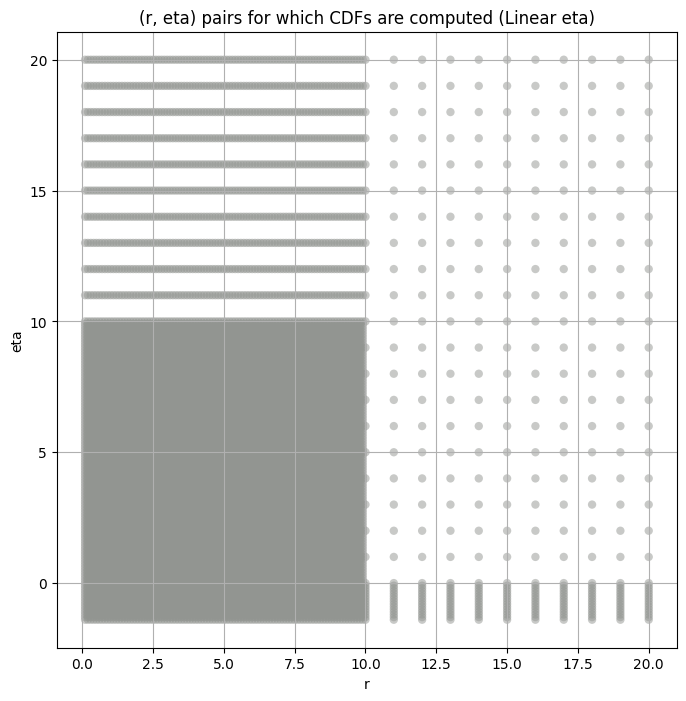

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,51.872887,22.969347,288.606600,556.33234,6.812027,731.13670,262144000.0,"(2.0, 0.5, 0.044)"
1,23.477310,11.694446,201.420790,1299.65230,4.399985,851.55240,262144000.0,"(2.0, 0.5, 0.065)"
2,18.258923,8.203281,104.030300,593.67505,5.334007,779.42900,262144000.0,"(2.0, 0.5, 0.096)"
3,10.848763,4.481118,108.215090,1874.30220,7.118456,856.95690,262144000.0,"(2.0, 0.5, 0.141)"
4,6.613406,1.802558,46.848503,1015.11694,14.294805,876.53973,262144000.0,"(2.0, 0.5, 0.208)"
5,0.872835,0.353022,8.381213,1746.88130,7.294063,860.37410,262144000.0,"(2.0, 0.5, 0.306)"
6,0.756728,0.223613,6.795845,1347.04060,11.058815,863.99970,262144000.0,"(2.0, 0.5, 0.45)"
7,95.540840,29.056345,1063.495000,2448.39900,8.085478,921.79800,262144000.0,"(2.0, 1.0, 0.044)"
8,41.442993,14.082063,361.415200,1426.72180,6.772509,859.86170,262144000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,51.872887,51.872887,32.514881,29.012688,25.548838
1,23.477310,23.477310,15.470115,14.334208,13.079947
2,18.258923,18.258923,11.597221,10.097536,8.851629
3,10.848763,10.848763,6.107337,5.610655,5.032302
4,6.613406,6.613406,3.080577,2.592857,2.117041
5,0.872835,0.872835,0.501569,0.457676,0.409408
6,0.756728,0.756728,0.376947,0.306005,0.251493
7,95.540840,95.540840,42.789570,37.225708,32.068394
8,41.442993,41.442993,20.860491,18.262276,15.881970


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.016802927267472012 51.872887


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.0054105311682352 32.51488


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.002334954309804557 29.012688


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.0030967030161279836 25.548838
Number of samples: 100000, Without approximation : 262144000.0


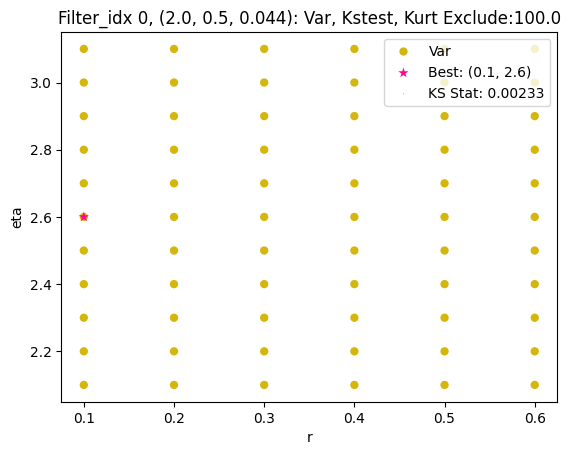

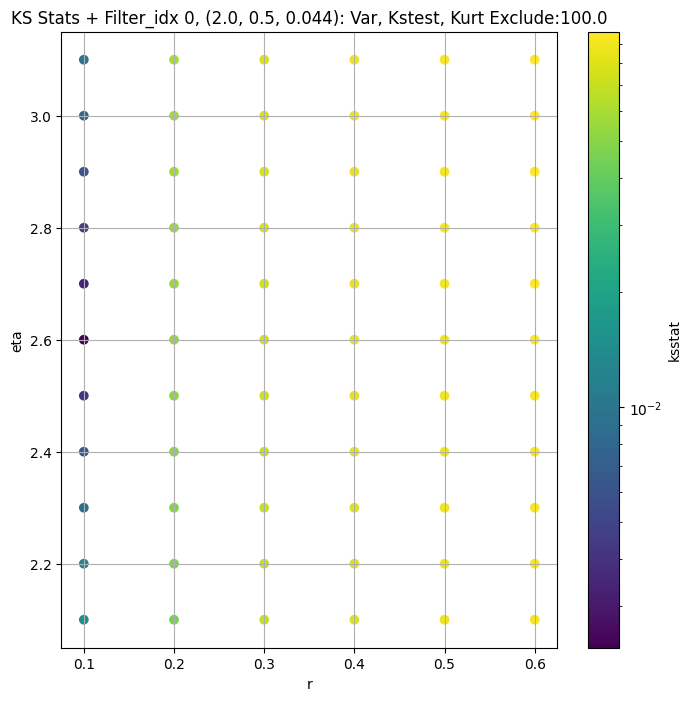

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.012483552167015945 23.47731


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.0014736256813167037 15.470115


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.0015479507589353236 14.3342085


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.002977223922485497 13.079947
Number of samples: 100000, Without approximation : 262144000.0


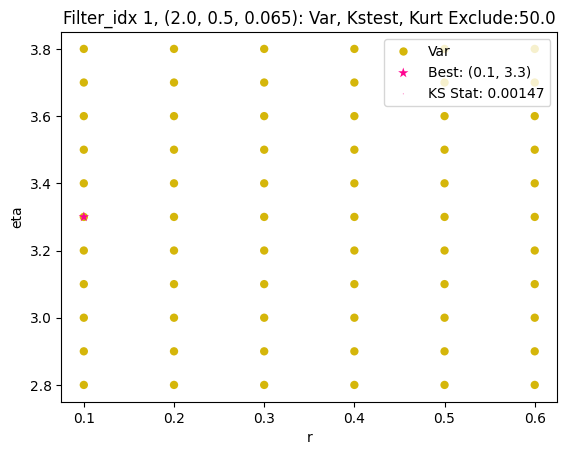

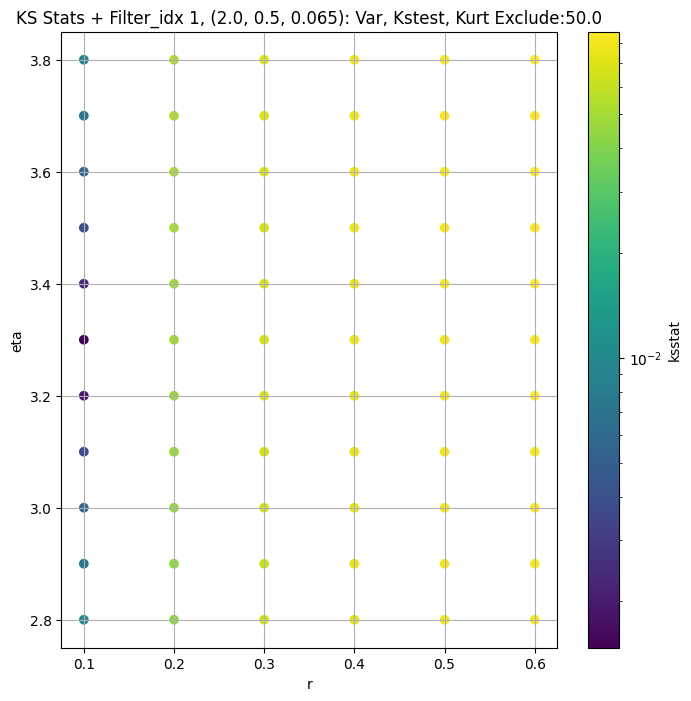

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.014050681692761802 18.258923


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.002548767528414153 11.597221


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.0019428252441117122 10.097536


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.003353876009952926 8.851629
Number of samples: 100000, Without approximation : 262144000.0


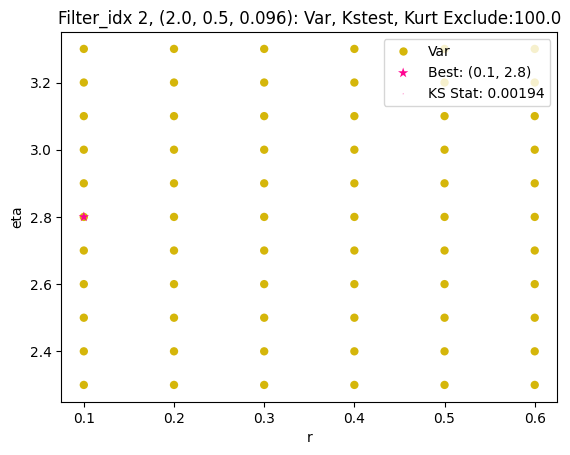

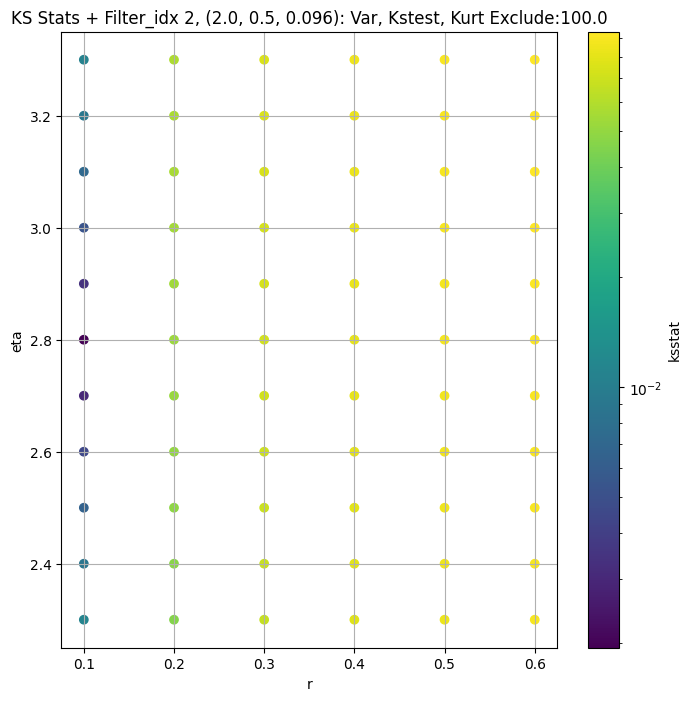

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.015555983090432865 10.848763


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.004536858000889543 6.1073375


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.002597387743356272 5.610655


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.0041853108891496404 5.032302
Number of samples: 100000, Without approximation : 262144000.0


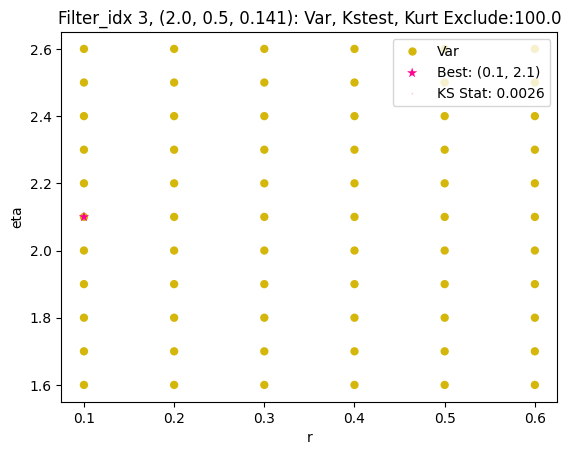

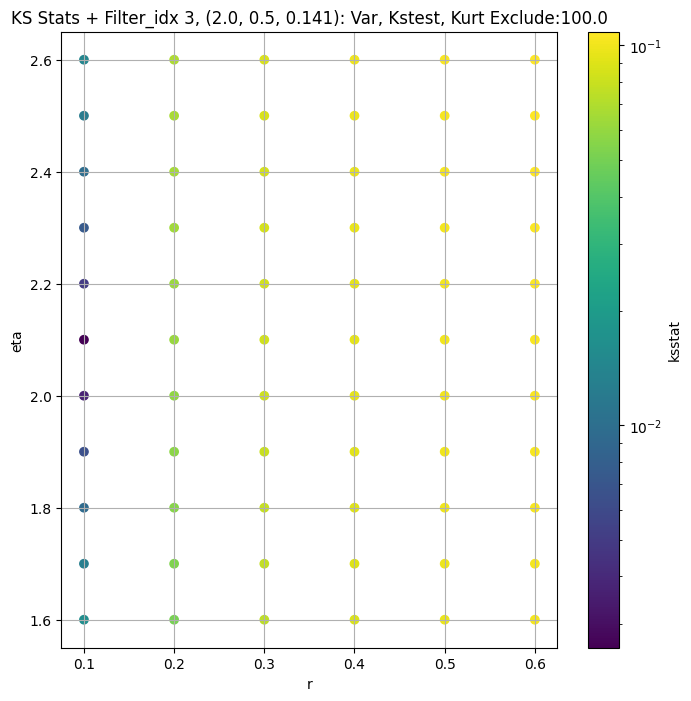

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.028496718823338374 6.6134057


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.01490159403831004 3.0805771


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.011242791995043966 2.5928571


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.006012581088126079 2.1170406
Number of samples: 100000, Without approximation : 262144000.0


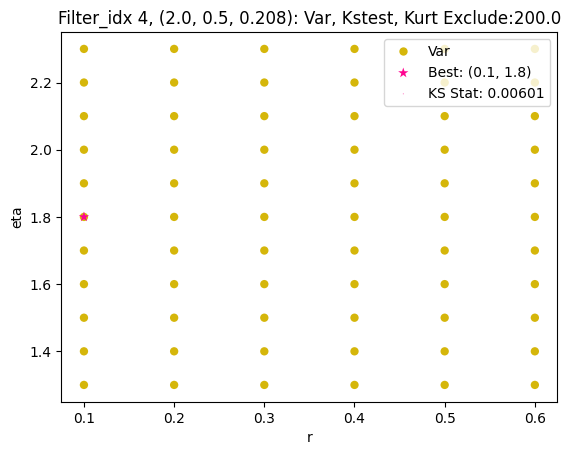

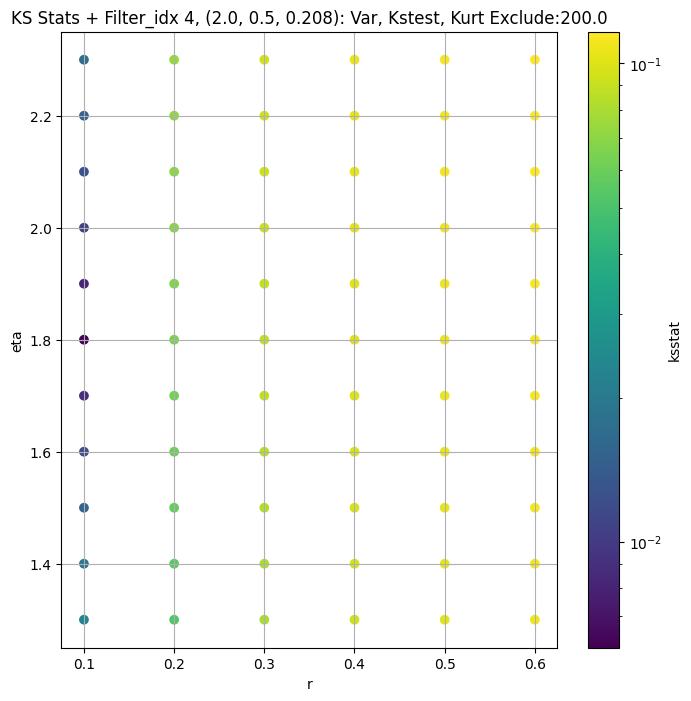

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.017535696092451536 0.87283534


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.006893323148336961 0.5015694


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.005064158155361154 0.4576763


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.005547712776141189 0.40940794
Number of samples: 100000, Without approximation : 262144000.0


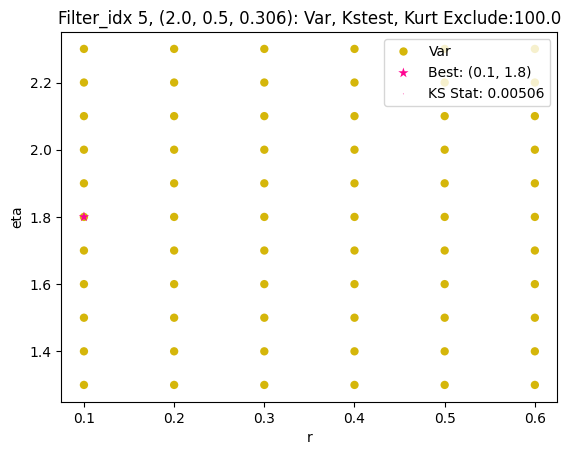

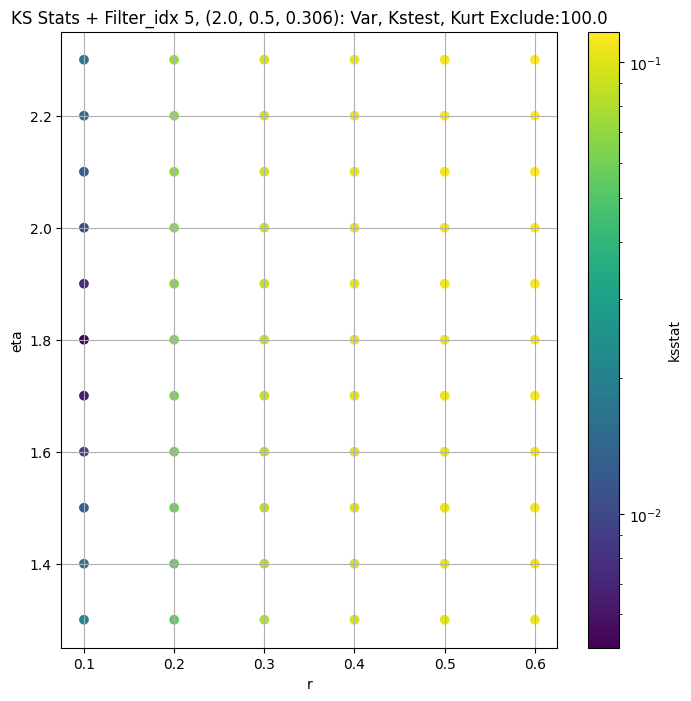

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.023280296454886273 0.7567278


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.011790752965713774 0.3769472


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.007467920799810013 0.30600464


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.004563500628726343 0.25149262
Number of samples: 100000, Without approximation : 262144000.0


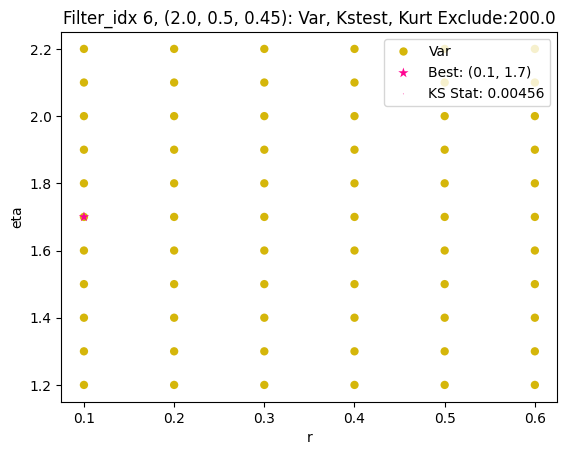

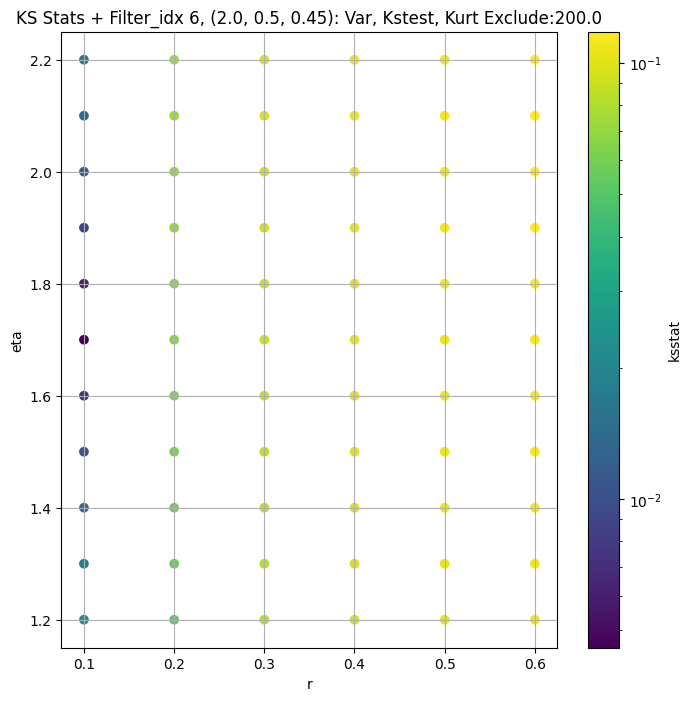

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.027290907232176975 95.54084


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.008156840821567757 42.78957


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.004756371435553852 37.225708


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.0030325482263924286 32.068394
Number of samples: 100000, Without approximation : 262144000.0


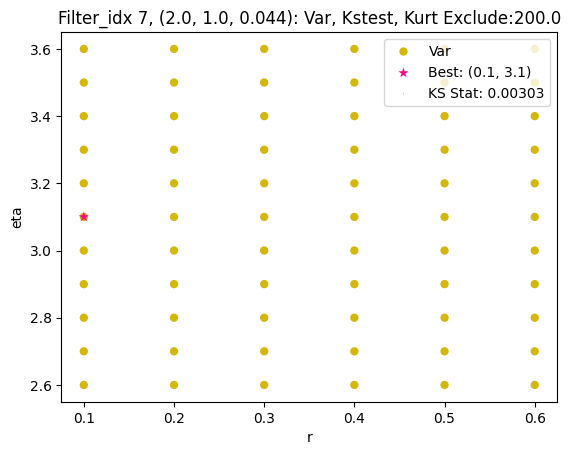

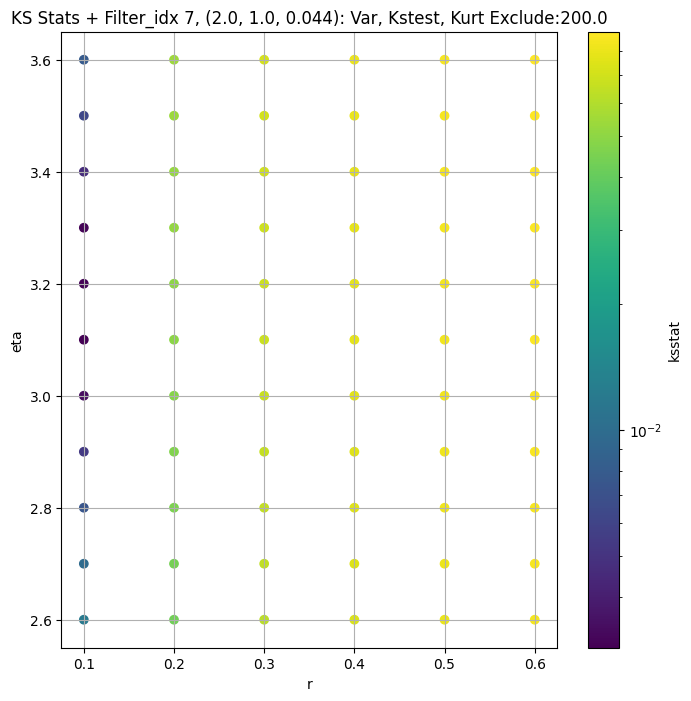

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.02205370515769156 41.442993


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.005553531859232075 20.86049


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.001677942508442859 18.262276


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.002595850733778063 15.88197
Number of samples: 100000, Without approximation : 262144000.0


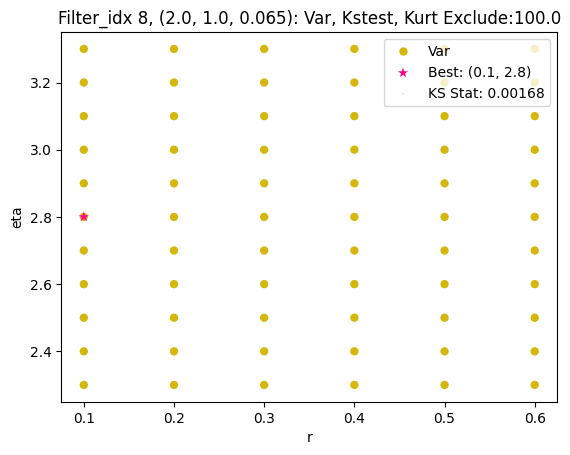

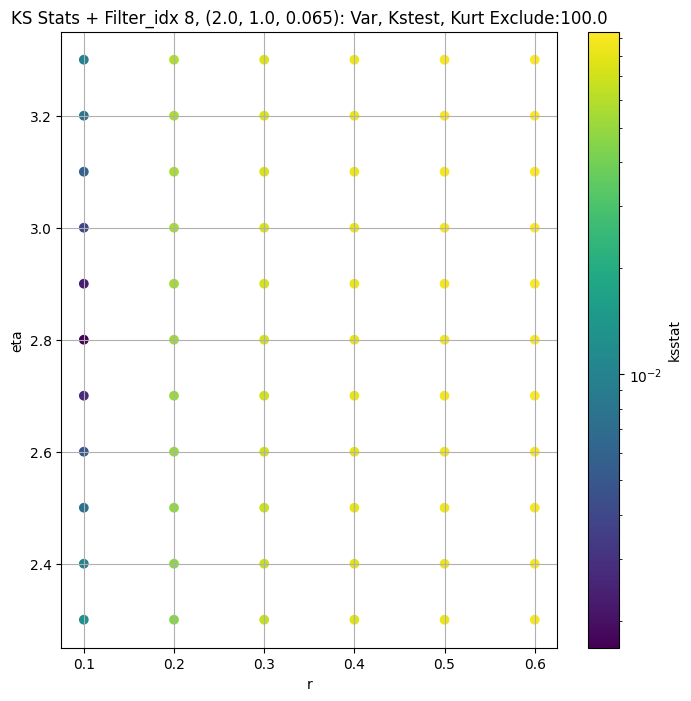

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.011482173270723685 17.597395


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.0021442167764302855 12.041245


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.0017579316904547271 11.090223


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.0032242156223301153 9.997417
Number of samples: 100000, Without approximation : 262144000.0


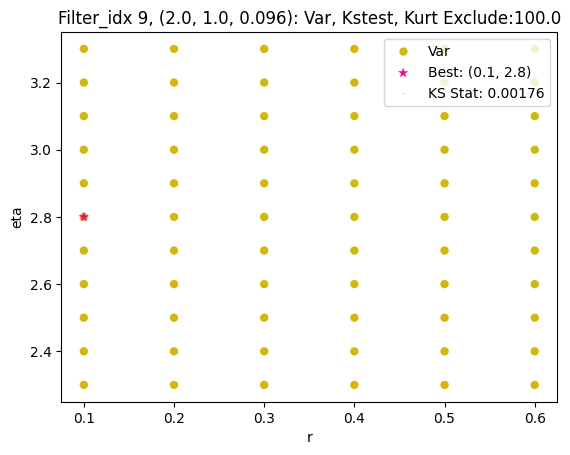

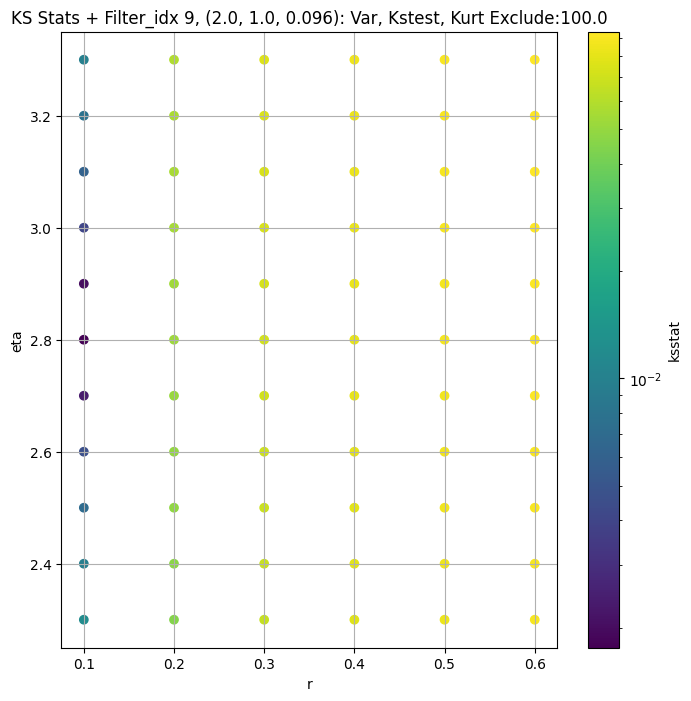

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.016479946651086985 14.930193


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.0025246059799139686 7.8523397


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.002629853008372131 7.009262


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.0036973662077851577 6.2670035
Number of samples: 100000, Without approximation : 262144000.0


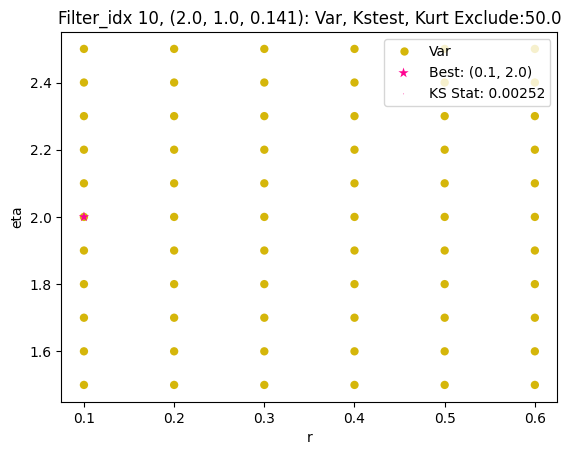

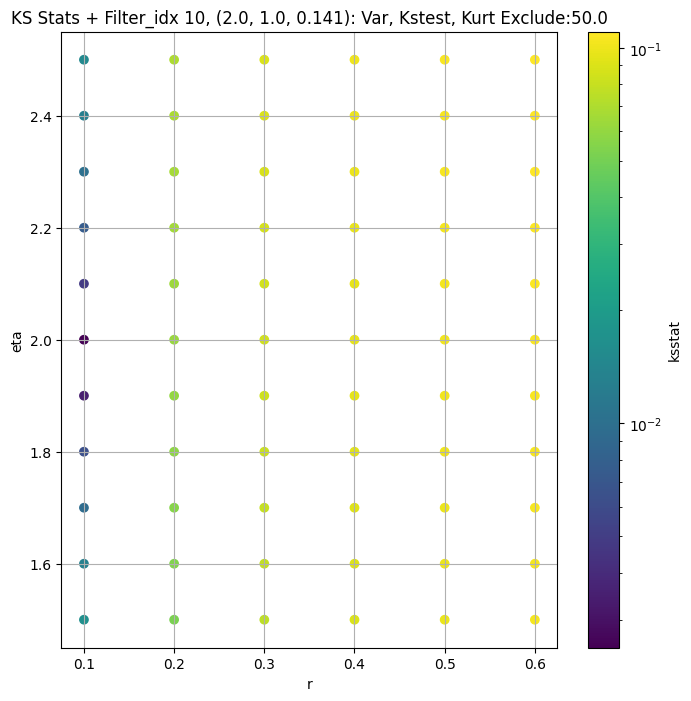

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.030211892193666656 11.726542


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.015645608673664407 5.5748415


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.011080873077618625 4.198413


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.005278602020896694 3.2211928
Number of samples: 100000, Without approximation : 262144000.0


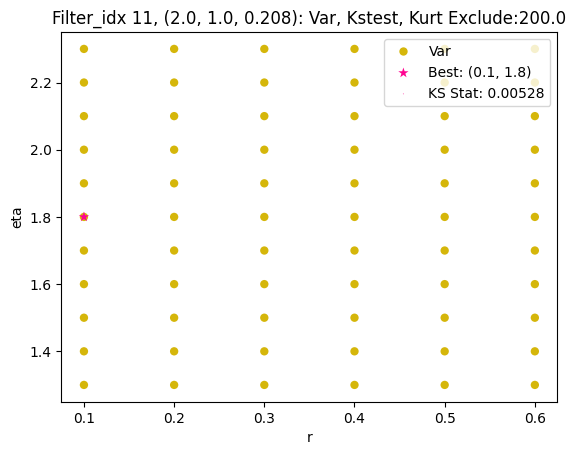

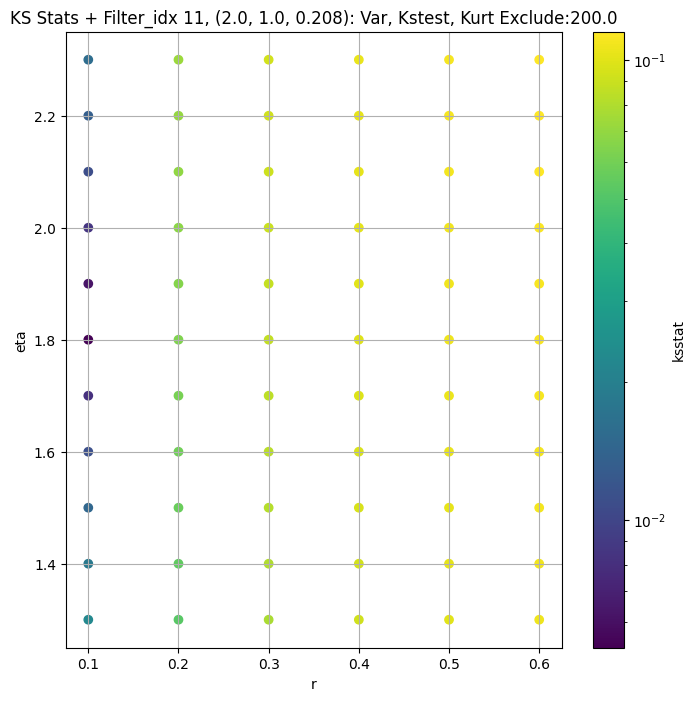

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.020892519421671973 2.1433356


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.00983097161129598 1.1630385


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.008132030438570248 1.0406541


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.005161435707225048 0.9034688
Number of samples: 100000, Without approximation : 262144000.0


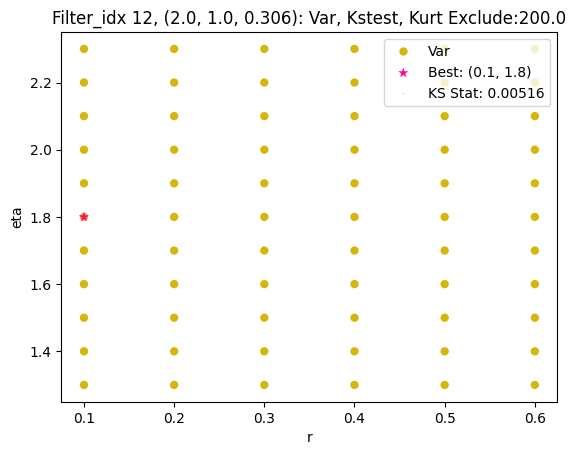

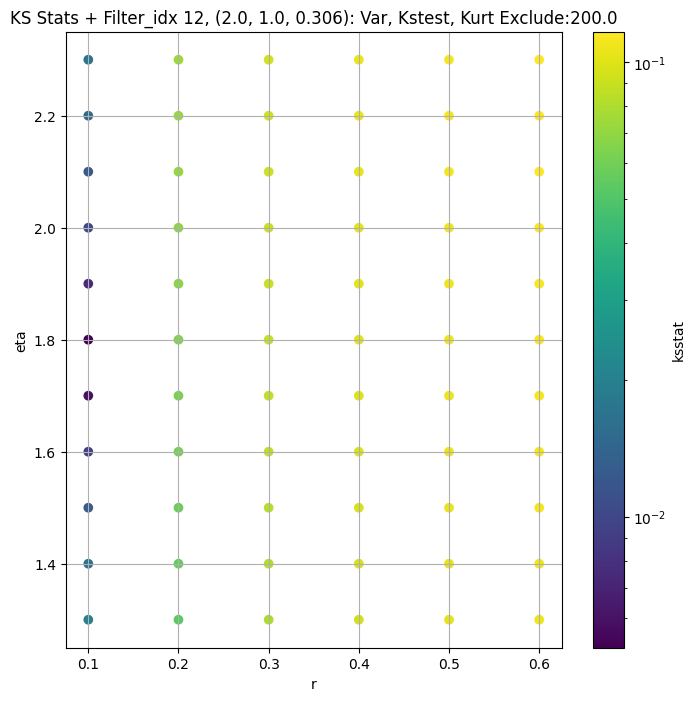

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.027193359586544452 0.83858764


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.011129516196465336 0.3507183


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.007321950965325841 0.29131594


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.004160799469360266 0.24089026
Number of samples: 100000, Without approximation : 262144000.0


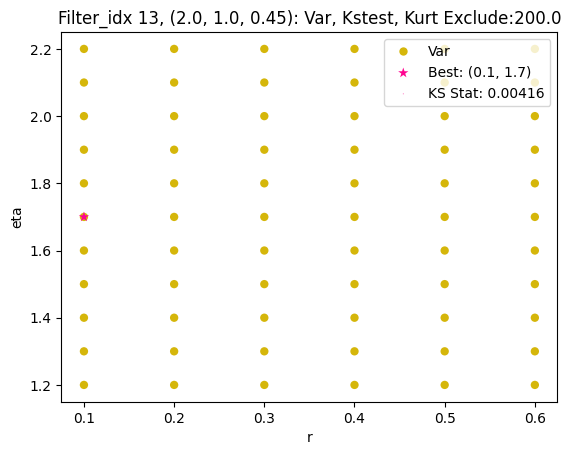

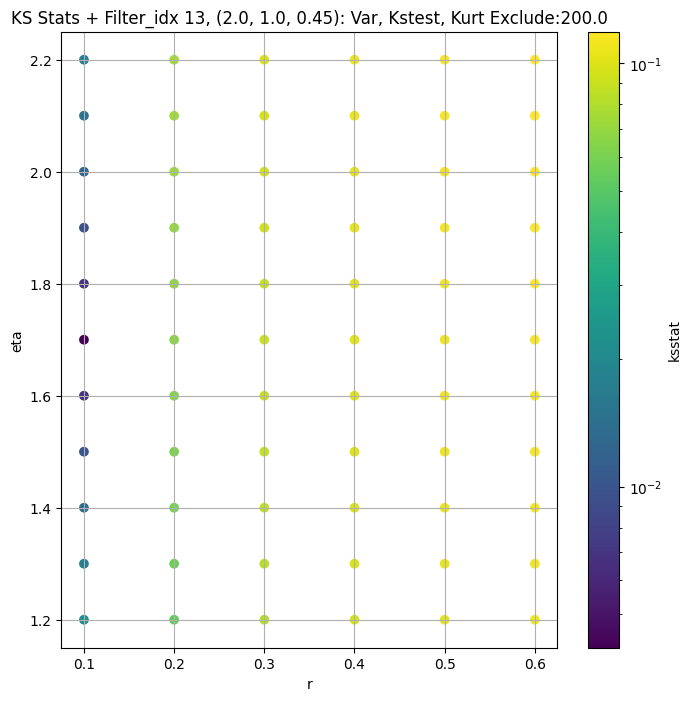

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.016952251481125502 48.090115


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.004255557446366562 28.125841


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.0015666620991552208 25.253958


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.0027828492676039707 22.276834
Number of samples: 100000, Without approximation : 262144000.0


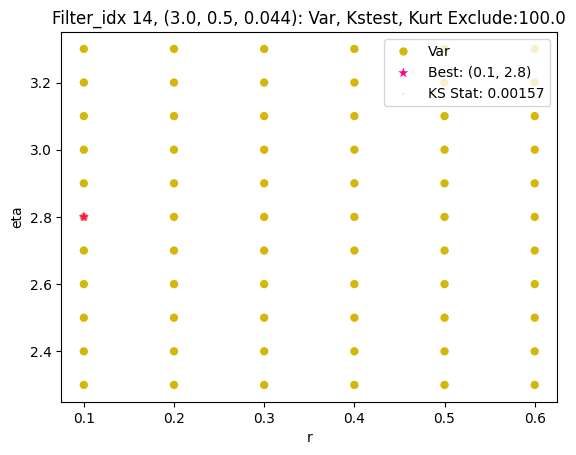

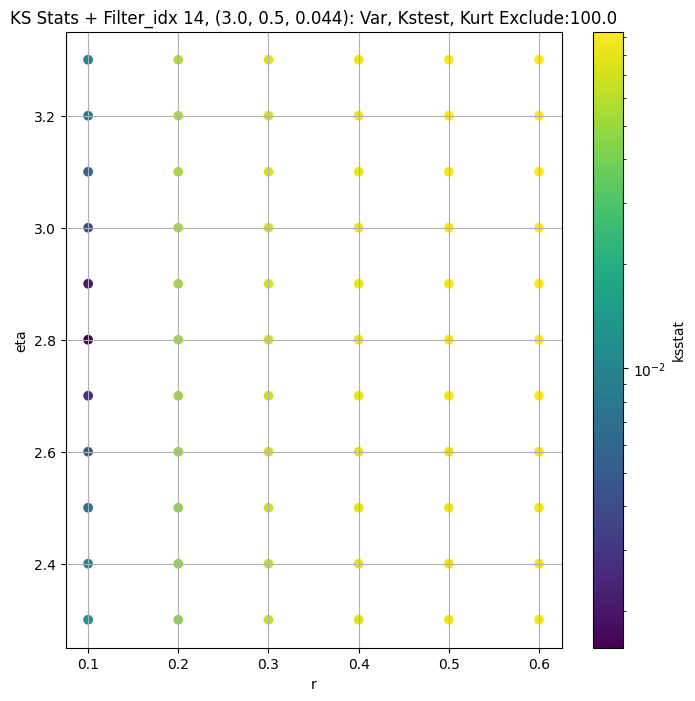

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.024390119295428225 38.40321


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.006018277398318839 17.632387


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.001409586058293777 14.775722


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.0026207045006686677 12.693781
Number of samples: 100000, Without approximation : 262144000.0


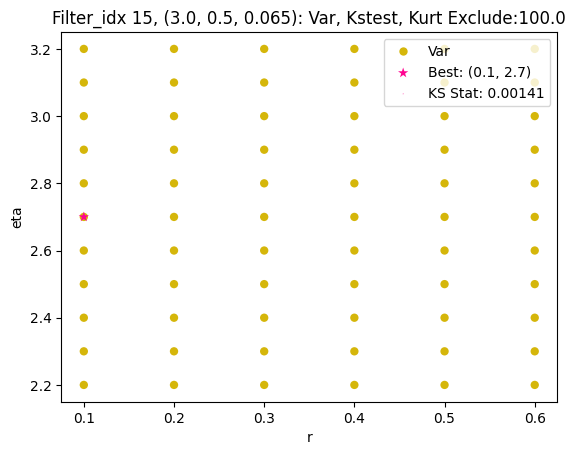

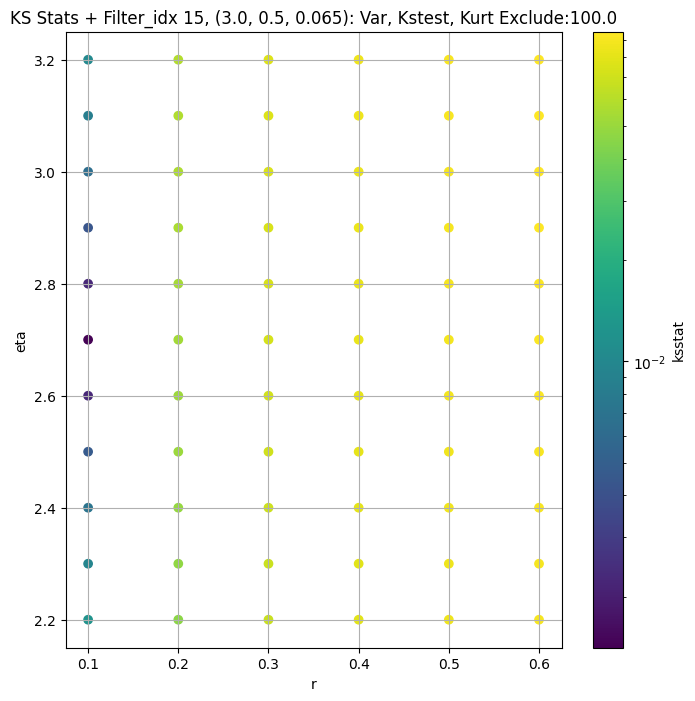

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.023127304495450307 31.962946


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.009198539013178297 15.8819065


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.003979152924884585 12.747089


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.002940734367504527 10.3981905
Number of samples: 100000, Without approximation : 262144000.0


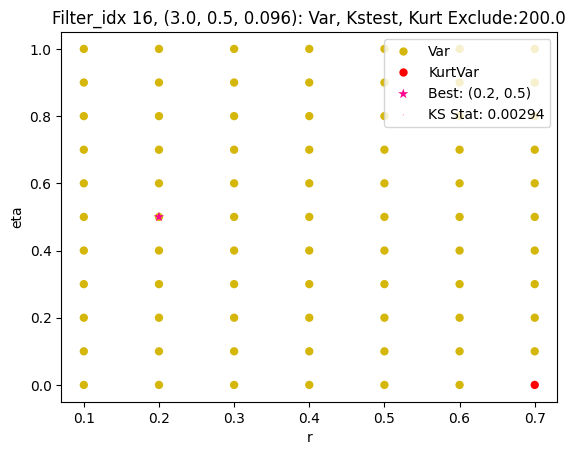

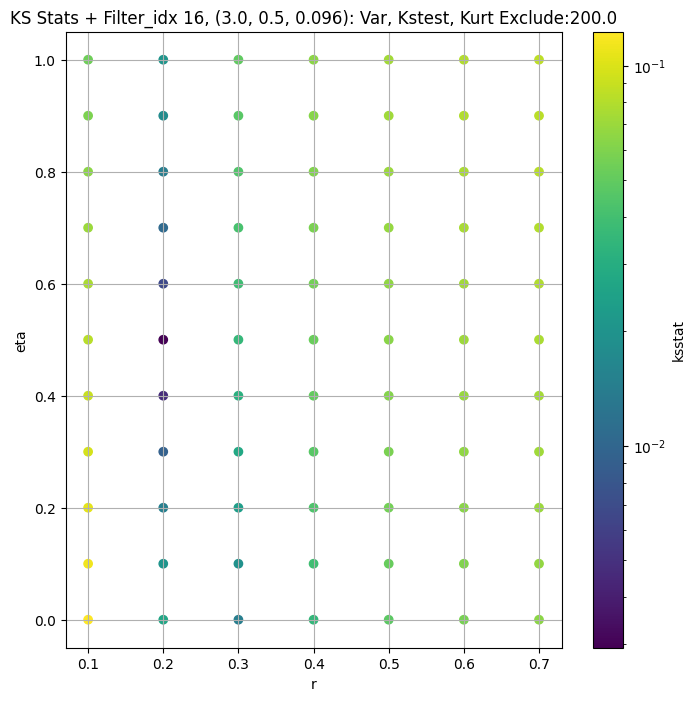

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.032834766078439825 29.144705


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.01251820313998829 9.7918415


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.005606577205413021 7.1785398


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.004199818243557529 5.7724757
Number of samples: 100000, Without approximation : 262144000.0


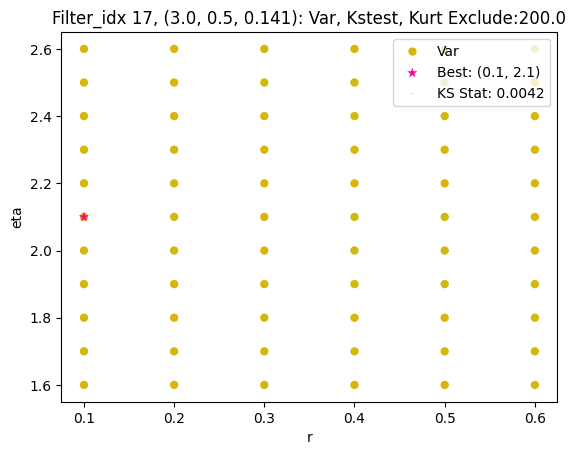

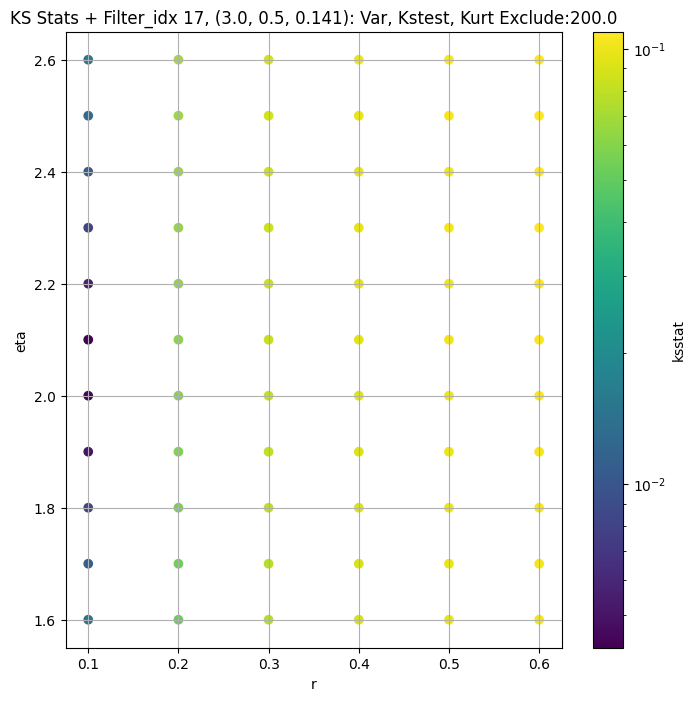

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.021854354629360806 3.9895124


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.009804802783644151 2.257871


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.006680565698527707 1.8792771


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.005091905254453799 1.5897738
Number of samples: 100000, Without approximation : 262144000.0


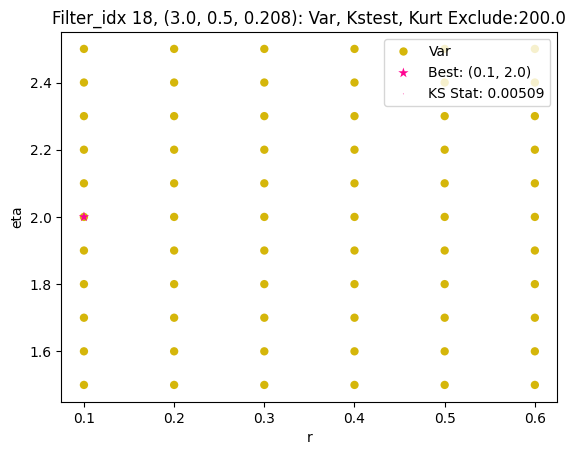

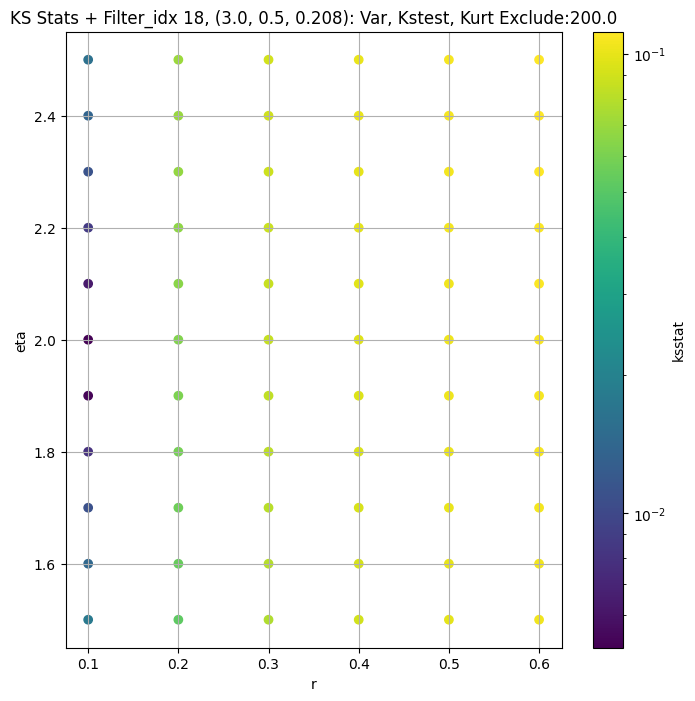

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.023774063047138486 1.0756308


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.013390911908516823 0.59353215


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.011378231051082044 0.5066247


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.008687800818354297 0.42010185
Number of samples: 100000, Without approximation : 262144000.0


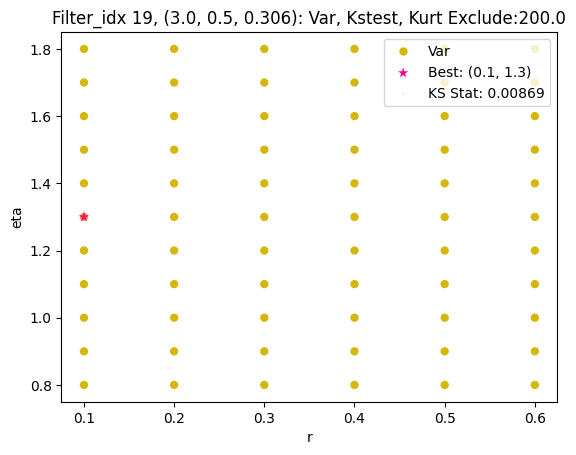

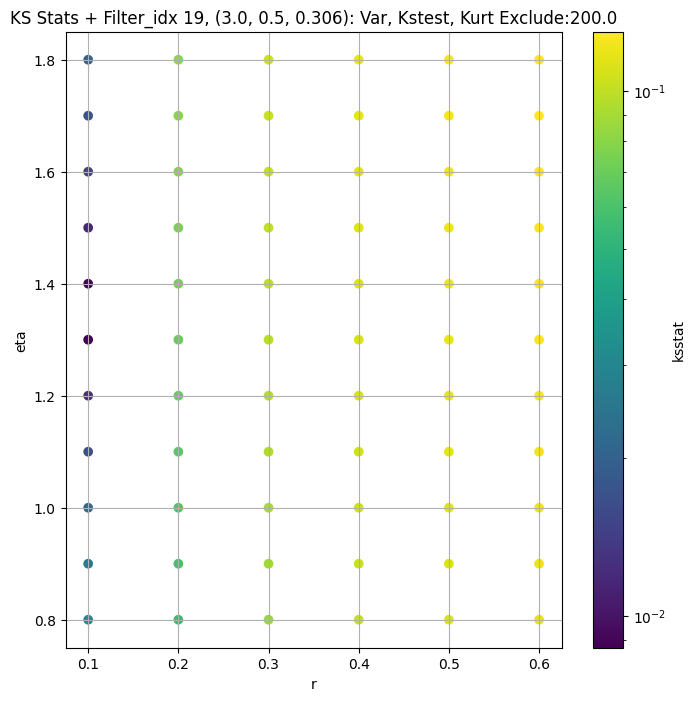

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.032683687111082604 0.29424062


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.014061601521099365 0.11223458


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.0105582283092569 0.095269926


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.007393867663277431 0.07980207
Number of samples: 100000, Without approximation : 262144000.0


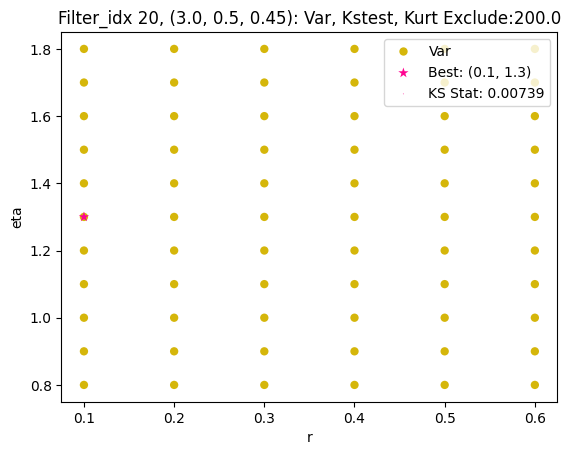

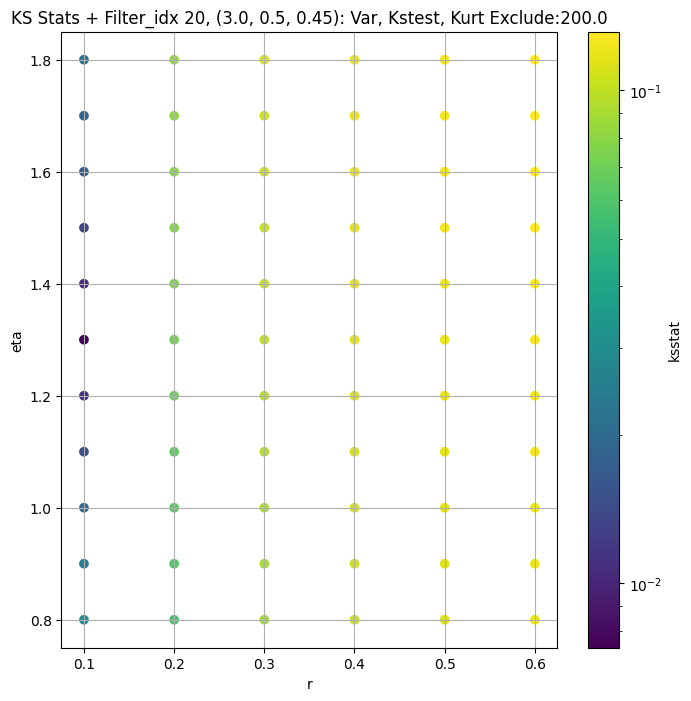

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.029836814066146466 83.42144


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.008383685405650605 33.28737


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.00376401101937026 27.744255


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.002787925072697428 23.452675
Number of samples: 100000, Without approximation : 262144000.0


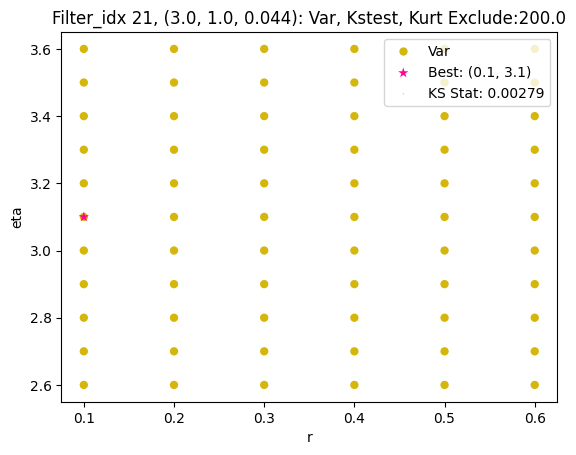

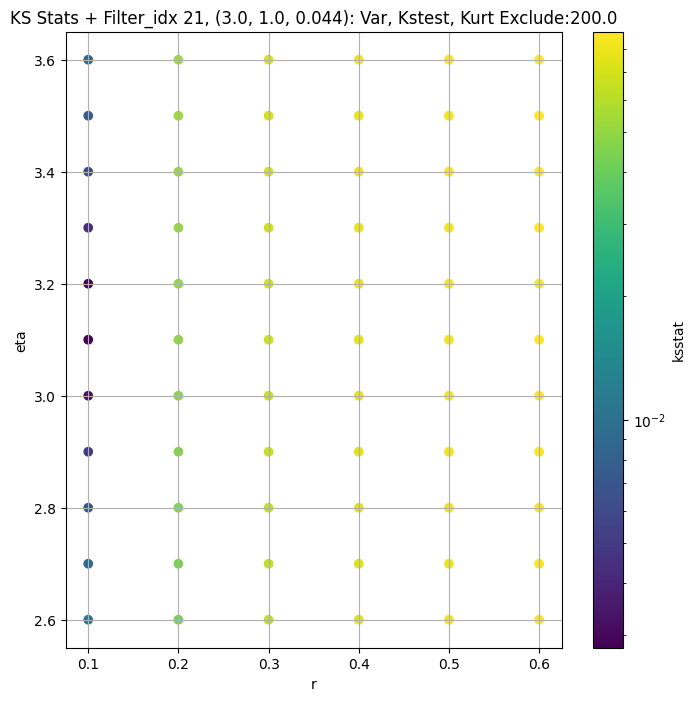

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.0218670678892261 34.556423


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.004603381413886609 17.0012


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.001510773535493004 15.072445


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.002788180438267198 13.220676
Number of samples: 100000, Without approximation : 262144000.0


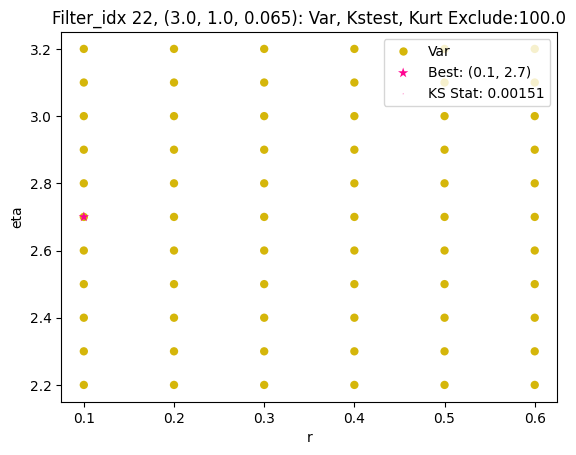

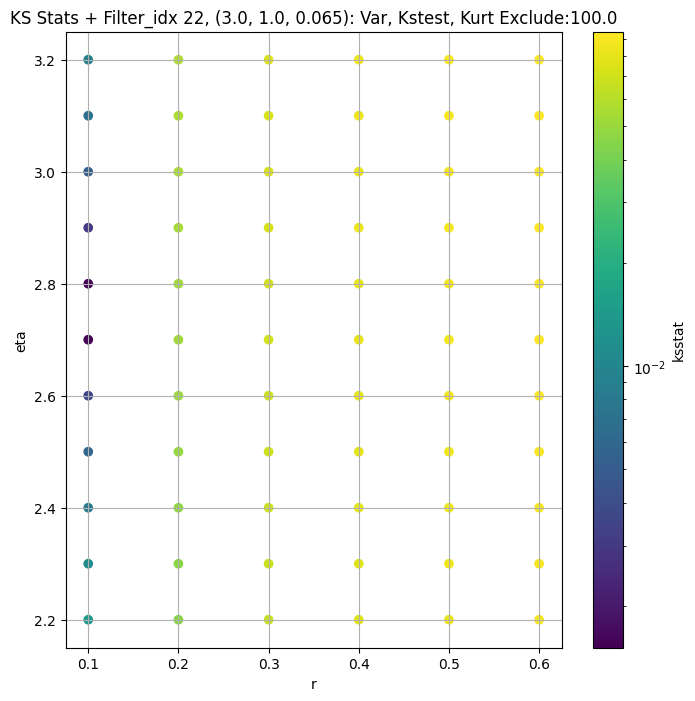

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.028861354822890442 34.371593


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.005658468888333101 12.368408


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.0012848955305910792 10.191012


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.002841402367974921 8.70402
Number of samples: 100000, Without approximation : 262144000.0


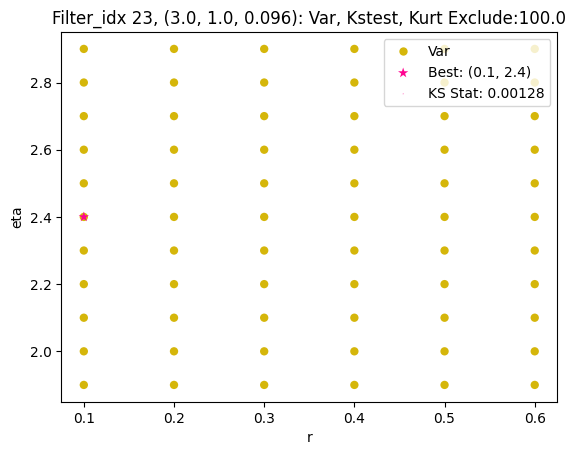

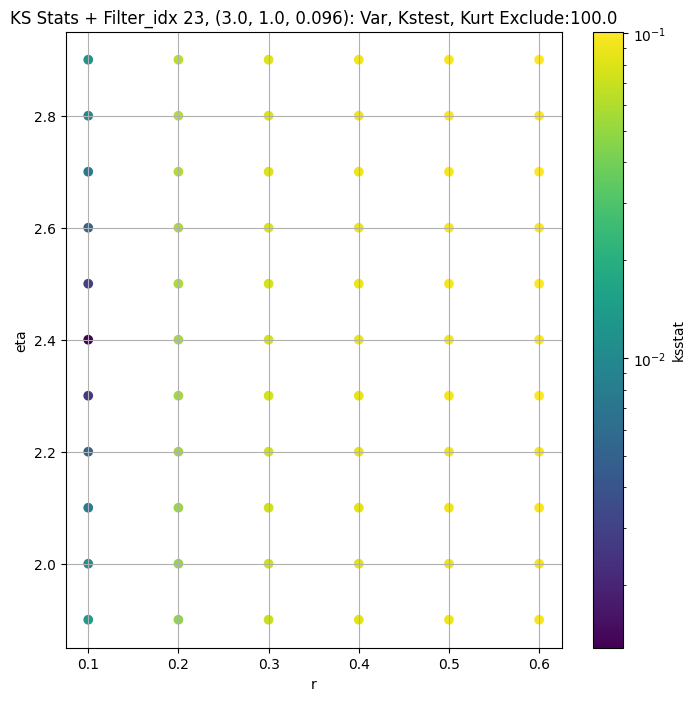

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.015149322449860336 10.562512


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.005595553820065491 6.8126664


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.0036765152606866858 6.032881


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.0034782444744231433 5.266948
Number of samples: 100000, Without approximation : 262144000.0


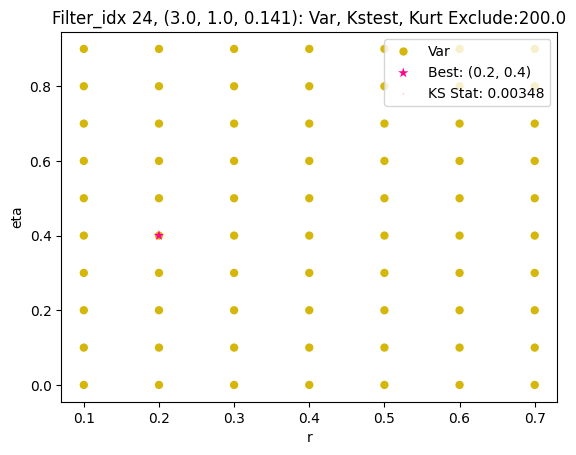

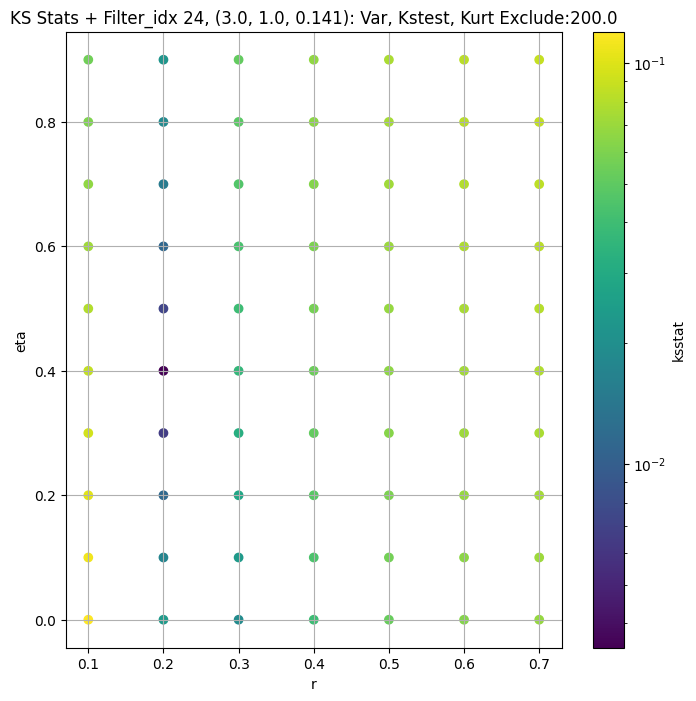

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.03319638098246336 7.8327813


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.012911842796035189 2.9080627


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.00904964146408238 2.443218


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.005674521378390418 2.0460596
Number of samples: 100000, Without approximation : 262144000.0


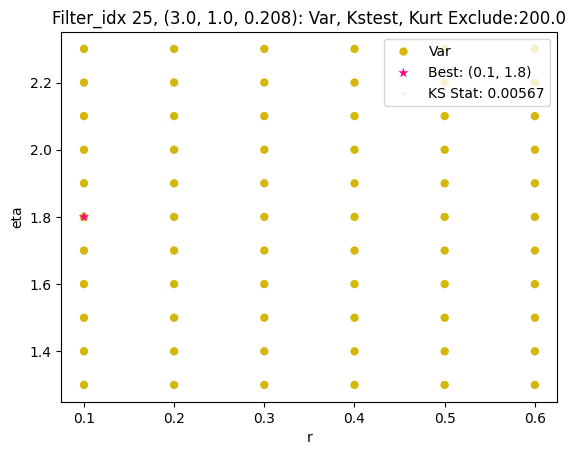

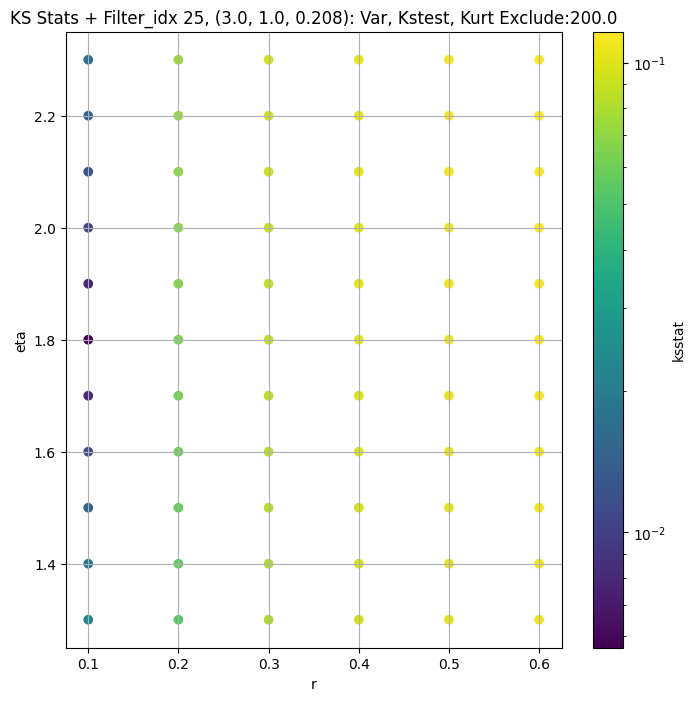

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.014903548815600132 0.8650232


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.008586004307209905 0.5944594


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.006544003811435661 0.5442109


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.005618686996150979 0.48508194
Number of samples: 100000, Without approximation : 262144000.0


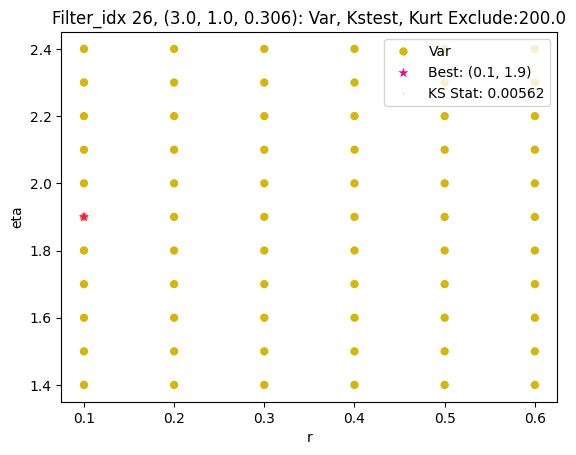

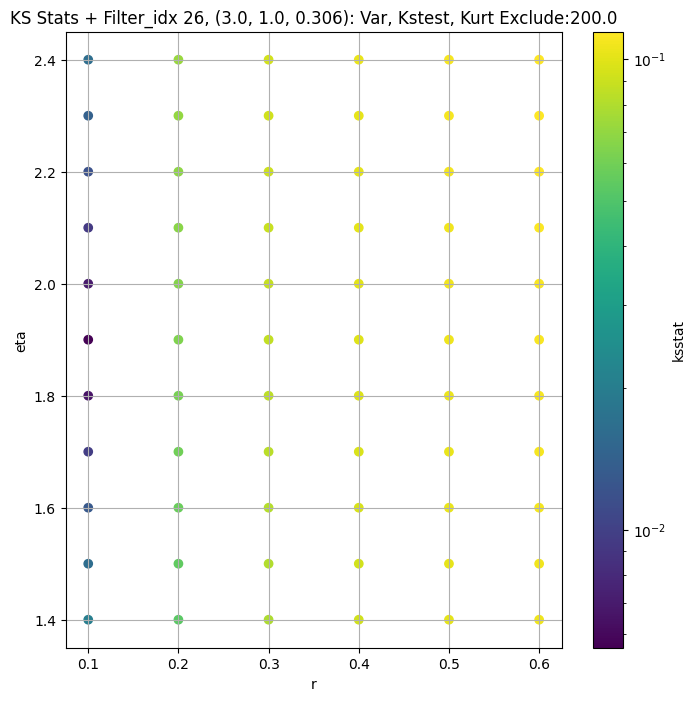

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.03717064019033989 0.5678766


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.020333161668440125 0.2207547


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.01771171315019733 0.17090705


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.011244738842203006 0.12780398
Number of samples: 100000, Without approximation : 262144000.0


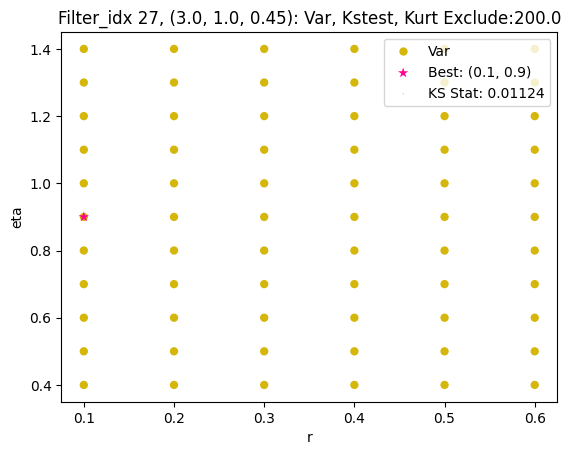

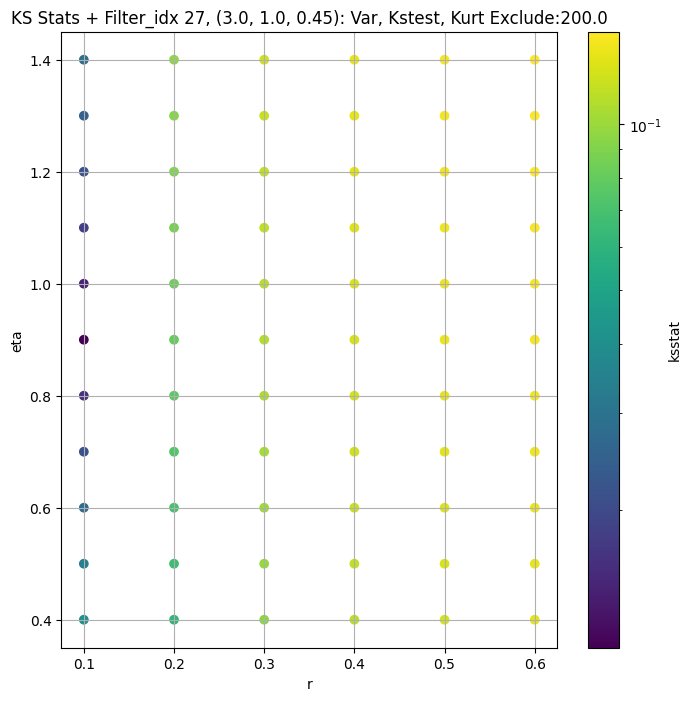

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.0167039192257864 48.749405


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.0036404932660232814 28.95025


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.0016439506106595793 26.118147


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.0028664037209951143 23.184694
Number of samples: 100000, Without approximation : 262144000.0


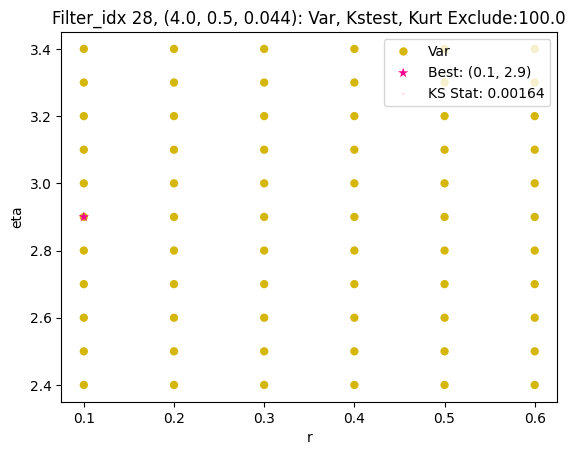

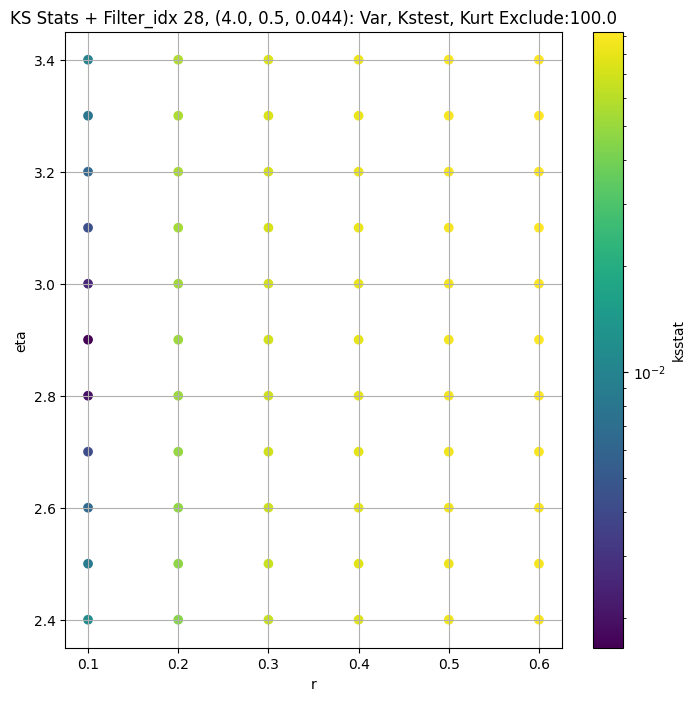

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.017570968145405375 24.92481


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.0028226388368244384 13.866306


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.0020099564045800156 12.423953


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.0028106190318451622 11.082724
Number of samples: 100000, Without approximation : 262144000.0


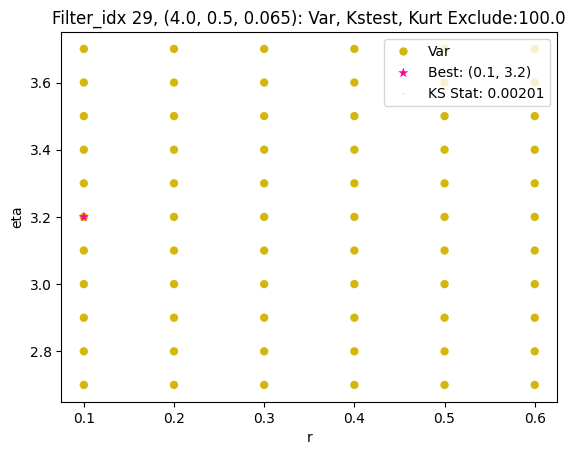

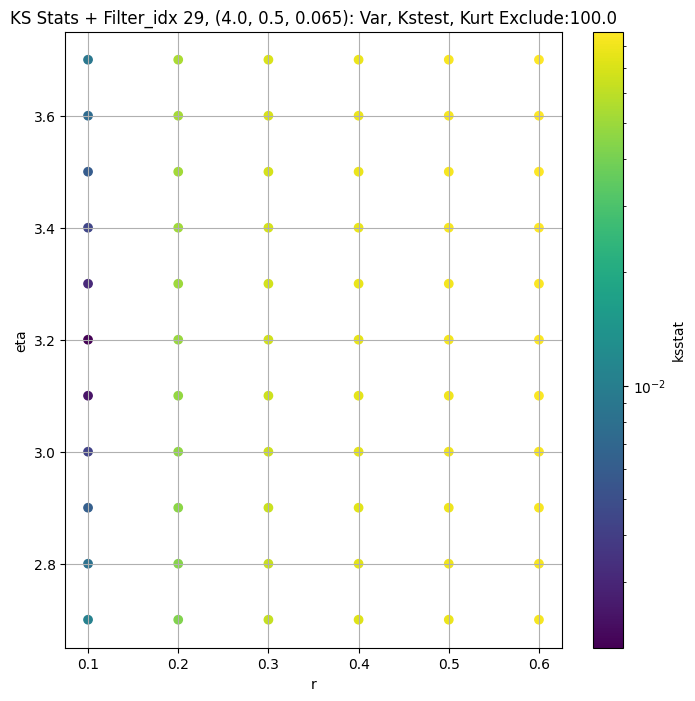

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.02079081638904015 30.873405


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.004032778117270985 13.341323


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.0027653905739208895 11.368529


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.005035317800226369 9.868477
Number of samples: 100000, Without approximation : 262144000.0


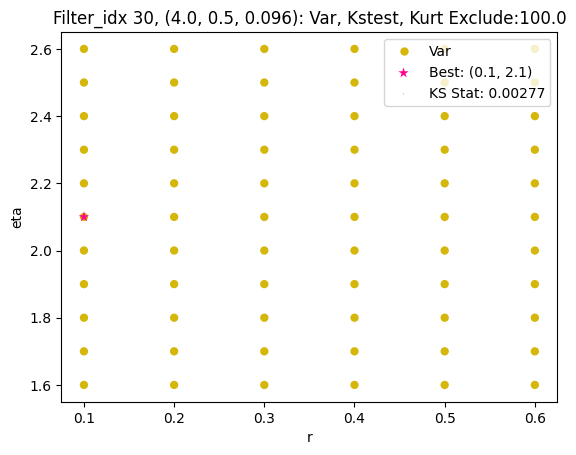

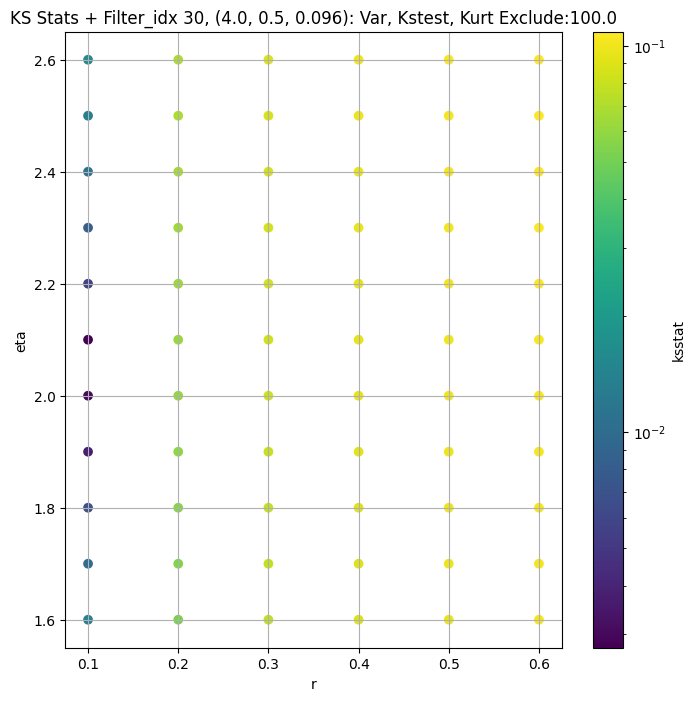

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.03794464865922642 37.720184


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.011067307035913743 7.9331307


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.005848152174880328 5.8529673


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.004031297992322564 4.9699154
Number of samples: 100000, Without approximation : 262144000.0


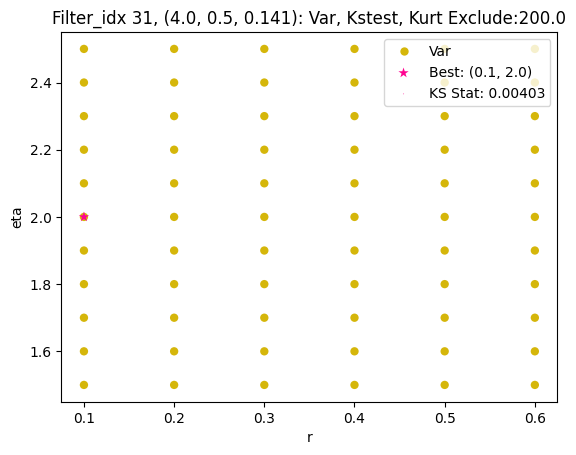

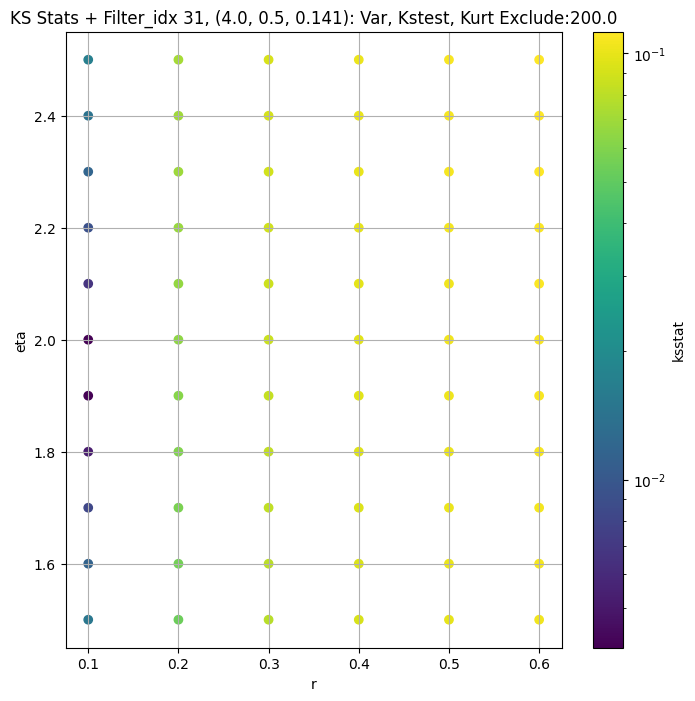

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.023423970149331397 4.126129


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.010284730739313755 2.2245212


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.008455183541267064 1.9233115


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.004298247085713691 1.6266623
Number of samples: 100000, Without approximation : 262144000.0


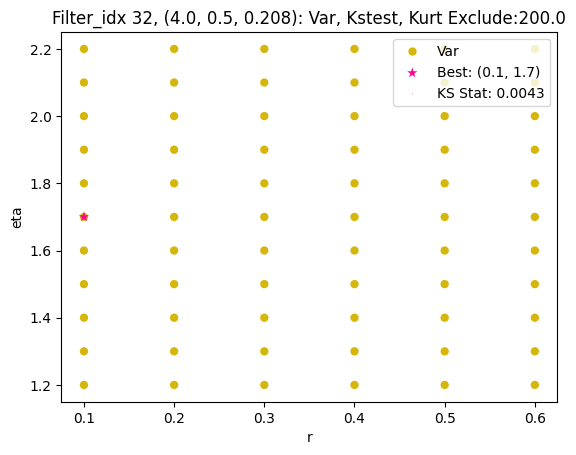

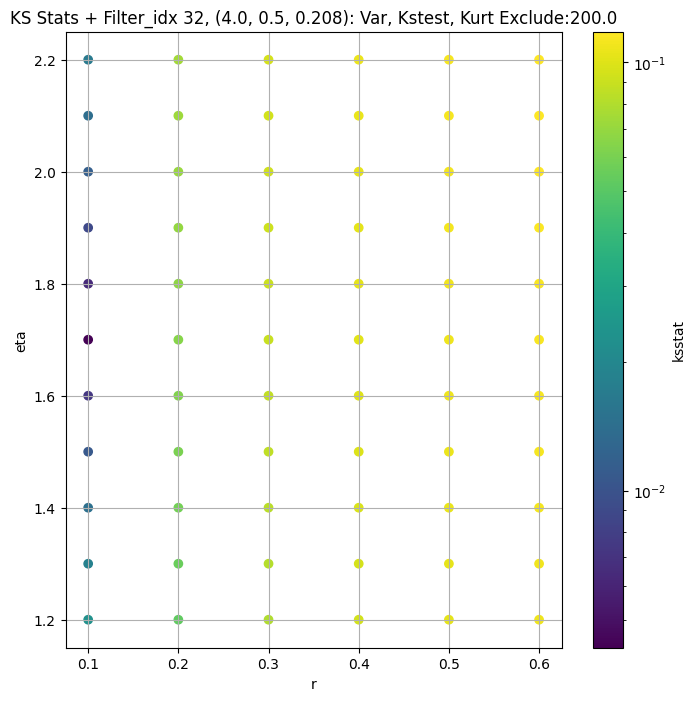

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.033300543046043574 1.4099572


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.01990470909205644 0.6726847


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.01596666200996337 0.5142904


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.009785721345576037 0.3764446
Number of samples: 100000, Without approximation : 262144000.0


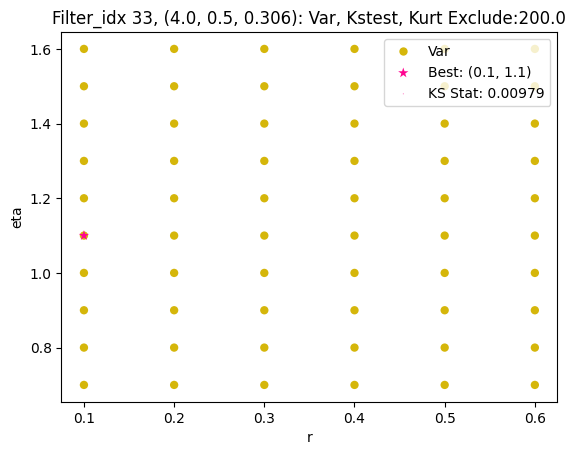

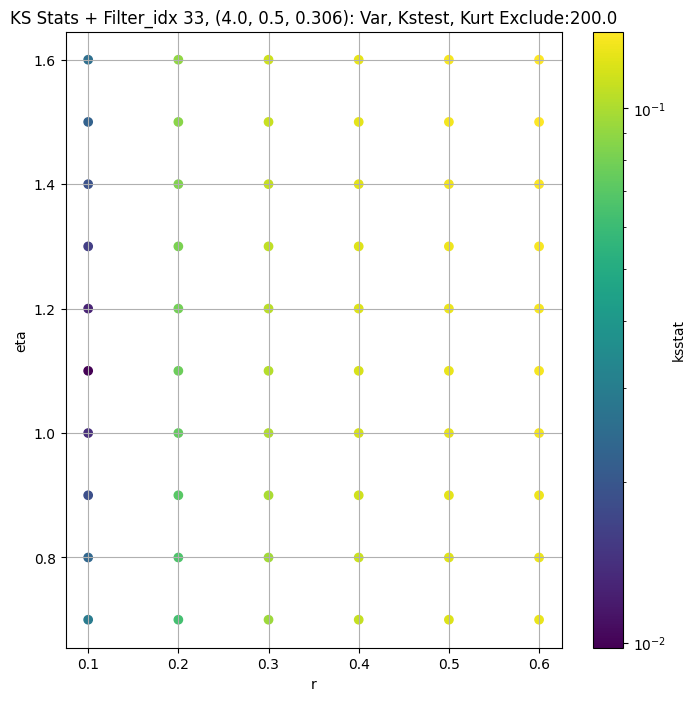

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.035551398548266055 0.20204505


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.020493346728284997 0.0796581


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.014741716061895005 0.062325493


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.011159585971078134 0.04852356
Number of samples: 100000, Without approximation : 262144000.0


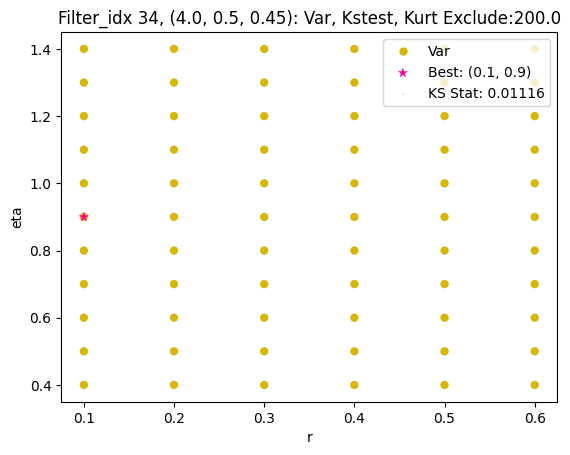

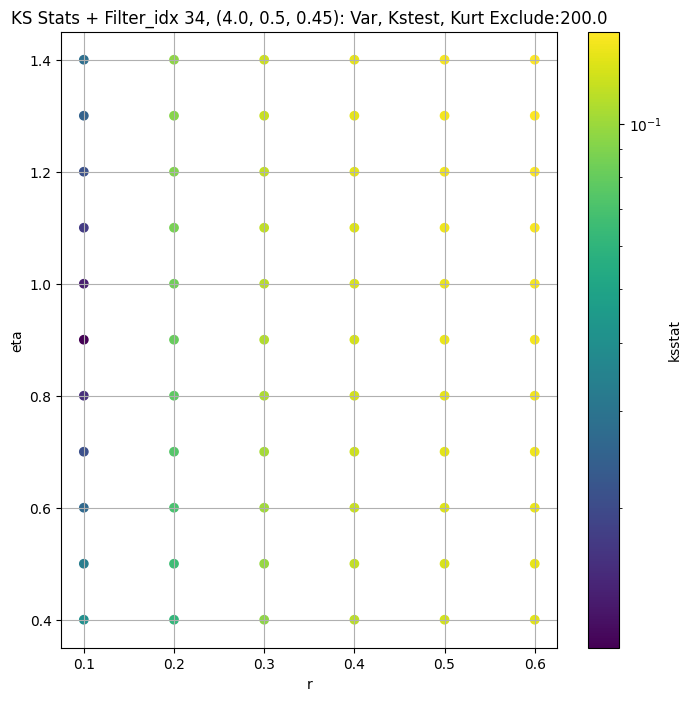

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.024037280794947893 68.93457


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.0062763972667228 30.58278


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.0028031228098422956 26.648783


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.0028677997112023235 23.052446
Number of samples: 100000, Without approximation : 262144000.0


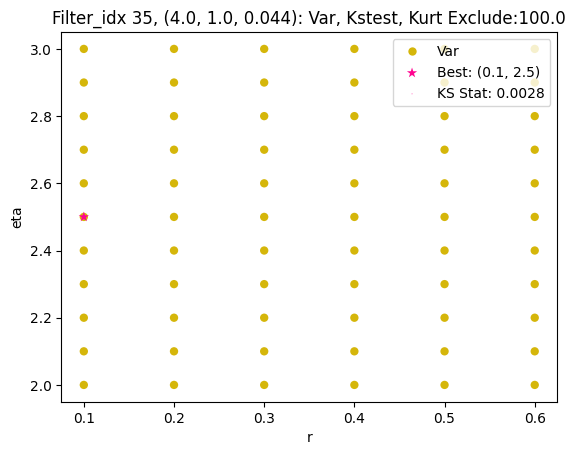

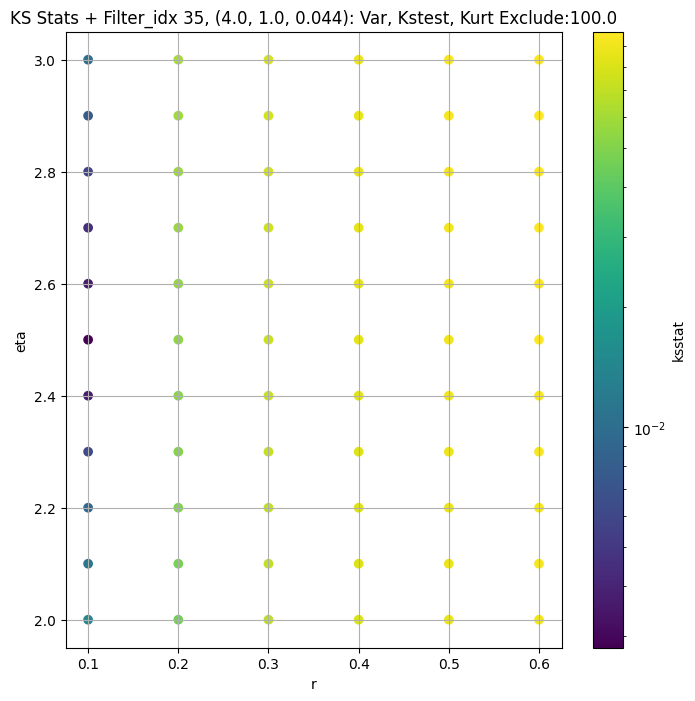

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.019586267838169635 28.231224


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.0038823579932947827 15.174279


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.001369530030131405 13.21546


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.0027010540505326714 11.559649
Number of samples: 100000, Without approximation : 262144000.0


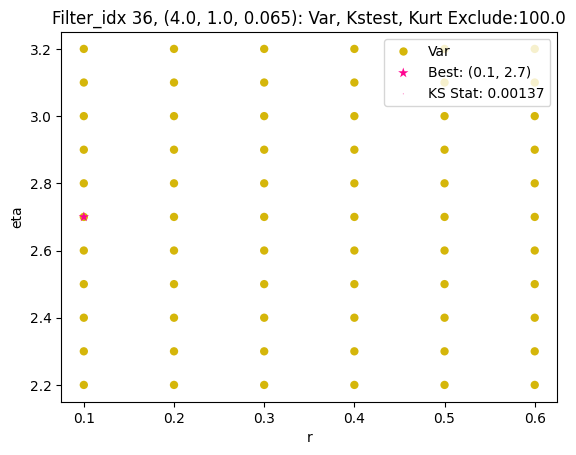

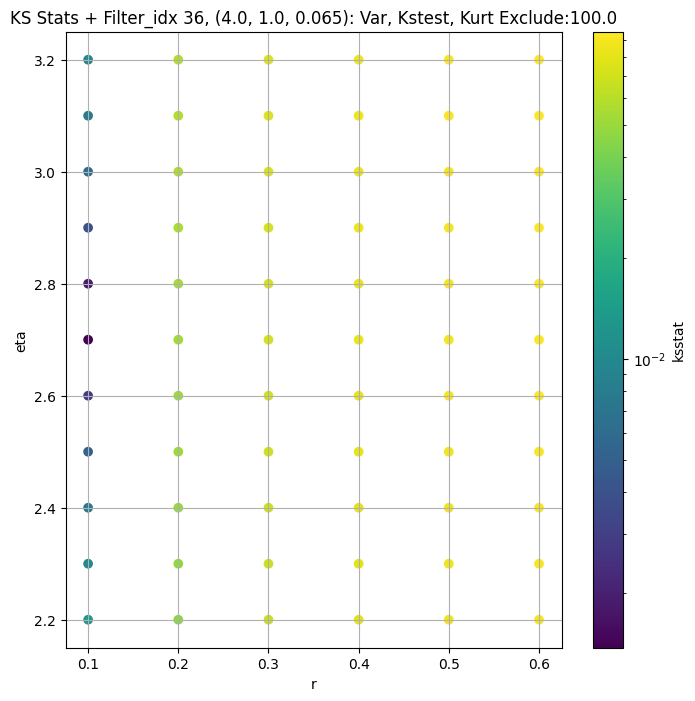

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.020627198609282194 22.455746


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.009950450937891375 13.801666


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.0066598942462681165 11.931243


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.003149385024576184 9.97793
Number of samples: 100000, Without approximation : 262144000.0


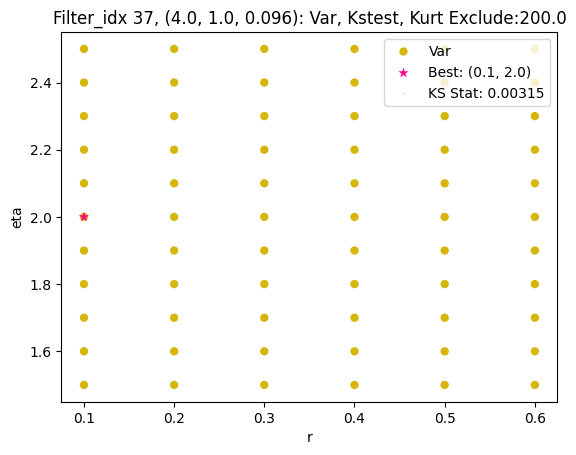

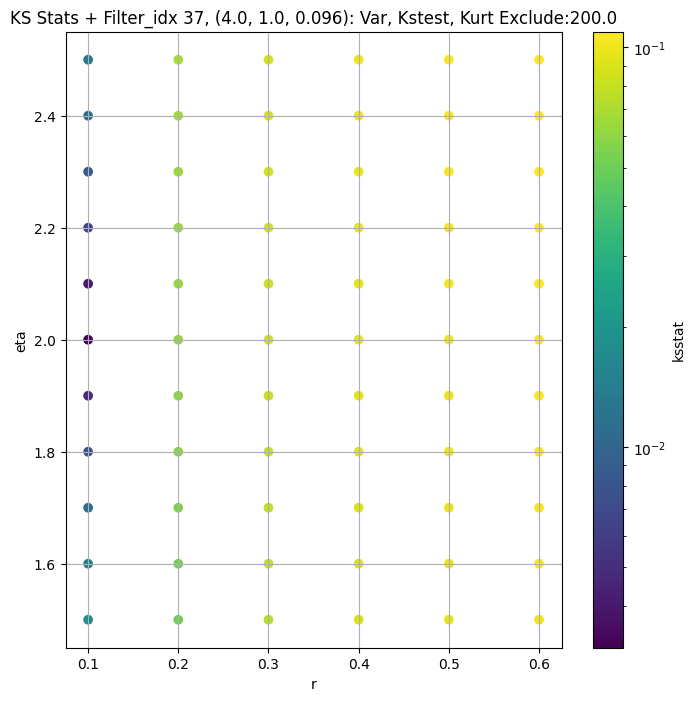

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.02966032648199779 21.763765


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.012365228278233498 7.796508


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.009184320181683386 6.79842


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.0055128936087260605 5.7870946
Number of samples: 100000, Without approximation : 262144000.0


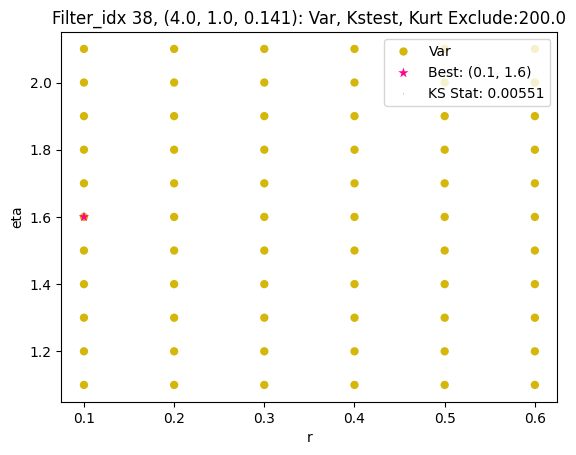

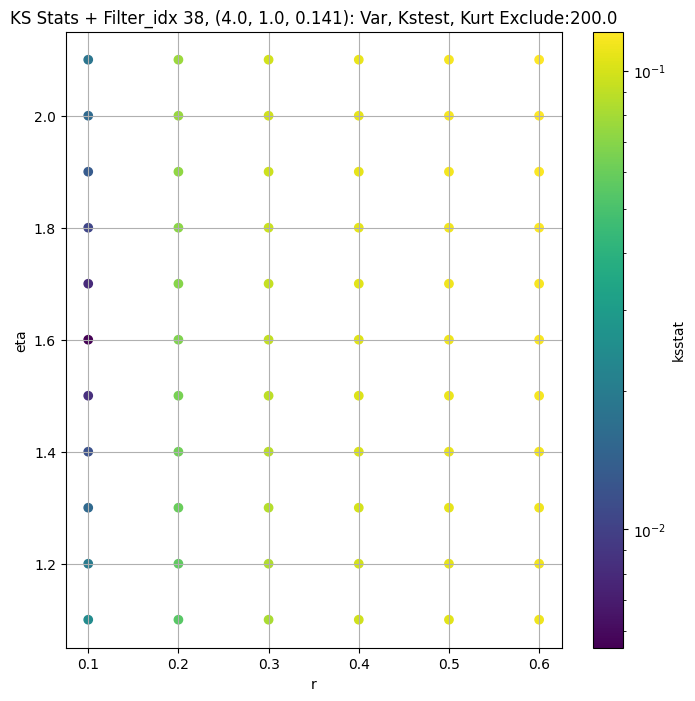

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.026798333360725166 5.532553


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.016632143841346314 3.444039


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.014474326290839334 2.8275647


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.009441594454020666 2.1986778
Number of samples: 100000, Without approximation : 262144000.0


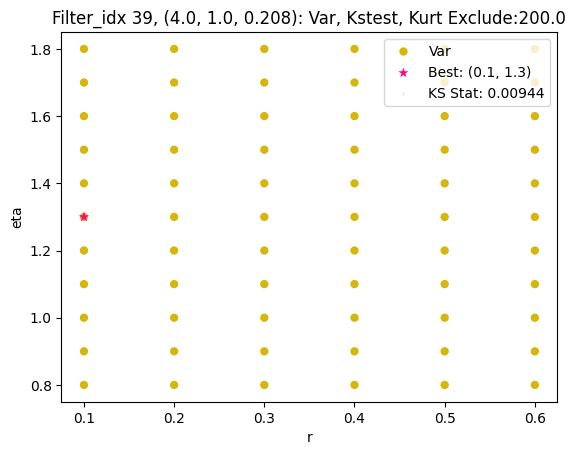

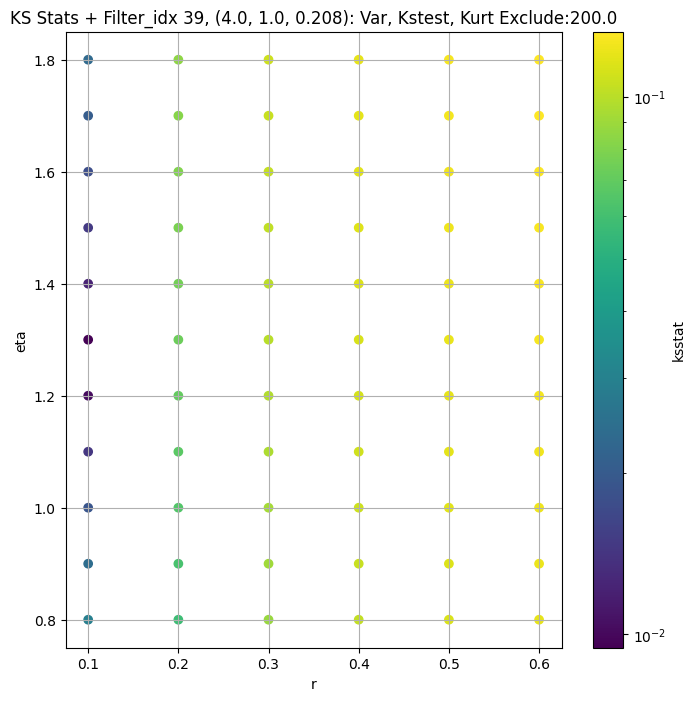

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.023042112622467026 0.813415


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.013250814153691781 0.4975836


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.011009359864176227 0.42995527


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.0068684104942411395 0.3601968
Number of samples: 100000, Without approximation : 262144000.0


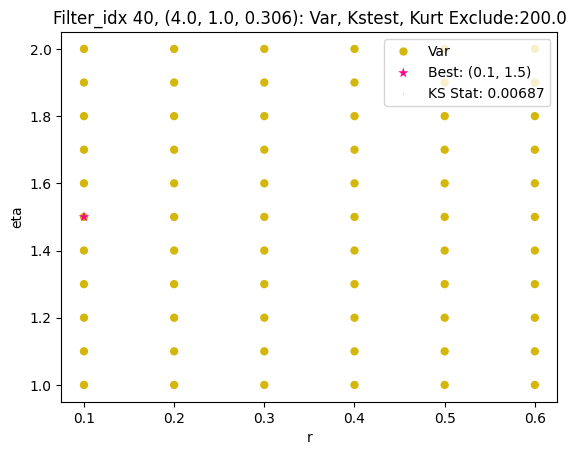

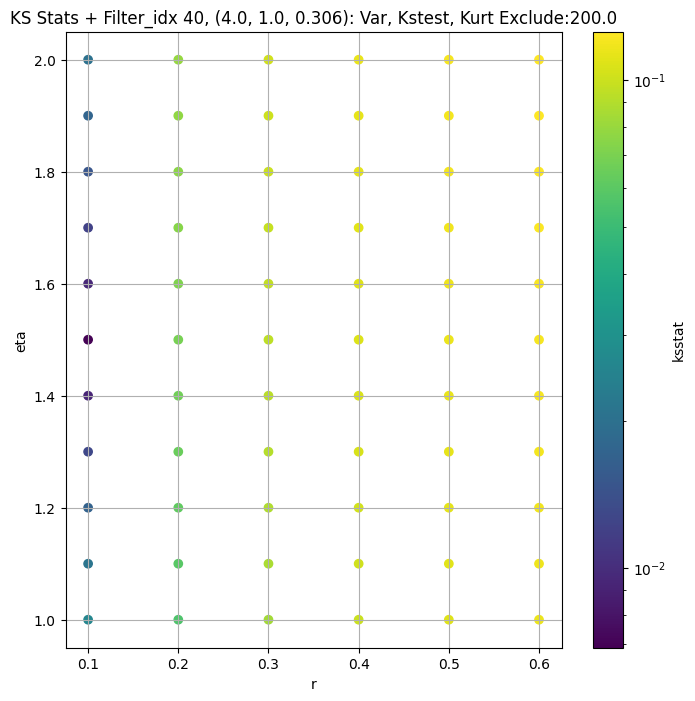

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.03442679693664619 0.2541406


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.014251485495038685 0.069789834


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.012562173284046851 0.059788458


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.009667351734025442 0.050193027
Number of samples: 100000, Without approximation : 262144000.0


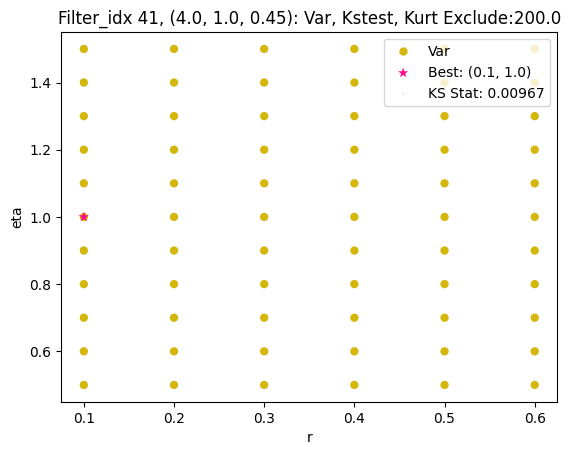

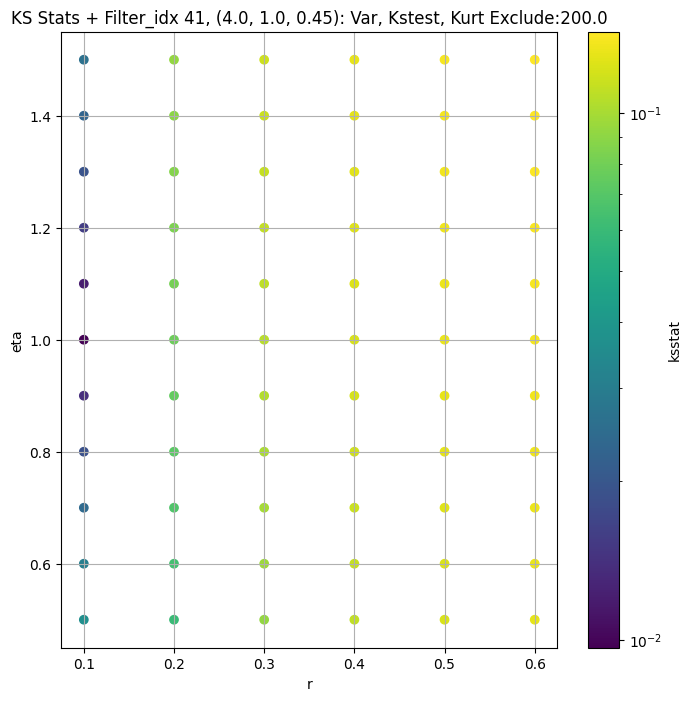

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",51.872887,22.969347,288.606600,556.33234,6.812027,731.13670,262144000.0,"(2.0, 0.5, 0.044)",0.002335,0.1,2.6,7.783199e-16,100.0,29.012688,0.000084
1,"(2.0, 0.5, 0.065)",23.477310,11.694446,201.420790,1299.65230,4.399985,851.55240,262144000.0,"(2.0, 0.5, 0.065)",0.001474,0.1,3.3,9.872281e-17,50.0,15.470115,0.000084
2,"(2.0, 0.5, 0.096)",18.258923,8.203281,104.030300,593.67505,5.334007,779.42900,262144000.0,"(2.0, 0.5, 0.096)",0.001943,0.1,2.8,1.758917e-16,100.0,10.097536,0.000084
3,"(2.0, 0.5, 0.141)",10.848763,4.481118,108.215090,1874.30220,7.118456,856.95690,262144000.0,"(2.0, 0.5, 0.141)",0.002597,0.1,2.1,4.846568e-16,100.0,5.610655,0.000084
4,"(2.0, 0.5, 0.208)",6.613406,1.802558,46.848503,1015.11694,14.294805,876.53973,262144000.0,"(2.0, 0.5, 0.208)",0.006013,0.1,1.8,3.964813e-16,200.0,2.117041,0.000084
5,"(2.0, 0.5, 0.306)",0.872835,0.353022,8.381213,1746.88130,7.294063,860.37410,262144000.0,"(2.0, 0.5, 0.306)",0.005064,0.1,1.8,8.571404e-17,100.0,0.457676,0.000084
6,"(2.0, 0.5, 0.45)",0.756728,0.223613,6.795845,1347.04060,11.058815,863.99970,262144000.0,"(2.0, 0.5, 0.45)",0.004564,0.1,1.7,6.181845e-17,200.0,0.251493,0.000084
7,"(2.0, 1.0, 0.044)",95.540840,29.056345,1063.495000,2448.39900,8.085478,921.79800,262144000.0,"(2.0, 1.0, 0.044)",0.003033,0.1,3.1,3.021401e-16,200.0,32.068394,0.000084
8,"(2.0, 1.0, 0.065)",41.442993,14.082063,361.415200,1426.72180,6.772509,859.86170,262144000.0,"(2.0, 1.0, 0.065)",0.001678,0.1,2.8,3.181154e-16,100.0,18.262276,0.000084


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + 100 = 200, ksstat: 0.0031320496903469008, var: 25.548837661743164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + 75 = 175, ksstat: 0.0027639090361161606, var: 26.219167709350586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + 50 = 150, ksstat: 0.002384913392968313, var: 26.98988151550293


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + 25 = 125, ksstat: 0.0020825896900188434, var: 27.898395538330078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + 0 = 100, ksstat: 0.002334954309804557, var: 29.01268768310547


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + -25 = 75, ksstat: 0.0034650639249156345, var: 30.4624080657959


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + -50 = 50, ksstat: 0.004894573241659705, var: 32.5148811340332


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + -75 = 25, ksstat: 0.007345901689503553, var: 35.954620361328125


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 100.0 + -100 = 0, ksstat: 0.015187268984442934, var: 51.872886657714844
Number of samples: 100000, Without approximation : 262144000.0


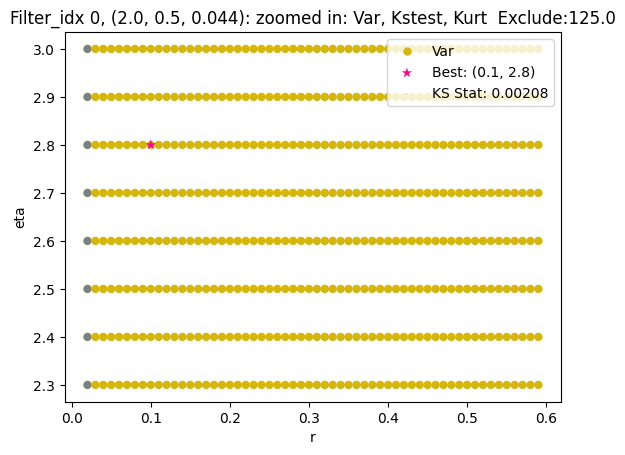

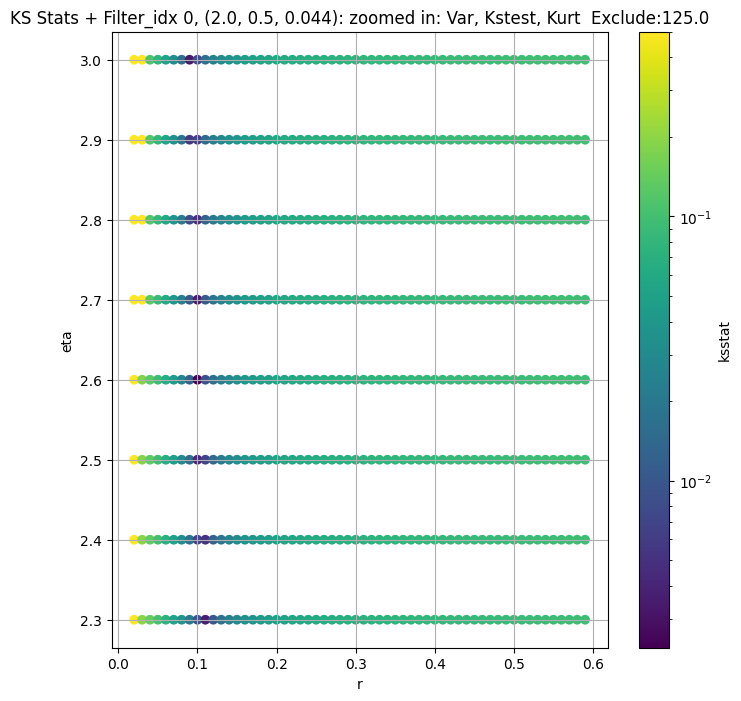

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 100 = 150, ksstat: 0.0031973490994156306, var: 13.615652084350586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 75 = 125, ksstat: 0.0025759250390827715, var: 13.943854331970215


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 50 = 100, ksstat: 0.001984751562970899, var: 14.334208488464355


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 25 = 75, ksstat: 0.0014944199412569859, var: 14.819329261779785


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + 0 = 50, ksstat: 0.0014736256813167037, var: 15.470114707946777


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + -25 = 25, ksstat: 0.002738659818844469, var: 16.49549674987793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 50.0 + -50 = 0, ksstat: 0.011610119659540119, var: 23.477310180664062
Number of samples: 100000, Without approximation : 262144000.0


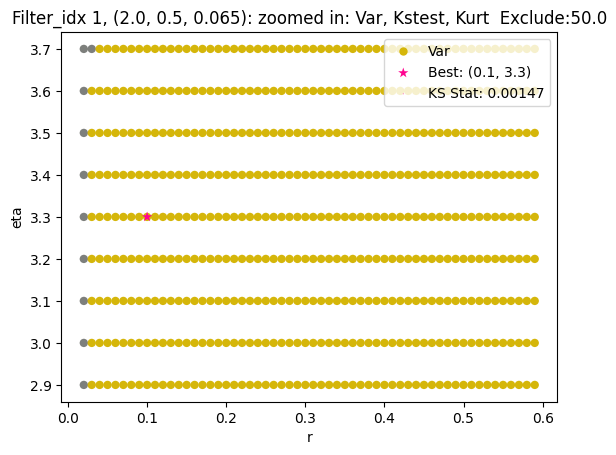

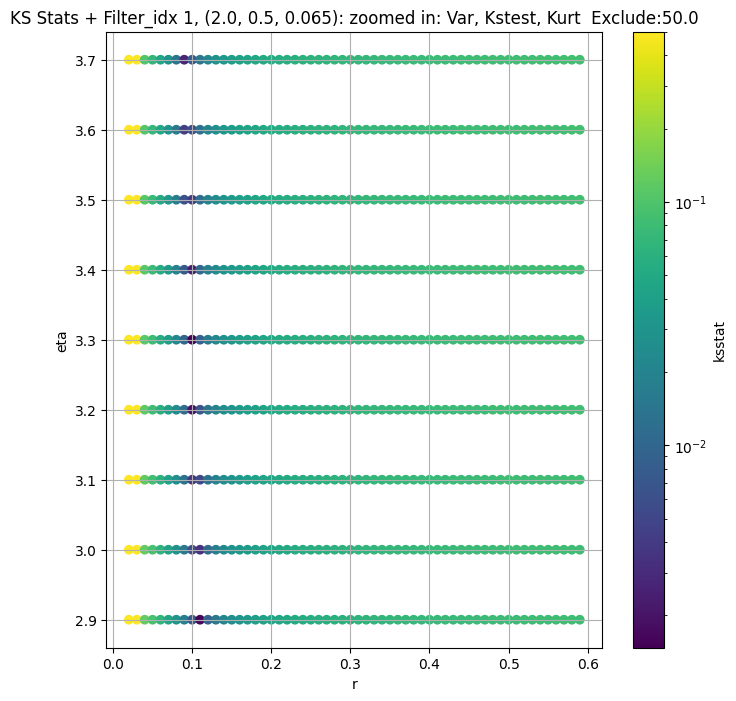

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 100 = 200, ksstat: 0.005441528179919164, var: 8.851629257202148


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 75 = 175, ksstat: 0.0046189390056532165, var: 9.067411422729492


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 50 = 150, ksstat: 0.003958251859014439, var: 9.329217910766602


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 25 = 125, ksstat: 0.0029365022270909646, var: 9.660255432128906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 0 = 100, ksstat: 0.001603273747124656, var: 10.097536087036133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -25 = 75, ksstat: 0.0010873713397014928, var: 10.703519821166992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -50 = 50, ksstat: 0.0022454858904258357, var: 11.597221374511719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -75 = 25, ksstat: 0.00508196014539275, var: 13.073959350585938


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -100 = 0, ksstat: 0.012427192027178895, var: 18.258922576904297
Number of samples: 100000, Without approximation : 262144000.0


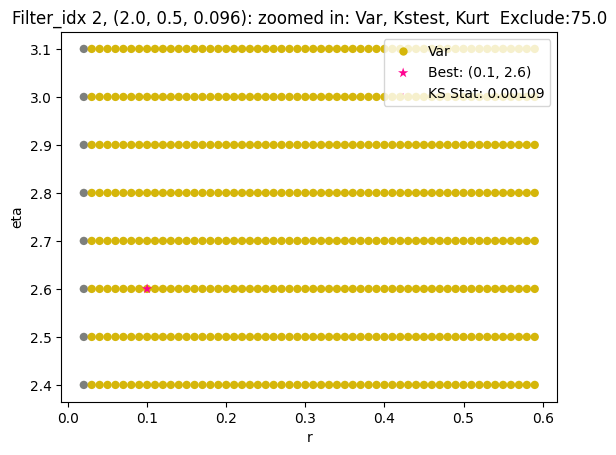

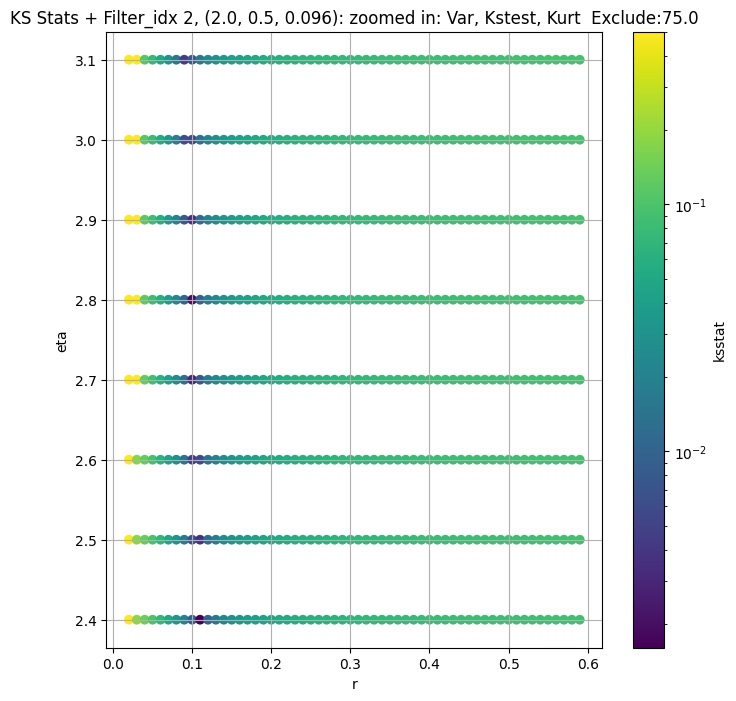

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + 100 = 200, ksstat: 0.004868362750082601, var: 5.032301902770996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + 75 = 175, ksstat: 0.0043379514898144525, var: 5.15131950378418


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + 50 = 150, ksstat: 0.0038936812852740123, var: 5.284099102020264


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + 25 = 125, ksstat: 0.003252526364464065, var: 5.434877872467041


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + 0 = 100, ksstat: 0.002597387743356272, var: 5.610654830932617


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + -25 = 75, ksstat: 0.002628401920696022, var: 5.8243842124938965


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + -50 = 50, ksstat: 0.00414405917437588, var: 6.107337474822998


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + -75 = 25, ksstat: 0.004523616466120428, var: 6.573047161102295


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 100.0 + -100 = 0, ksstat: 0.013614998547302415, var: 10.848763465881348
Number of samples: 100000, Without approximation : 262144000.0


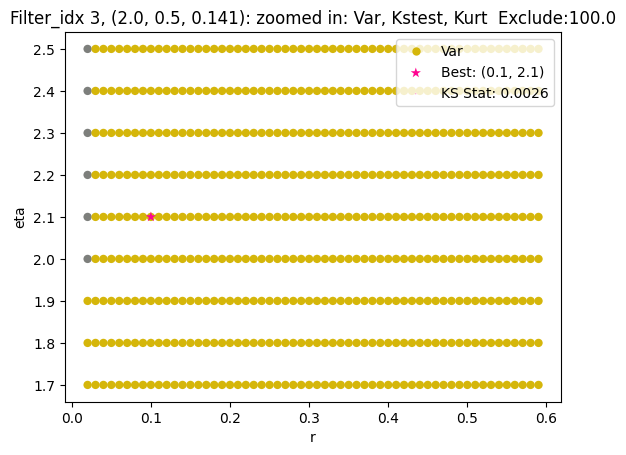

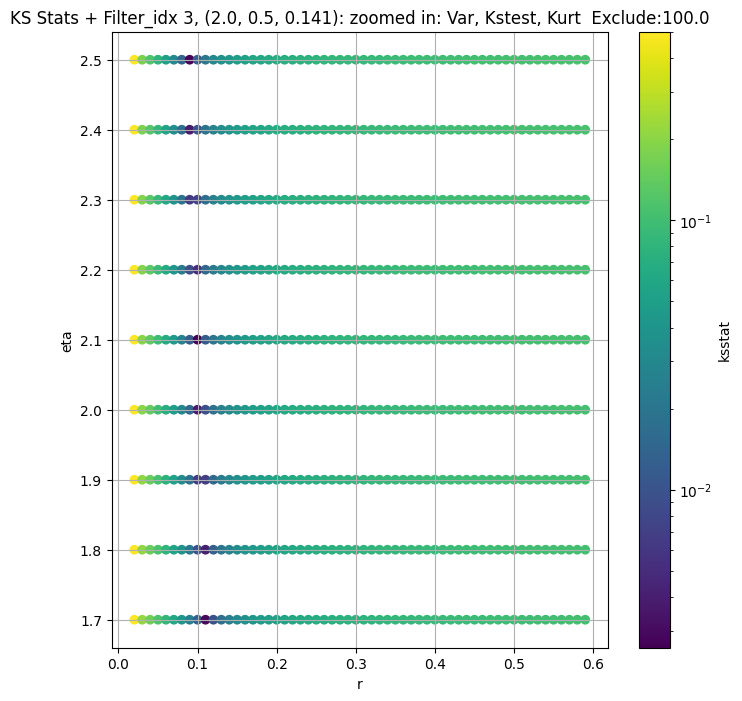

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + 100 = 300, ksstat: 0.004871325842855656, var: 1.8524773120880127


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + 75 = 275, ksstat: 0.004495307729951659, var: 1.9071167707443237


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + 50 = 250, ksstat: 0.004815398681201538, var: 1.9684152603149414


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + 25 = 225, ksstat: 0.004950815970031053, var: 2.0378031730651855


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + 0 = 200, ksstat: 0.0058157978321572434, var: 2.1170406341552734


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + -25 = 175, ksstat: 0.006910303021400138, var: 2.2083420753479004


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + -50 = 150, ksstat: 0.008042449123428885, var: 2.3146238327026367


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + -75 = 125, ksstat: 0.008526607209413672, var: 2.440284252166748


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 4, 200.0 + -100 = 100, ksstat: 0.009655340284993819, var: 2.5928571224212646
Number of samples: 100000, Without approximation : 262144000.0


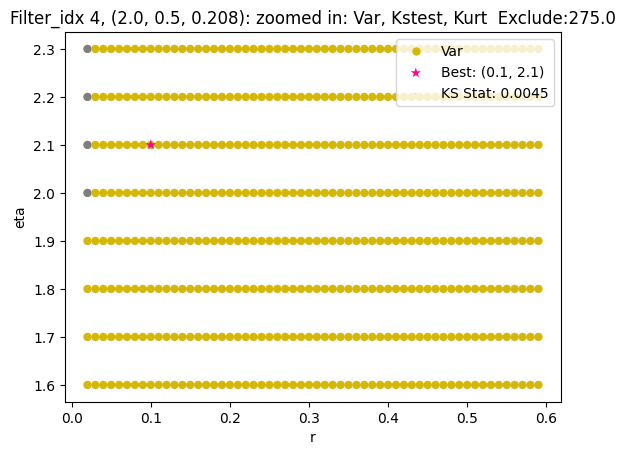

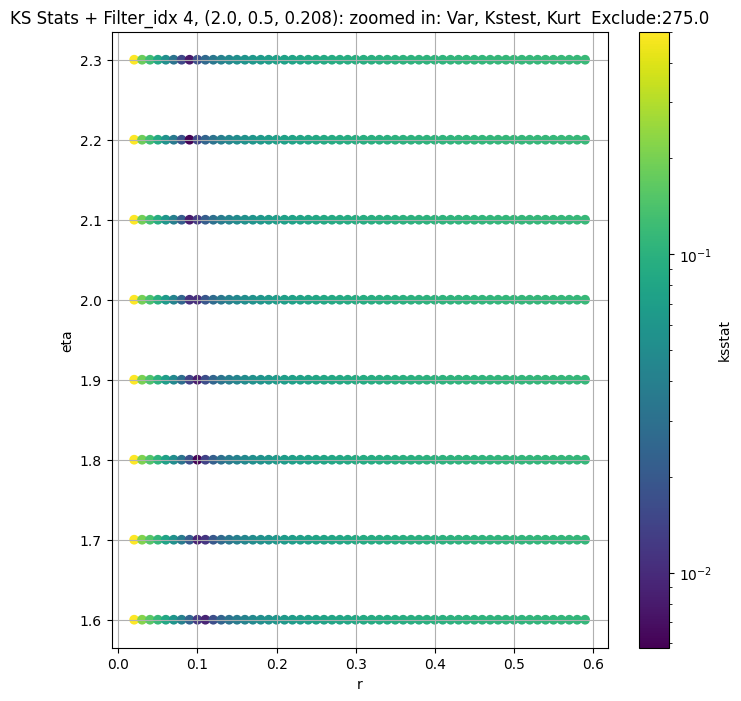

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + 100 = 200, ksstat: 0.005314623299887633, var: 0.40940794348716736


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + 75 = 175, ksstat: 0.004863981891697011, var: 0.41922011971473694


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + 50 = 150, ksstat: 0.00444822397445984, var: 0.43021219968795776


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + 25 = 125, ksstat: 0.004627015294822401, var: 0.4427984058856964


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + 0 = 100, ksstat: 0.004933649031202303, var: 0.4576762914657593


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + -25 = 75, ksstat: 0.005583570399395776, var: 0.47623762488365173


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + -50 = 50, ksstat: 0.006324531239039977, var: 0.501569390296936


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + -75 = 25, ksstat: 0.006958450861667187, var: 0.5426556468009949


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 5, 100.0 + -100 = 0, ksstat: 0.014829286448504814, var: 0.8728353381156921
Number of samples: 100000, Without approximation : 262144000.0


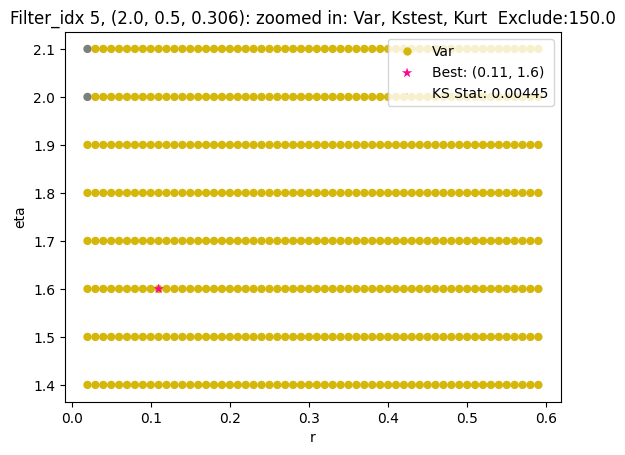

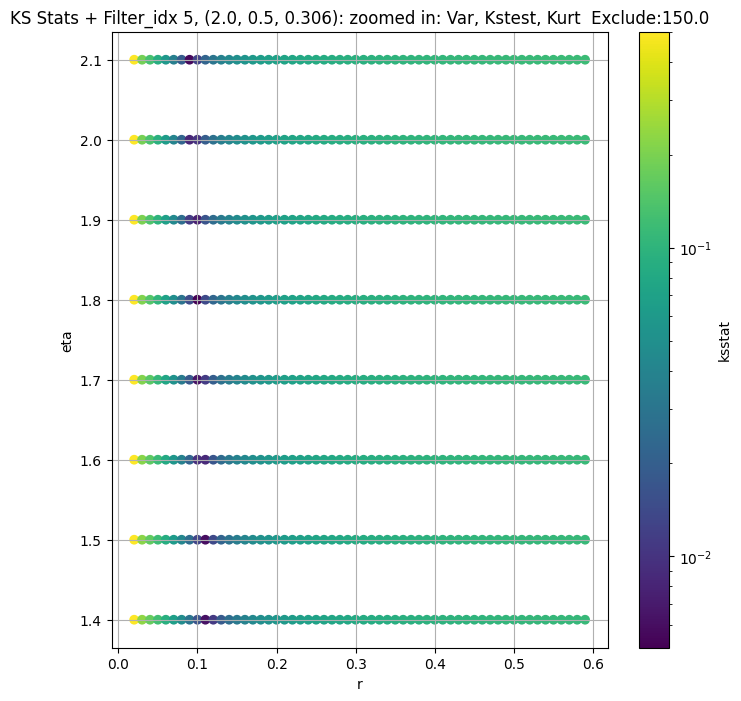

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 100 = 300, ksstat: 0.006572346783877858, var: 0.22453364729881287


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 75 = 275, ksstat: 0.006085499663614824, var: 0.23010271787643433


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 50 = 250, ksstat: 0.005562952851433489, var: 0.23632876574993134


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 25 = 225, ksstat: 0.005050446370057398, var: 0.24338075518608093


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + 0 = 200, ksstat: 0.004404823338603925, var: 0.25149261951446533


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -25 = 175, ksstat: 0.004292425188097249, var: 0.2610147297382355


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -50 = 150, ksstat: 0.004910374147199026, var: 0.2724864184856415


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -75 = 125, ksstat: 0.005861980617021034, var: 0.2868677079677582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 200.0 + -100 = 100, ksstat: 0.006843129000045911, var: 0.3060046434402466
Number of samples: 100000, Without approximation : 262144000.0


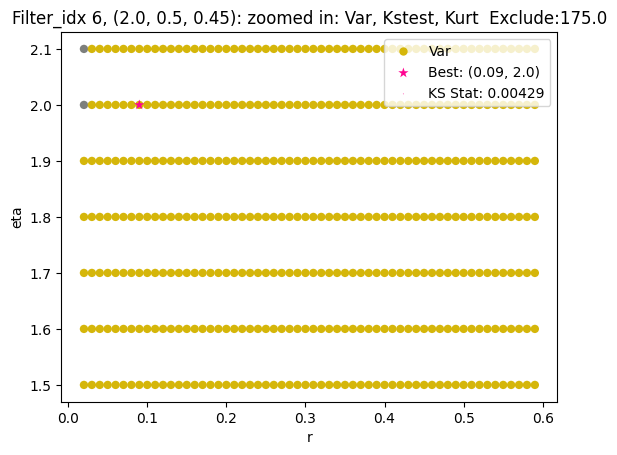

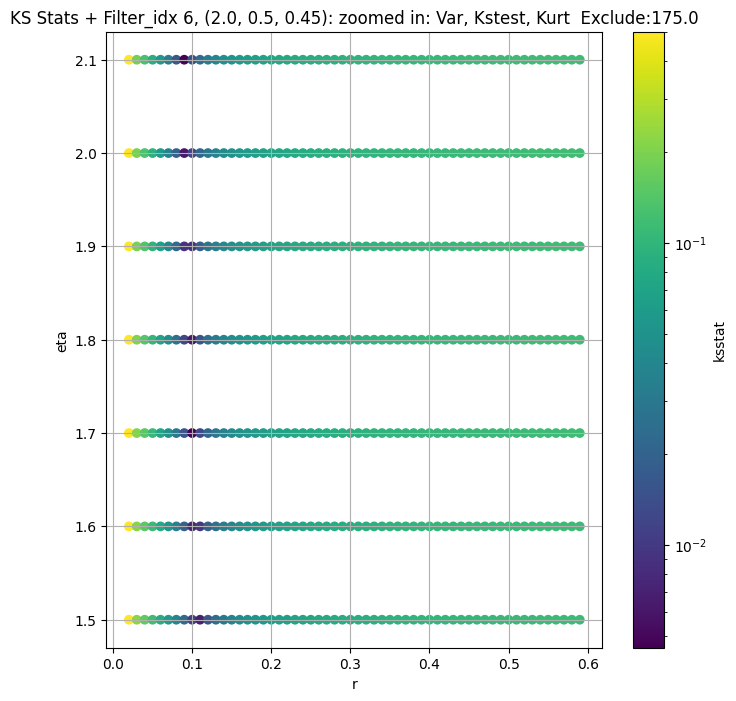

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 100 = 300, ksstat: 0.004313660664791774, var: 29.176227569580078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 75 = 275, ksstat: 0.003968914524573375, var: 29.79206657409668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 50 = 250, ksstat: 0.0036238576456321114, var: 30.469406127929688


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 25 = 225, ksstat: 0.003311846171904942, var: 31.221586227416992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 0 = 200, ksstat: 0.0030325482263924286, var: 32.06839370727539


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -25 = 175, ksstat: 0.002714787584138123, var: 33.03717041015625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -50 = 150, ksstat: 0.0026910660854376767, var: 34.168155670166016


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -75 = 125, ksstat: 0.003511243942824205, var: 35.526512145996094


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -100 = 100, ksstat: 0.004750217681886215, var: 37.2257080078125
Number of samples: 100000, Without approximation : 262144000.0


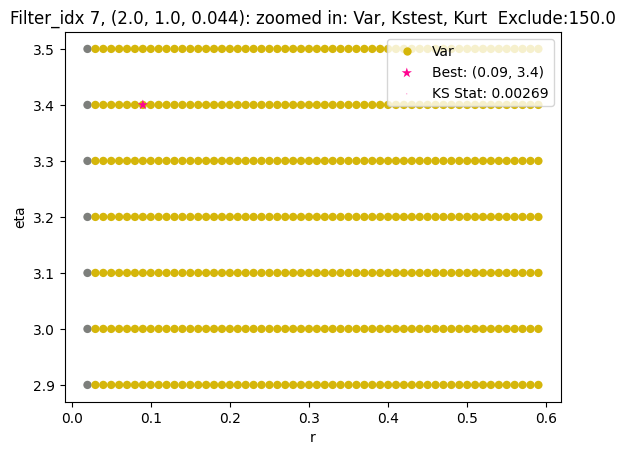

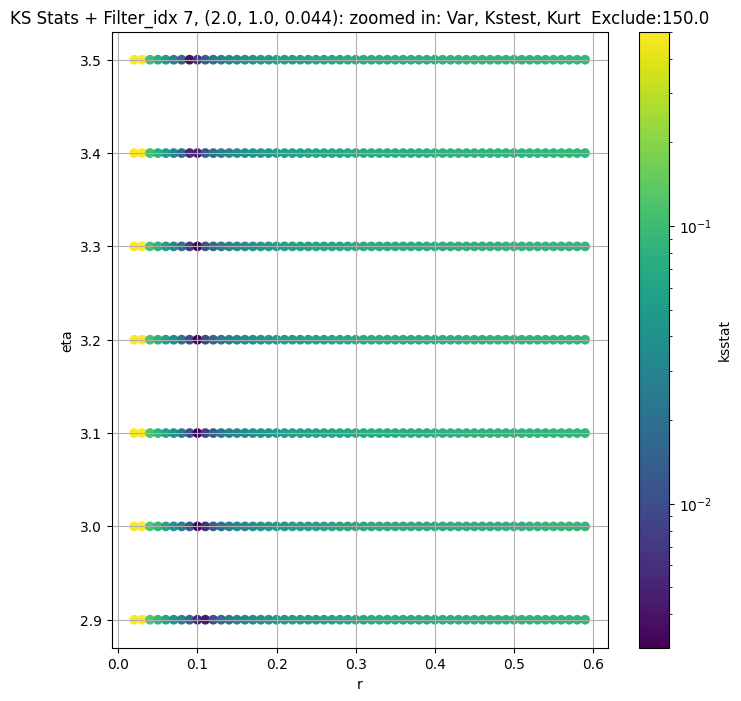

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 100 = 200, ksstat: 0.00264682782140091, var: 15.881970405578613


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 75 = 175, ksstat: 0.0023054435971351372, var: 16.327348709106445


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 50 = 150, ksstat: 0.002043875937655981, var: 16.84964942932129


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 25 = 125, ksstat: 0.0018007391945200624, var: 17.47723960876465


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + 0 = 100, ksstat: 0.001677942508442859, var: 18.26227569580078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -25 = 75, ksstat: 0.002870268281770172, var: 19.307958602905273


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -50 = 50, ksstat: 0.0050531252779216496, var: 20.860490798950195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -75 = 25, ksstat: 0.008322009354474802, var: 23.685823440551758


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 100.0 + -100 = 0, ksstat: 0.019617637888085904, var: 41.4429931640625
Number of samples: 100000, Without approximation : 262144000.0


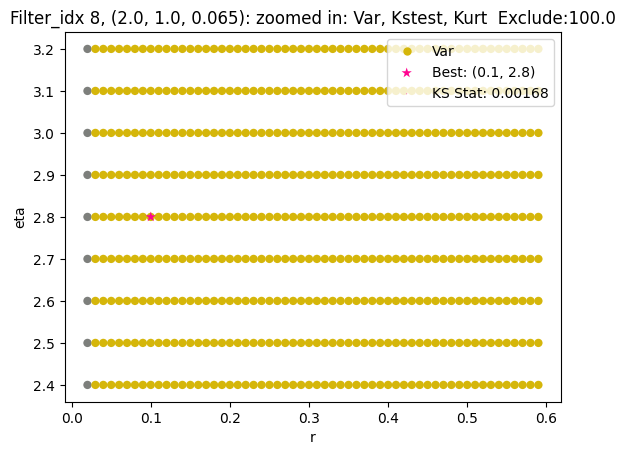

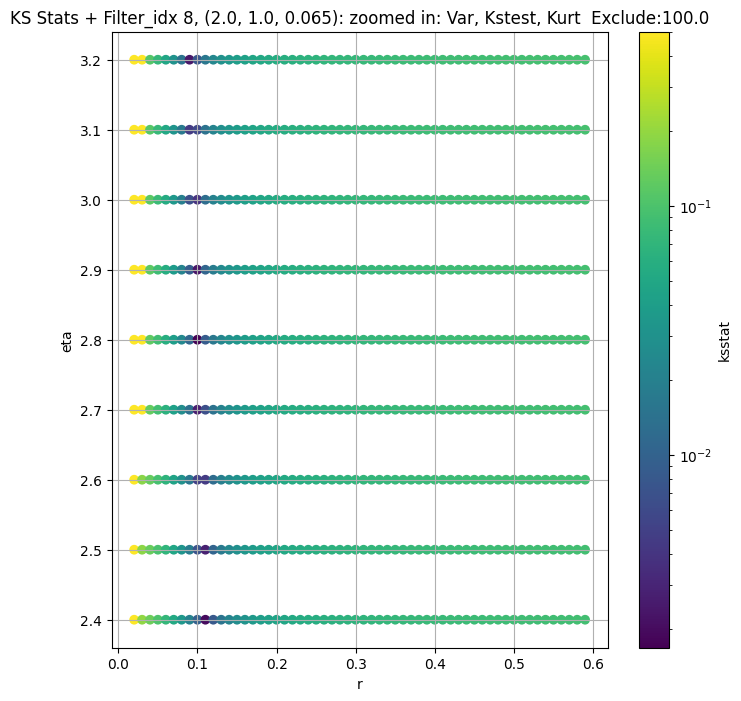

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 100 = 200, ksstat: 0.00381844661497055, var: 9.997417449951172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 75 = 175, ksstat: 0.0032529394345953144, var: 10.219223976135254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 50 = 150, ksstat: 0.00274506220355707, var: 10.468721389770508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 25 = 125, ksstat: 0.002203917113247189, var: 10.754505157470703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 0 = 100, ksstat: 0.001757509581742367, var: 11.09022331237793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -25 = 75, ksstat: 0.001376984535715997, var: 11.500203132629395


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -50 = 50, ksstat: 0.0021442167764302855, var: 12.041245460510254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -75 = 25, ksstat: 0.003729368131092592, var: 12.90794563293457


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -100 = 0, ksstat: 0.010900173222786802, var: 17.597394943237305
Number of samples: 100000, Without approximation : 262144000.0


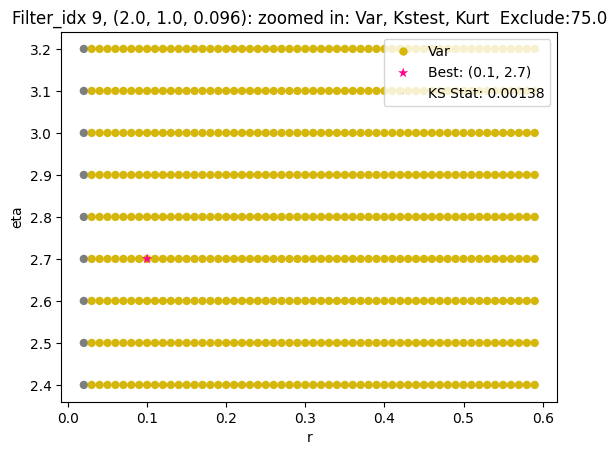

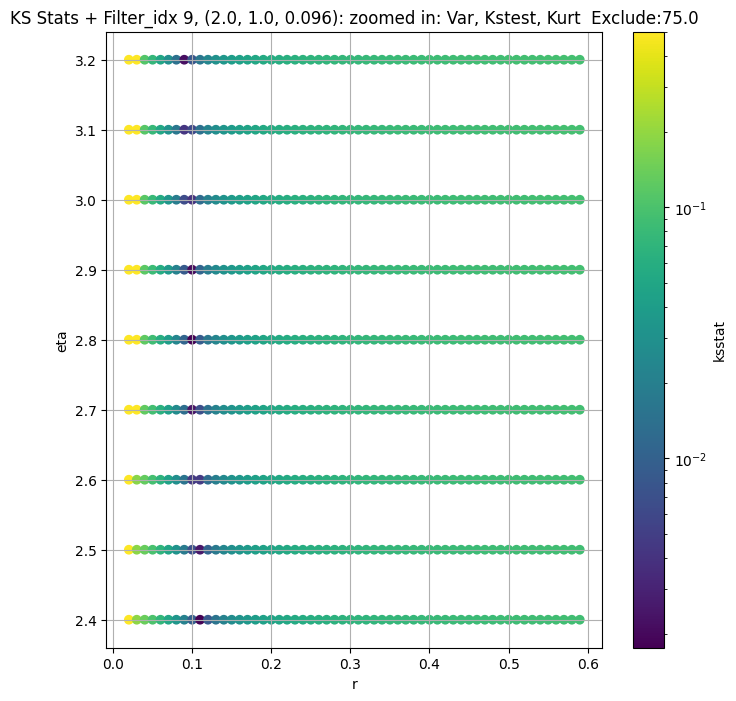

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.003761874544299021, var: 6.573792457580566


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.003253745832521221, var: 6.767854690551758


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.002419433022887073, var: 7.0092620849609375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.0020766168964764797, var: 7.33504056930542


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.002136640428718528, var: 7.852339744567871


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.004313538871814737, var: 8.931209564208984


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.014364650217809603, var: 14.930192947387695
Number of samples: 100000, Without approximation : 262144000.0


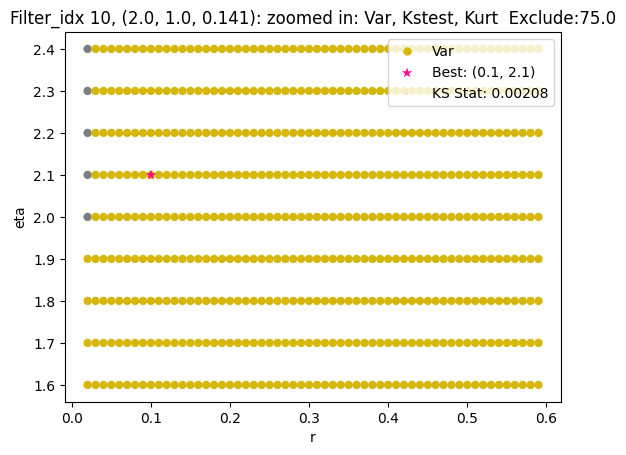

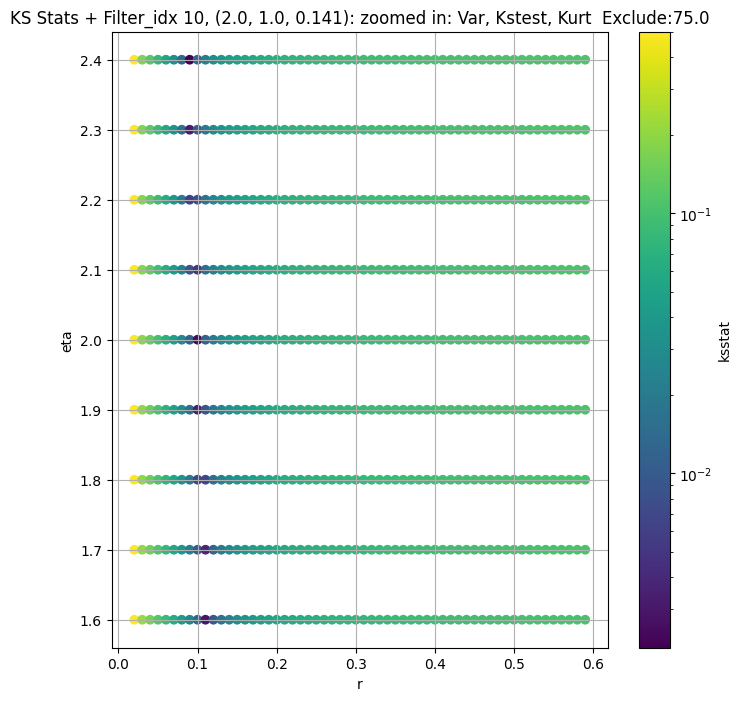

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 100 = 300, ksstat: 0.0046190212565223165, var: 2.7865781784057617


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 75 = 275, ksstat: 0.004137709643444709, var: 2.872168779373169


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 50 = 250, ksstat: 0.0036942639779384834, var: 2.9704196453094482


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 25 = 225, ksstat: 0.004252356689023573, var: 3.085016965866089


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + 0 = 200, ksstat: 0.004814002515519333, var: 3.2211928367614746


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -25 = 175, ksstat: 0.005536886177966077, var: 3.386584997177124


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -50 = 150, ksstat: 0.007240205140396583, var: 3.5919101238250732


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -75 = 125, ksstat: 0.007463824272485153, var: 3.8533458709716797


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 11, 200.0 + -100 = 100, ksstat: 0.009162779249744069, var: 4.198412895202637
Number of samples: 100000, Without approximation : 262144000.0


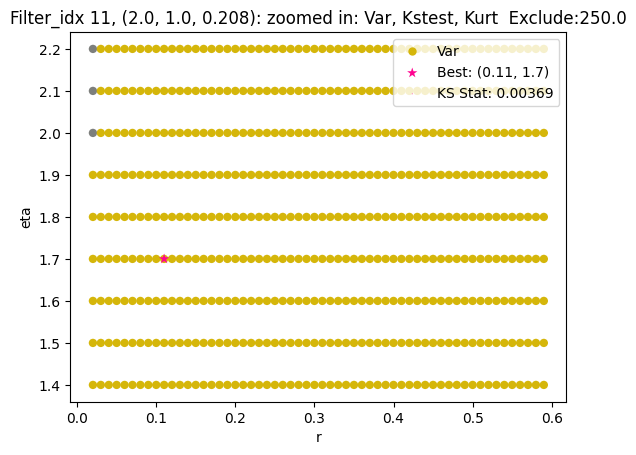

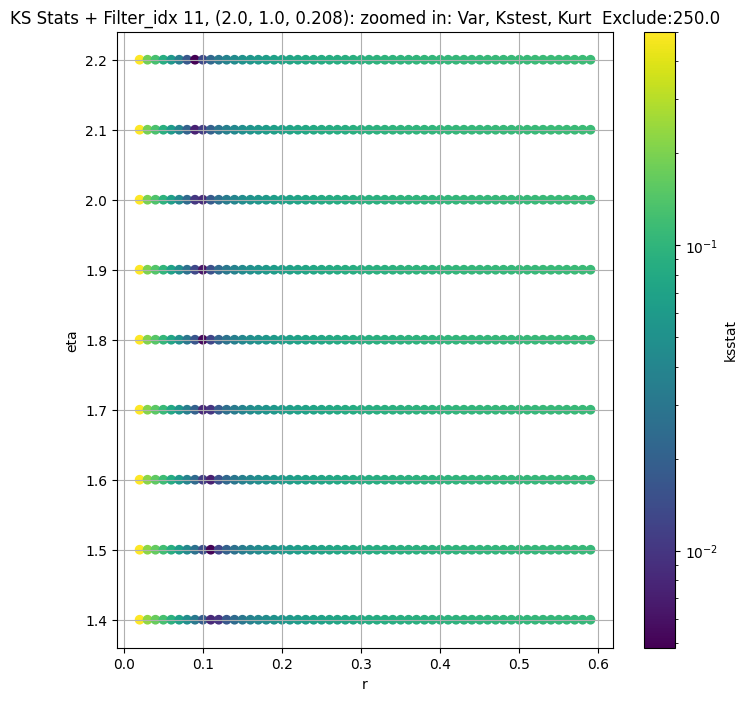

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.006097689813909742, var: 0.8176694512367249


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.005703243842509302, var: 0.836371123790741


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.005351426231739127, var: 0.8566802144050598


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.004928678118428516, var: 0.8789052963256836


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.004994848190350454, var: 0.9034687876701355


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.005081443579554257, var: 0.9309186935424805


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.005410903925937904, var: 0.9620658755302429


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.005899123316536414, var: 0.9980461597442627


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.006662866761304967, var: 1.0406540632247925
Number of samples: 100000, Without approximation : 262144000.0


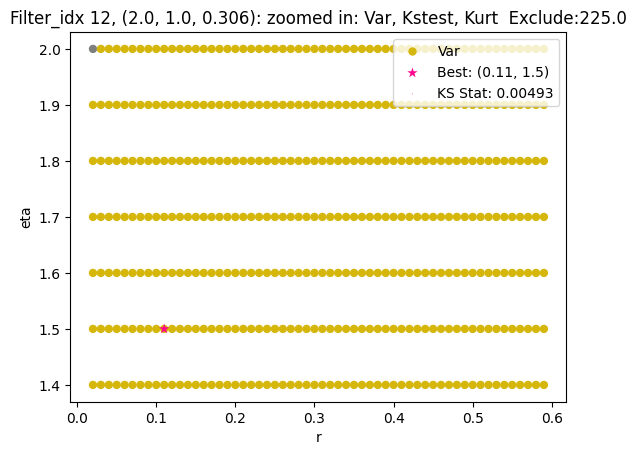

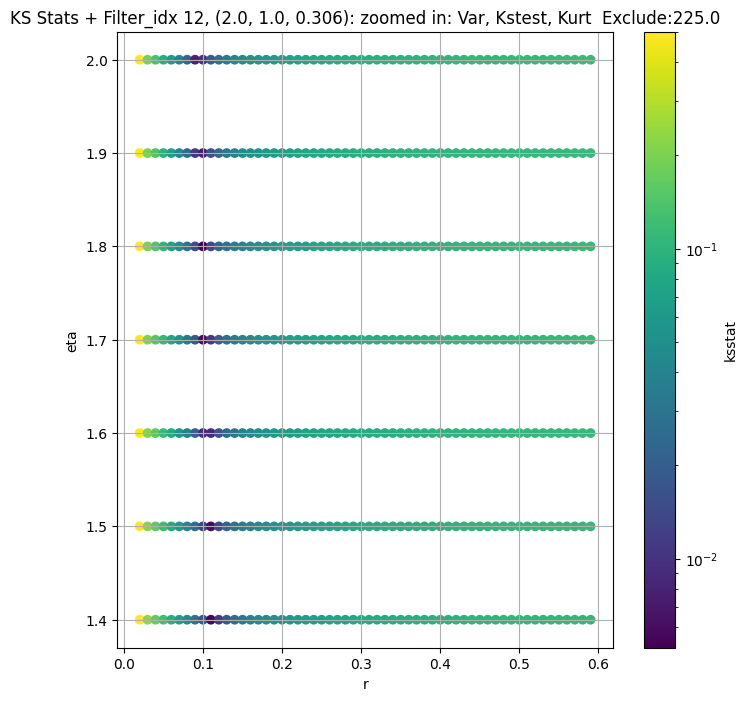

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 100 = 300, ksstat: 0.005936669811151374, var: 0.21559743583202362


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 75 = 275, ksstat: 0.005505725722185828, var: 0.22088773548603058


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 50 = 250, ksstat: 0.0051080905134234245, var: 0.2267456352710724


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 25 = 225, ksstat: 0.0046388674084372195, var: 0.23333530128002167


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 0 = 200, ksstat: 0.004160799469360266, var: 0.2408902645111084


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -25 = 175, ksstat: 0.004632980021522126, var: 0.24976685643196106


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -50 = 150, ksstat: 0.005340560444634157, var: 0.2604976296424866


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -75 = 125, ksstat: 0.0065375078405331966, var: 0.2738991677761078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -100 = 100, ksstat: 0.007321950965325841, var: 0.2913159430027008
Number of samples: 100000, Without approximation : 262144000.0


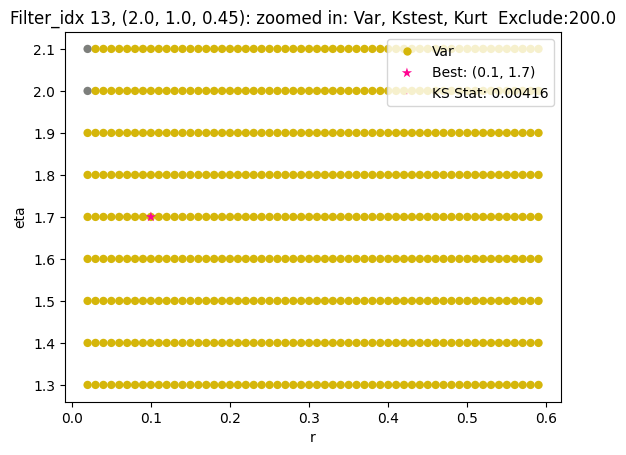

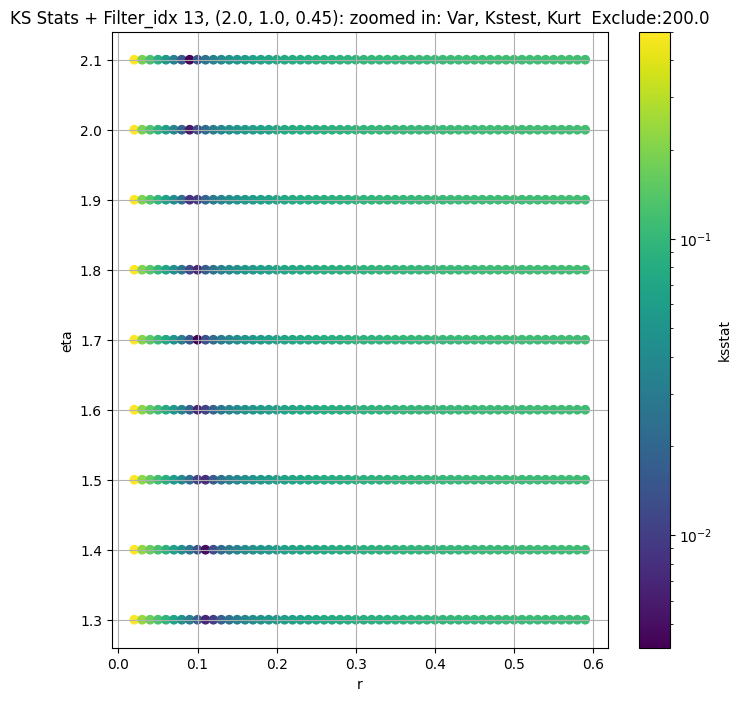

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + 100 = 200, ksstat: 0.002918705236563568, var: 22.27683448791504


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + 75 = 175, ksstat: 0.0024800636443182977, var: 22.853883743286133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + 50 = 150, ksstat: 0.0021346924865559558, var: 23.51897430419922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + 25 = 125, ksstat: 0.001823211666642116, var: 24.302066802978516


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + 0 = 100, ksstat: 0.0015666620991552208, var: 25.253957748413086


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + -25 = 75, ksstat: 0.0022073079788437755, var: 26.46407127380371


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + -50 = 50, ksstat: 0.0036433533536227025, var: 28.12584114074707


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + -75 = 25, ksstat: 0.005944814332572657, var: 30.85641098022461


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 100.0 + -100 = 0, ksstat: 0.015528653629940936, var: 48.09011459350586
Number of samples: 100000, Without approximation : 262144000.0


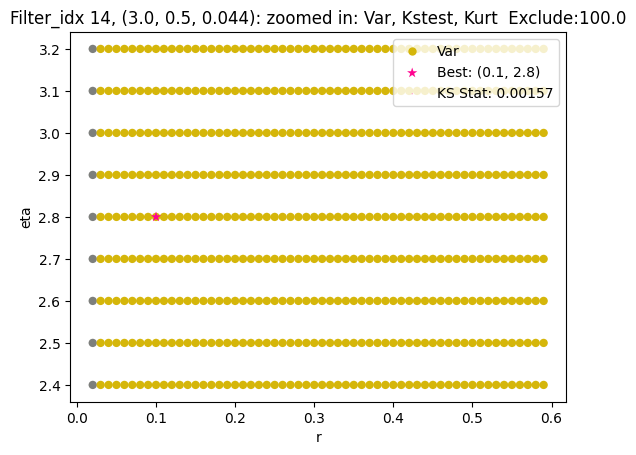

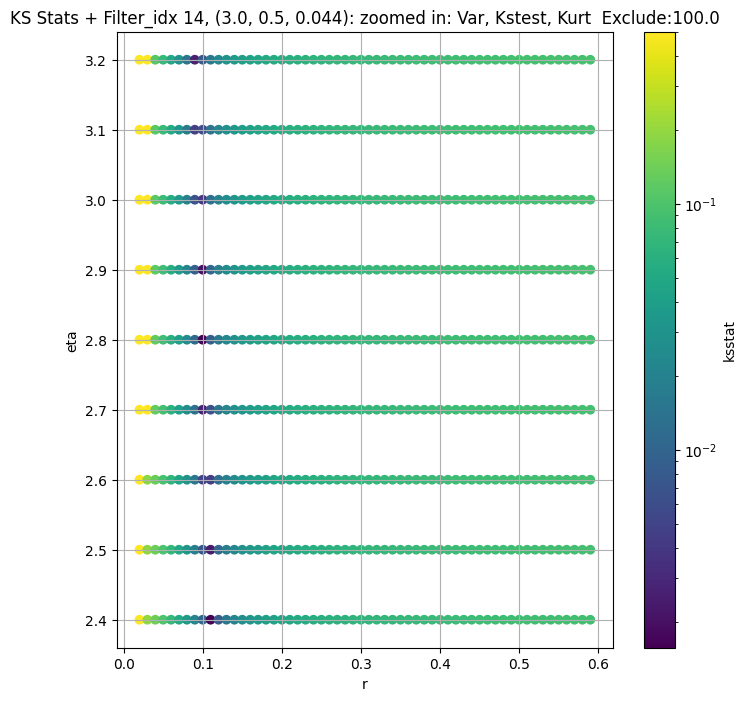

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 100 = 200, ksstat: 0.0032208778835268737, var: 12.693780899047852


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 75 = 175, ksstat: 0.0022857718115892878, var: 13.054498672485352


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 50 = 150, ksstat: 0.0019166281464605313, var: 13.489302635192871


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 25 = 125, ksstat: 0.0016521914203819765, var: 14.03774642944336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 0 = 100, ksstat: 0.001409586058293777, var: 14.775721549987793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -25 = 75, ksstat: 0.0032505214640752705, var: 15.857039451599121


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -50 = 50, ksstat: 0.005686078126941885, var: 17.632387161254883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -75 = 25, ksstat: 0.009965728521930832, var: 21.122961044311523


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -100 = 0, ksstat: 0.021351314964862207, var: 38.4032096862793
Number of samples: 100000, Without approximation : 262144000.0


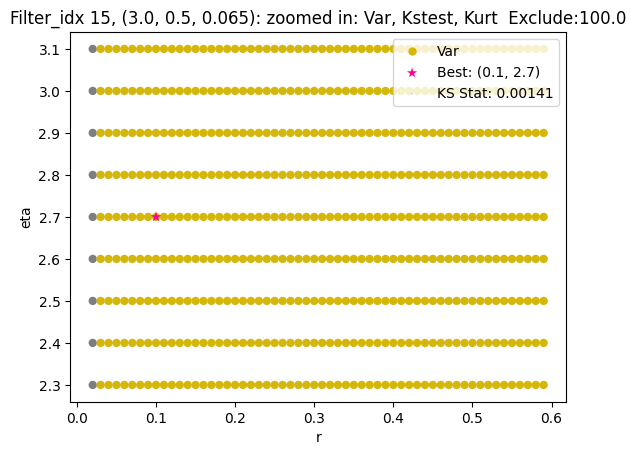

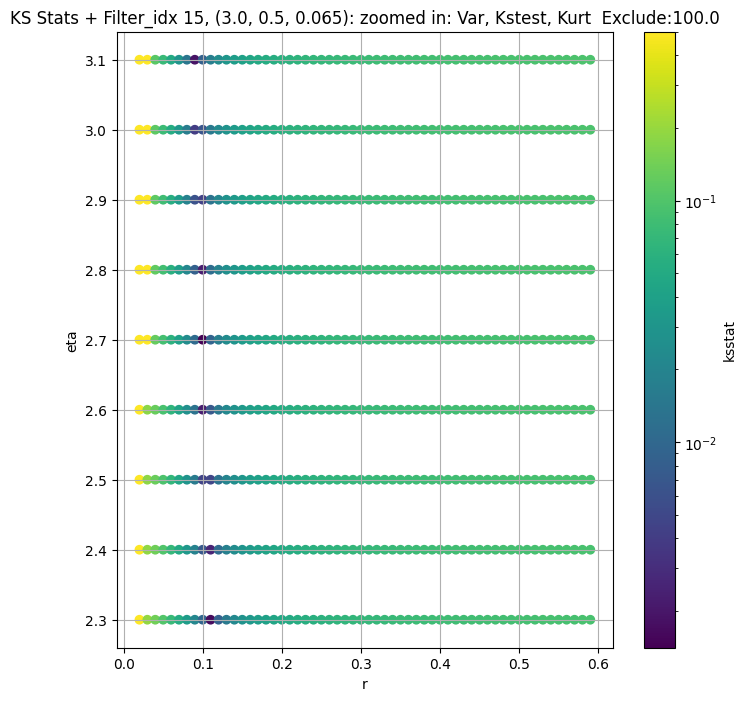

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + 100 = 300, ksstat: 0.004700109342326231, var: 9.394904136657715


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + 75 = 275, ksstat: 0.00420191728148878, var: 9.597107887268066


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + 50 = 250, ksstat: 0.0036547899852944488, var: 9.825236320495605


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + 25 = 225, ksstat: 0.0031431256305363142, var: 10.087882041931152


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + 0 = 200, ksstat: 0.0027446999604344713, var: 10.39819049835205


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + -25 = 175, ksstat: 0.002434912837551151, var: 10.777475357055664


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + -50 = 150, ksstat: 0.003248129966494484, var: 11.259221076965332


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + -75 = 125, ksstat: 0.003899350051263961, var: 11.891684532165527


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 16, 200.0 + -100 = 100, ksstat: 0.005300140253108321, var: 12.747089385986328
Number of samples: 100000, Without approximation : 262144000.0


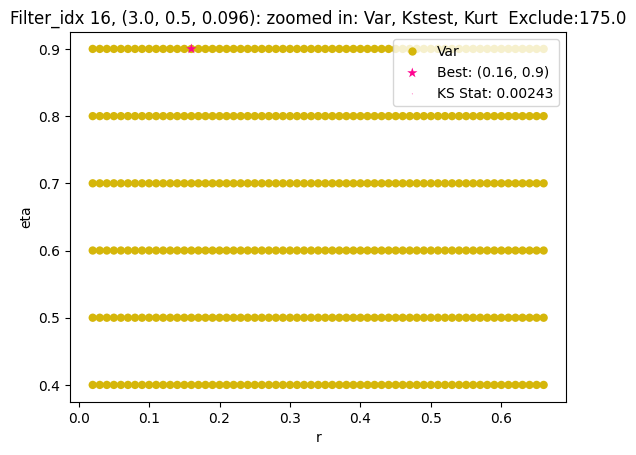

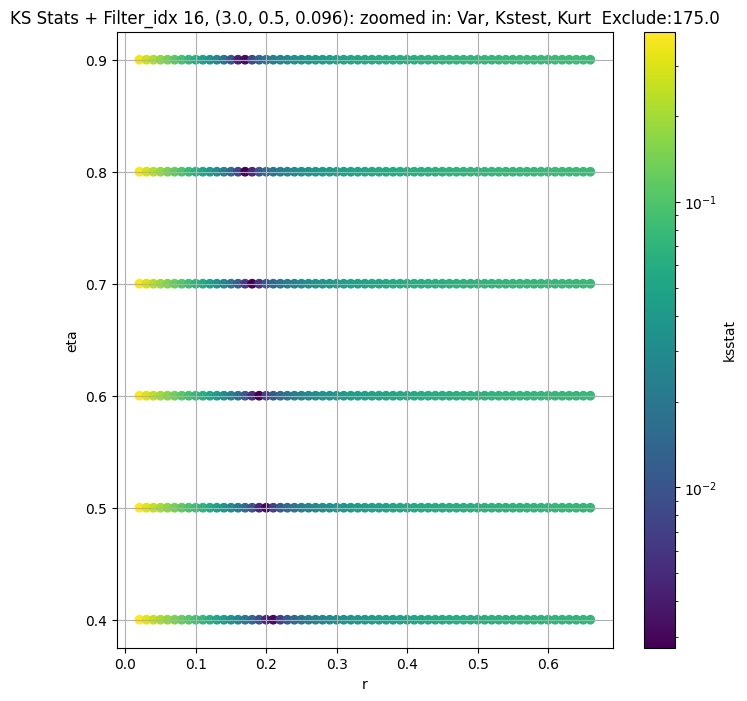

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + 100 = 300, ksstat: 0.006501332329153842, var: 5.174738883972168


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + 75 = 275, ksstat: 0.005958905312869283, var: 5.296024322509766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + 50 = 250, ksstat: 0.005376504014210415, var: 5.432600975036621


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + 25 = 225, ksstat: 0.004734277154246656, var: 5.589066505432129


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + 0 = 200, ksstat: 0.004174749091460095, var: 5.772475719451904


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + -25 = 175, ksstat: 0.003495523654536401, var: 5.99348258972168


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + -50 = 150, ksstat: 0.002980734982833022, var: 6.271037578582764


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + -75 = 125, ksstat: 0.004081977098677719, var: 6.642321586608887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 17, 200.0 + -100 = 100, ksstat: 0.005196770433253062, var: 7.178539752960205
Number of samples: 100000, Without approximation : 262144000.0


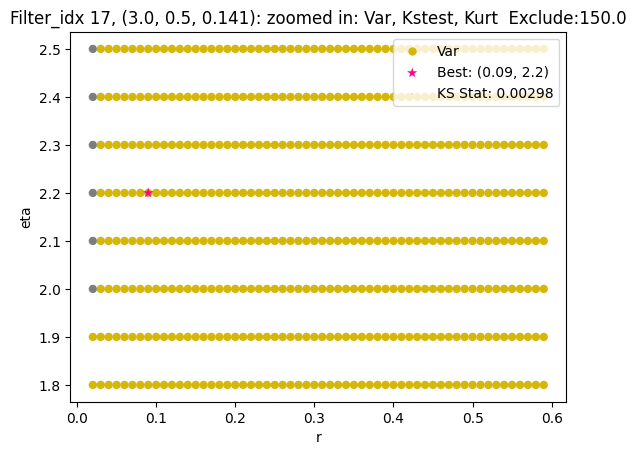

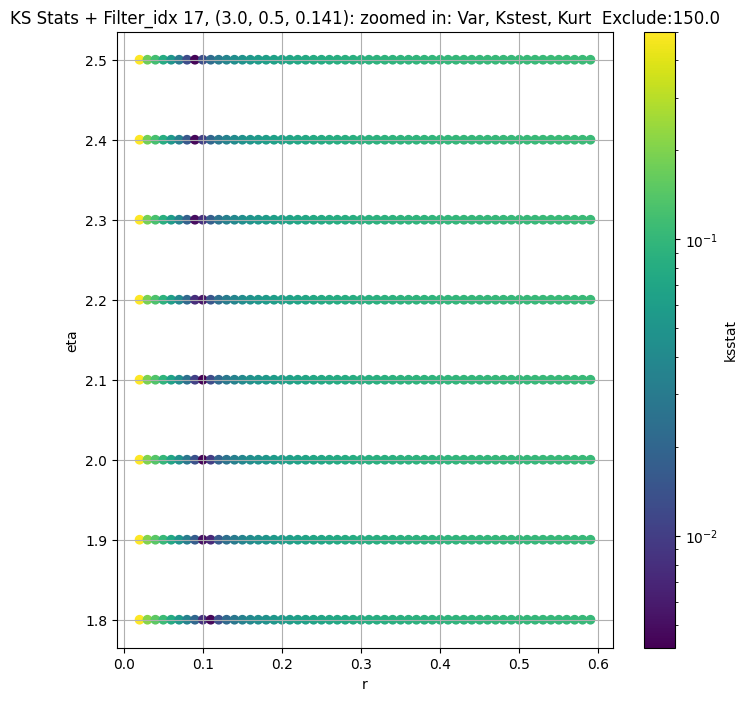

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 100 = 300, ksstat: 0.006830405839694489, var: 1.4475176334381104


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 75 = 275, ksstat: 0.006415610982015832, var: 1.4776514768600464


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 50 = 250, ksstat: 0.0060659042551247655, var: 1.5107612609863281


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 25 = 225, ksstat: 0.005590794889234418, var: 1.547698974609375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 0 = 200, ksstat: 0.005068455341918798, var: 1.5897737741470337


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -25 = 175, ksstat: 0.004493304162211519, var: 1.638991355895996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -50 = 150, ksstat: 0.004037782554589642, var: 1.698830246925354


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -75 = 125, ksstat: 0.005086639579302554, var: 1.7753715515136719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -100 = 100, ksstat: 0.005450151604451059, var: 1.8792771100997925
Number of samples: 100000, Without approximation : 262144000.0


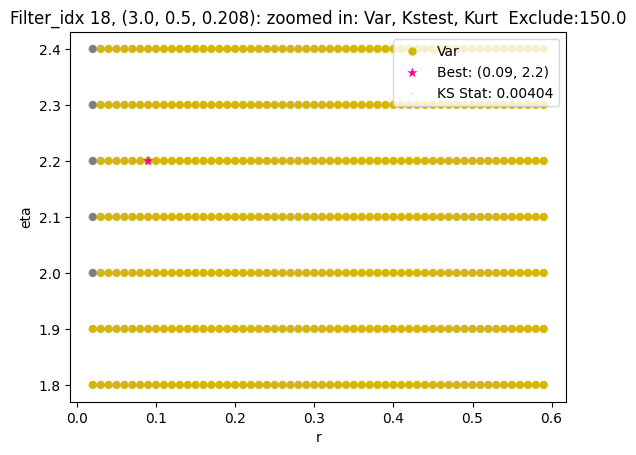

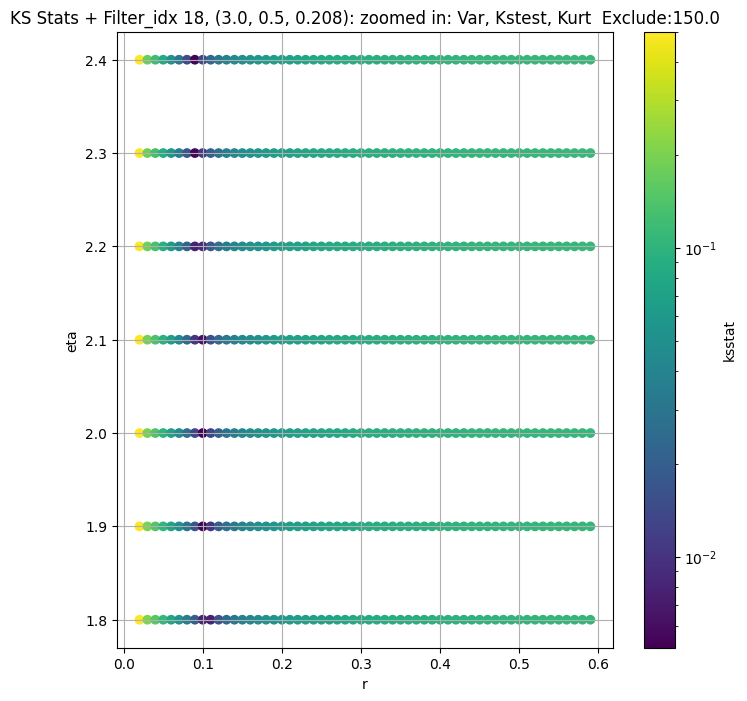

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 100 = 300, ksstat: 0.005880431965654034, var: 0.37069281935691833


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 75 = 275, ksstat: 0.006404694490573126, var: 0.3811759650707245


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 50 = 250, ksstat: 0.0067384667190848735, var: 0.39273908734321594


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 25 = 225, ksstat: 0.006932369659901072, var: 0.40561068058013916


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 0 = 200, ksstat: 0.00721444857939102, var: 0.4201018512248993


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -25 = 175, ksstat: 0.007643396595893748, var: 0.4366494417190552


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -50 = 150, ksstat: 0.008748466628759277, var: 0.4558841288089752


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -75 = 125, ksstat: 0.009944706827389294, var: 0.47870826721191406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -100 = 100, ksstat: 0.010017703898193009, var: 0.506624698638916
Number of samples: 100000, Without approximation : 262144000.0


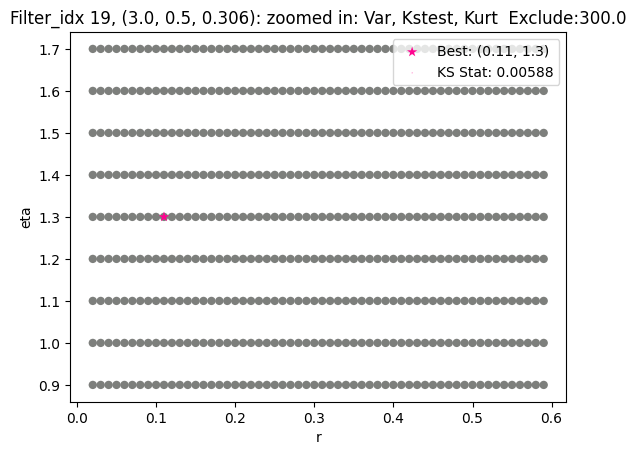

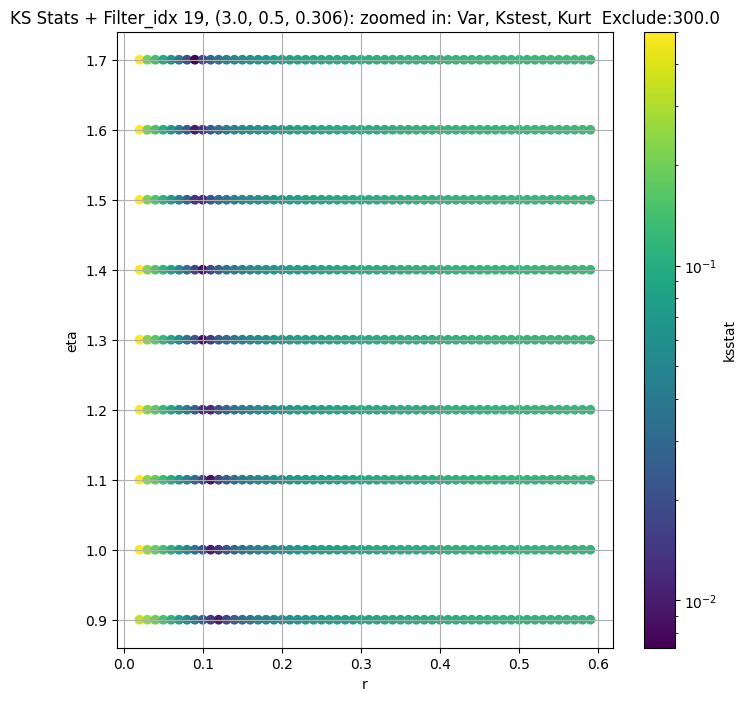

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 100 = 300, ksstat: 0.006447941274861452, var: 0.07085488736629486


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 75 = 275, ksstat: 0.006546505386732793, var: 0.07276380807161331


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 50 = 250, ksstat: 0.0069591222296652155, var: 0.07486280053853989


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 25 = 225, ksstat: 0.006607182811956935, var: 0.07719067484140396


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 0 = 200, ksstat: 0.007393867663277431, var: 0.07980207353830338


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -25 = 175, ksstat: 0.008596023033192096, var: 0.08277063816785812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -50 = 150, ksstat: 0.008650634019954778, var: 0.0862002819776535


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -75 = 125, ksstat: 0.009107142270671997, var: 0.09026185423135757


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -100 = 100, ksstat: 0.009766573300512976, var: 0.09526992589235306
Number of samples: 100000, Without approximation : 262144000.0


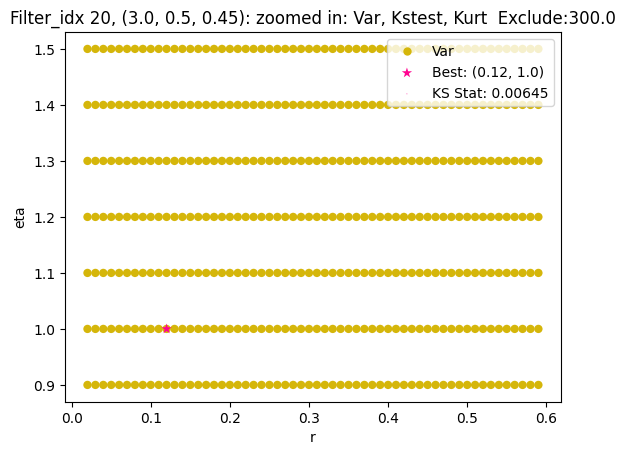

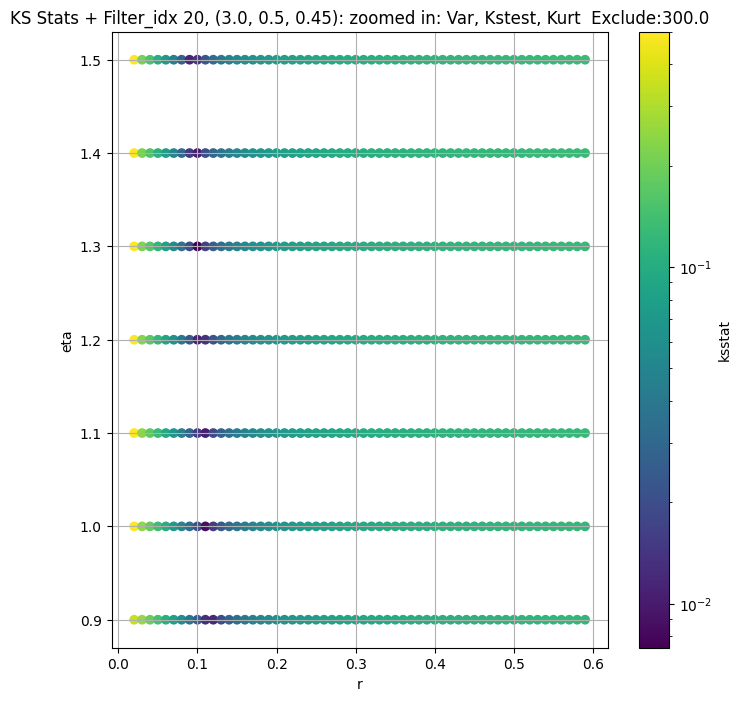

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 100 = 300, ksstat: 0.004211721766463894, var: 21.282039642333984


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 75 = 275, ksstat: 0.003814660331907218, var: 21.735977172851562


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 50 = 250, ksstat: 0.0034458774499367406, var: 22.23963737487793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 25 = 225, ksstat: 0.003091945971805332, var: 22.805696487426758


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 0 = 200, ksstat: 0.002787925072697428, var: 23.452674865722656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -25 = 175, ksstat: 0.002452759250269887, var: 24.208860397338867


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -50 = 150, ksstat: 0.00217257075730778, var: 25.11832046508789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -75 = 125, ksstat: 0.0020159273439521105, var: 26.25278663635254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -100 = 100, ksstat: 0.003553734268437081, var: 27.74425506591797
Number of samples: 100000, Without approximation : 262144000.0


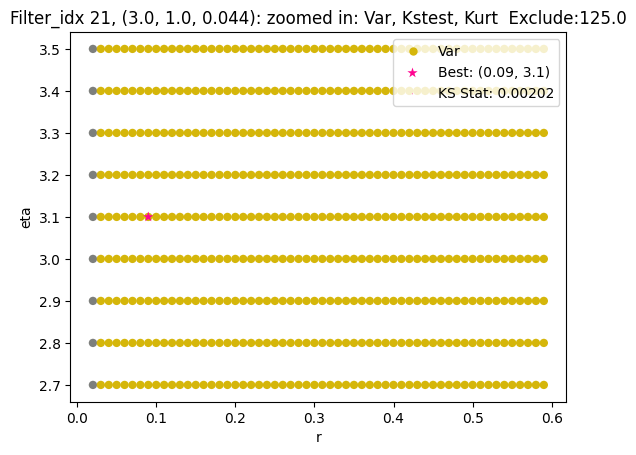

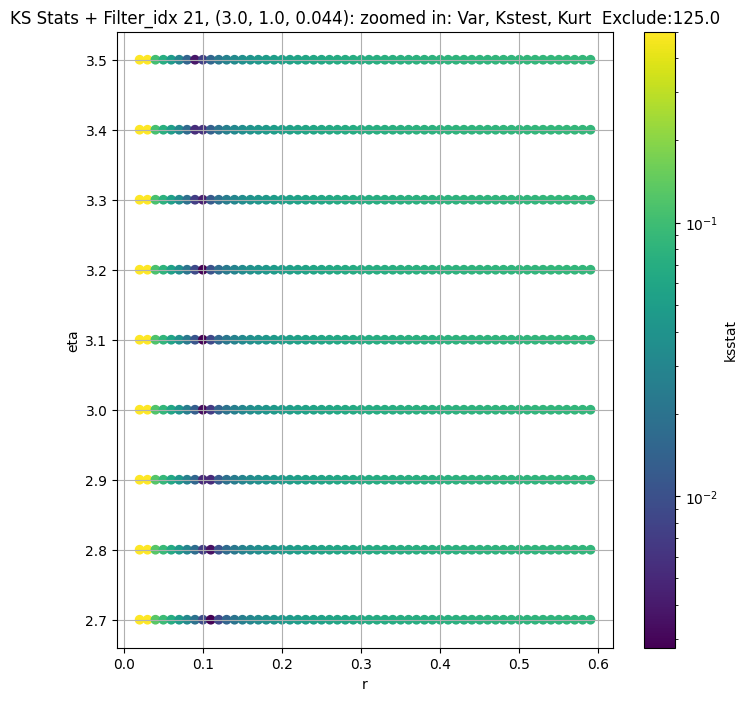

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 100 = 200, ksstat: 0.0029131355499053546, var: 13.22067642211914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 75 = 175, ksstat: 0.002418871308201842, var: 13.572759628295898


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 50 = 150, ksstat: 0.002077285877100961, var: 13.98193073272705


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 25 = 125, ksstat: 0.0017931352741508946, var: 14.469587326049805


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 0 = 100, ksstat: 0.001510773535493004, var: 15.072444915771484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -25 = 75, ksstat: 0.002253805220236632, var: 15.860735893249512


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -50 = 50, ksstat: 0.00404183905026223, var: 17.00119972229004


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -75 = 25, ksstat: 0.006755321210218379, var: 19.08237648010254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -100 = 0, ksstat: 0.019153921248639474, var: 34.55642318725586
Number of samples: 100000, Without approximation : 262144000.0


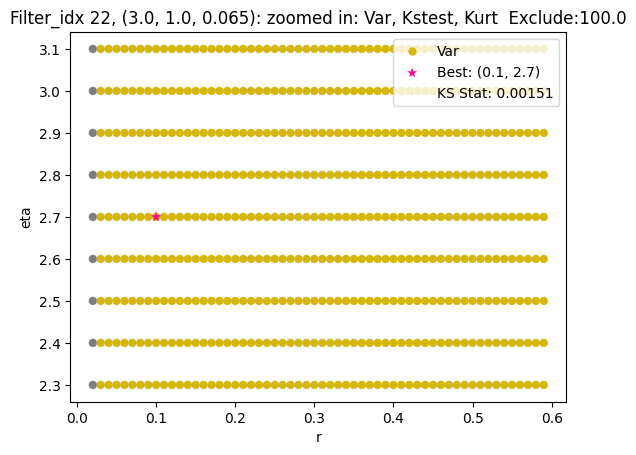

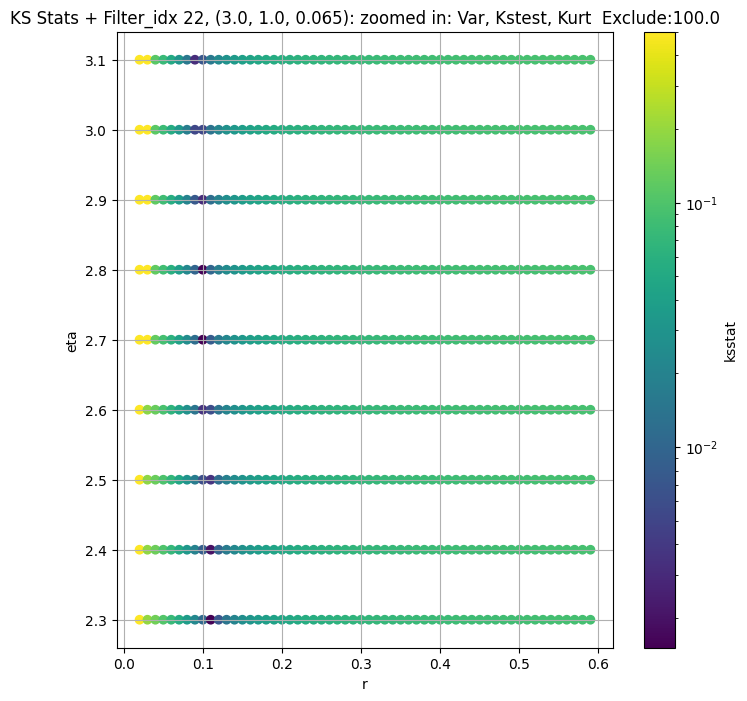

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 100 = 200, ksstat: 0.00411802840723946, var: 8.704019546508789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 75 = 175, ksstat: 0.00328132768946654, var: 8.954877853393555


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 50 = 150, ksstat: 0.002274271935286176, var: 9.26239013671875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 25 = 125, ksstat: 0.0015219256064055303, var: 9.655903816223145


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 0 = 100, ksstat: 0.0012848955305910792, var: 10.191012382507324


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -25 = 75, ksstat: 0.002545839214999804, var: 10.992132186889648


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -50 = 50, ksstat: 0.0051767626460726135, var: 12.368408203125


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -75 = 25, ksstat: 0.00938562445068769, var: 15.22220230102539


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -100 = 0, ksstat: 0.02506918218827503, var: 34.3715934753418
Number of samples: 100000, Without approximation : 262144000.0


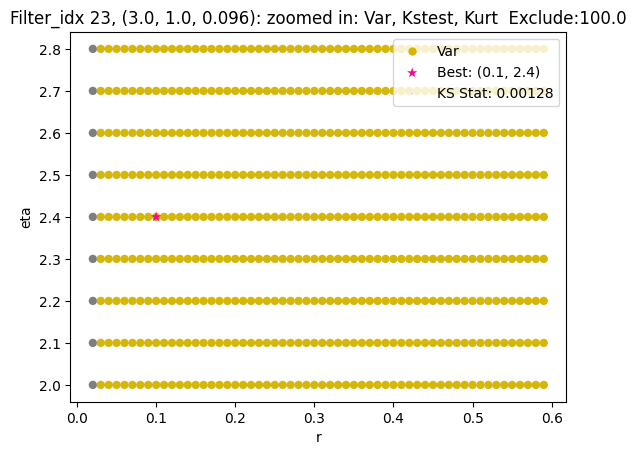

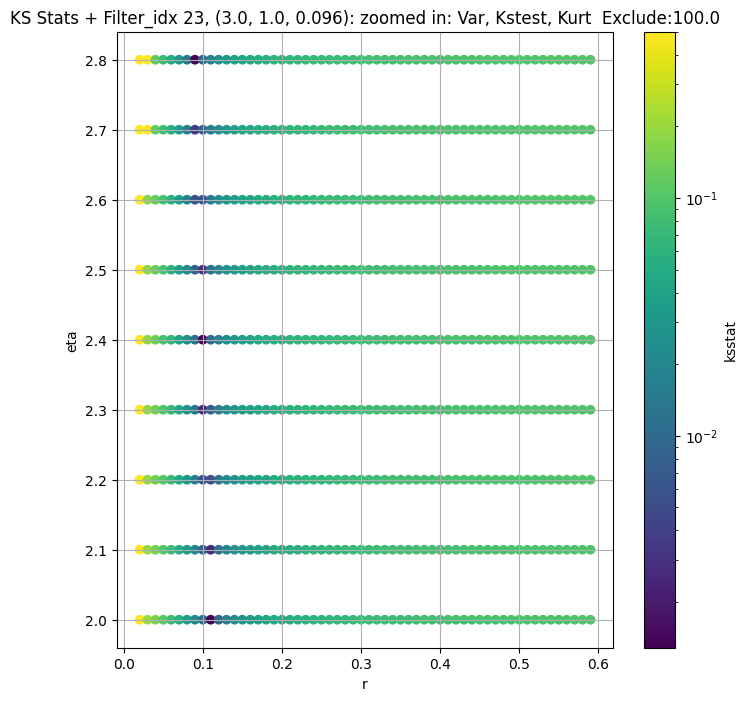

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + 100 = 300, ksstat: 0.004986171301177733, var: 4.822157382965088


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + 75 = 275, ksstat: 0.004585094804705779, var: 4.917812824249268


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + 50 = 250, ksstat: 0.004196672699289139, var: 5.02238655090332


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + 25 = 225, ksstat: 0.003822139081763017, var: 5.137877464294434


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + 0 = 200, ksstat: 0.003452200156568108, var: 5.266948223114014


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + -25 = 175, ksstat: 0.003087570015873597, var: 5.413602828979492


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + -50 = 150, ksstat: 0.003585057116304191, var: 5.583543300628662


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + -75 = 125, ksstat: 0.0040503168335011, var: 5.785284519195557


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 24, 200.0 + -100 = 100, ksstat: 0.004451078266921149, var: 6.032880783081055
Number of samples: 100000, Without approximation : 262144000.0


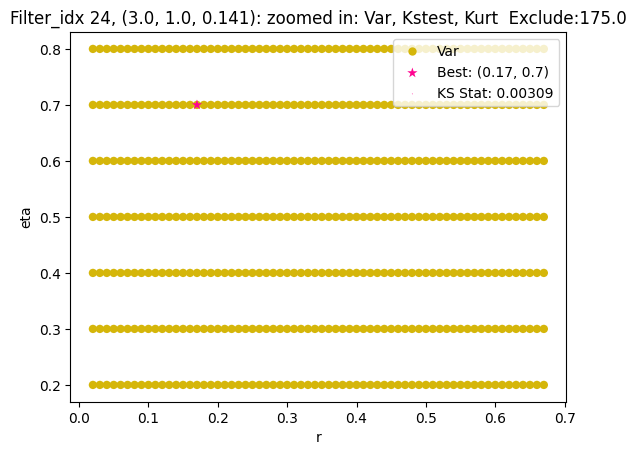

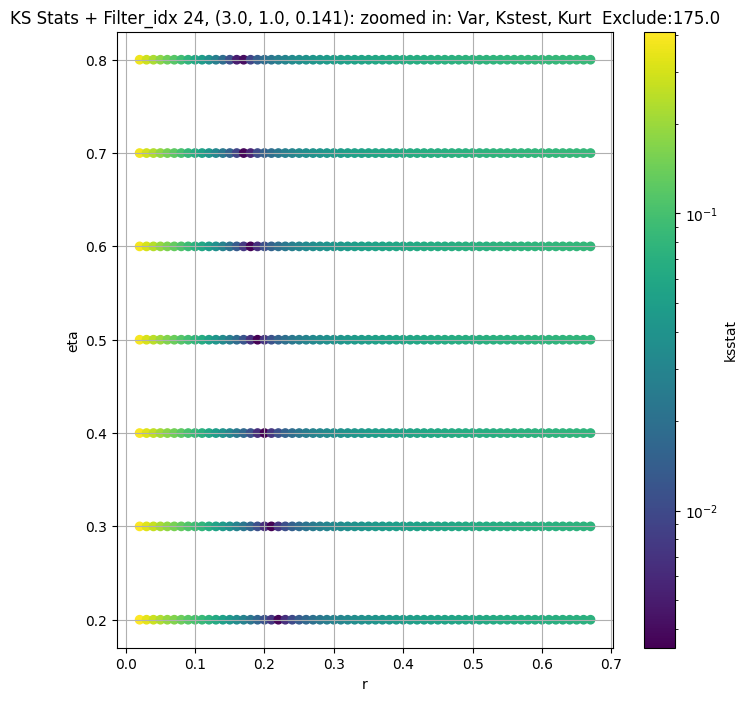

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + 100 = 300, ksstat: 0.005681203157793191, var: 1.8288472890853882


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + 75 = 275, ksstat: 0.005258614389699925, var: 1.874908208847046


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + 50 = 250, ksstat: 0.005085194732035059, var: 1.925681710243225


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + 25 = 225, ksstat: 0.005125379085380244, var: 1.9822258949279785


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + 0 = 200, ksstat: 0.005490233955345758, var: 2.0460596084594727


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + -25 = 175, ksstat: 0.006056109873467552, var: 2.1194257736206055


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + -50 = 150, ksstat: 0.006879157374340972, var: 2.205674409866333


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + -75 = 125, ksstat: 0.0077055324385175705, var: 2.310473680496216


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 25, 200.0 + -100 = 100, ksstat: 0.008558707312803726, var: 2.4432179927825928
Number of samples: 100000, Without approximation : 262144000.0


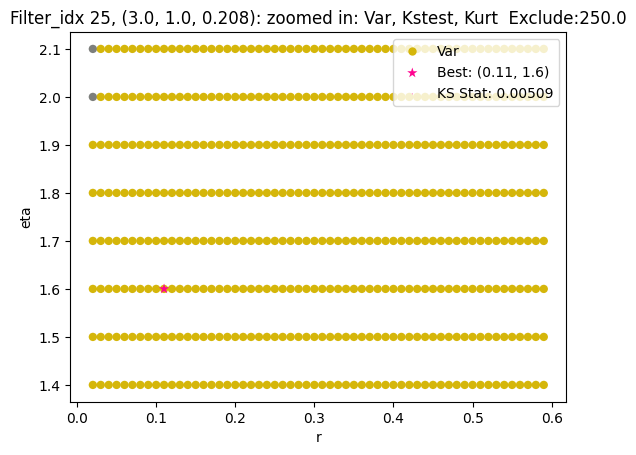

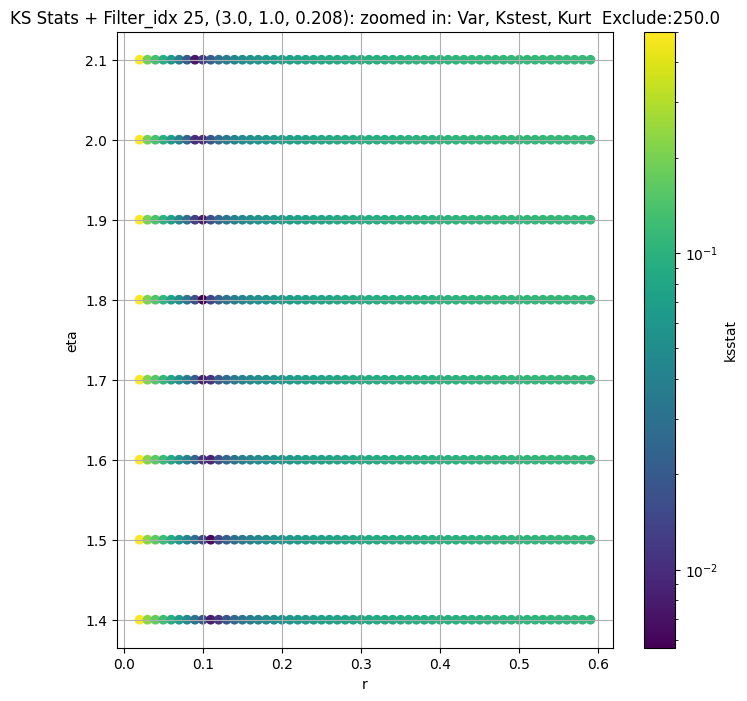

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 100 = 300, ksstat: 0.007052511399407699, var: 0.4457564055919647


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 75 = 275, ksstat: 0.006689006165730708, var: 0.4545021057128906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 50 = 250, ksstat: 0.006388426349937519, var: 0.46389147639274597


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 25 = 225, ksstat: 0.0060021515524273615, var: 0.4740351438522339


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + 0 = 200, ksstat: 0.005618686996150979, var: 0.4850819408893585


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -25 = 175, ksstat: 0.005071884186816145, var: 0.49723878502845764


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -50 = 150, ksstat: 0.005994499313811574, var: 0.5108034014701843


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -75 = 125, ksstat: 0.005972665806093569, var: 0.5262216329574585


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 200.0 + -100 = 100, ksstat: 0.006300308354185824, var: 0.5442109107971191
Number of samples: 100000, Without approximation : 262144000.0


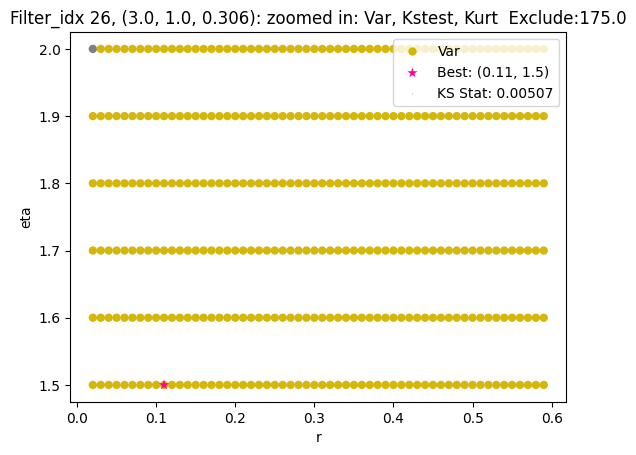

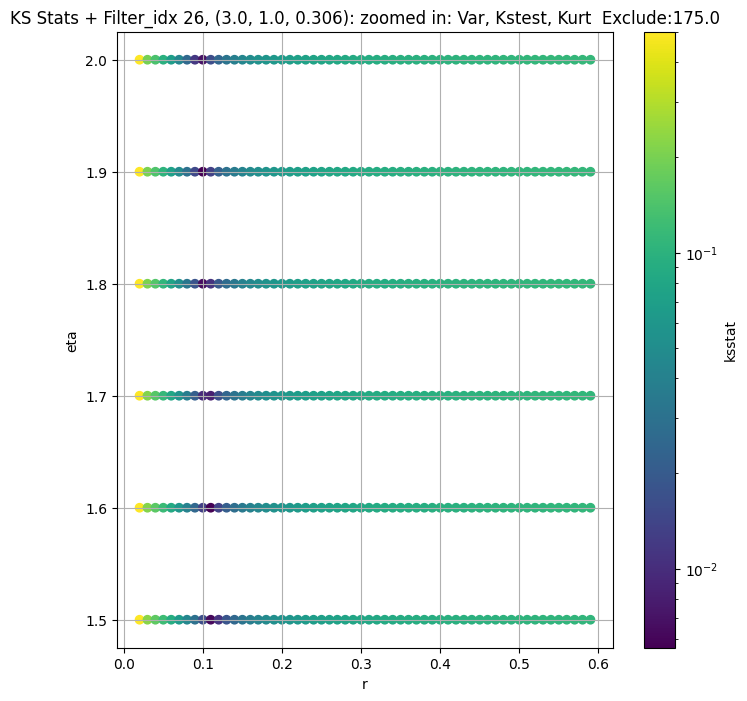

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + 100 = 300, ksstat: 0.008890349038109036, var: 0.10722921788692474


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + 75 = 275, ksstat: 0.009219670167615823, var: 0.11134728044271469


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + 50 = 250, ksstat: 0.00987762612757681, var: 0.11604316532611847


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + 25 = 225, ksstat: 0.010265801473841374, var: 0.12146299332380295


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + 0 = 200, ksstat: 0.01048466832367334, var: 0.1278039813041687


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + -25 = 175, ksstat: 0.011955528547278993, var: 0.1353464424610138


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + -50 = 150, ksstat: 0.013060853477067313, var: 0.1445041447877884


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + -75 = 125, ksstat: 0.01453660819856889, var: 0.15597152709960938


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 27, 200.0 + -100 = 100, ksstat: 0.015401140844208572, var: 0.17090705037117004
Number of samples: 100000, Without approximation : 262144000.0


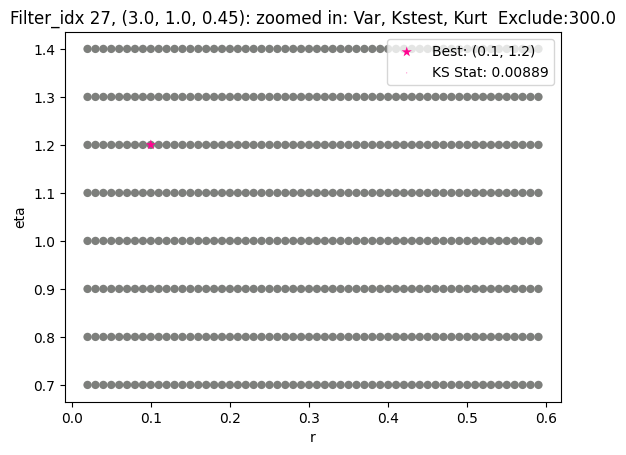

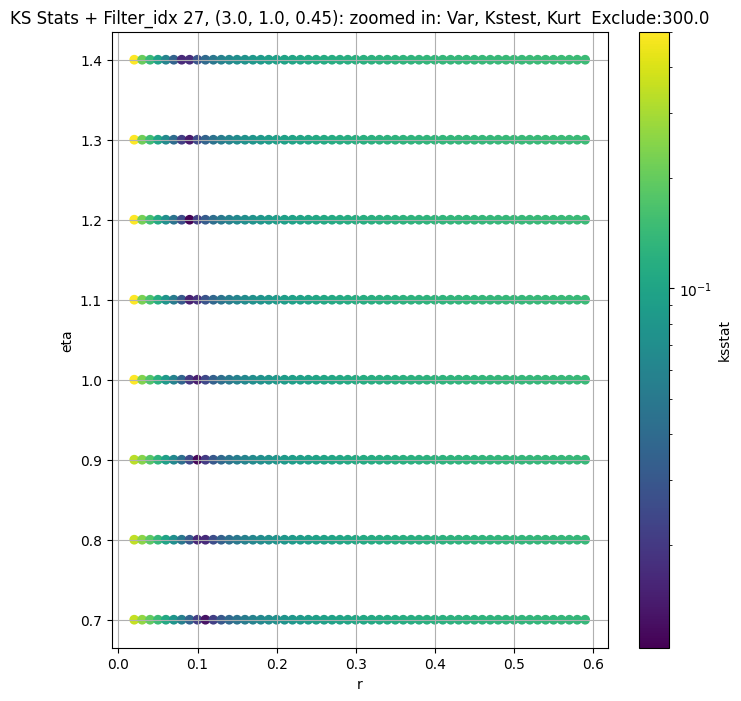

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 100 = 200, ksstat: 0.002984308434246463, var: 23.184694290161133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 75 = 175, ksstat: 0.002598950134444956, var: 23.758840560913086


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 50 = 150, ksstat: 0.0022275680473966553, var: 24.416261672973633


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 25 = 125, ksstat: 0.0019228247734655035, var: 25.186296463012695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 0 = 100, ksstat: 0.0016439506106595793, var: 26.118146896362305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -25 = 75, ksstat: 0.0022654229135436604, var: 27.303220748901367


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -50 = 50, ksstat: 0.0036361764403672614, var: 28.95025062561035


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -75 = 25, ksstat: 0.005838186685613991, var: 31.673986434936523


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -100 = 0, ksstat: 0.015167423392134949, var: 48.74940490722656
Number of samples: 100000, Without approximation : 262144000.0


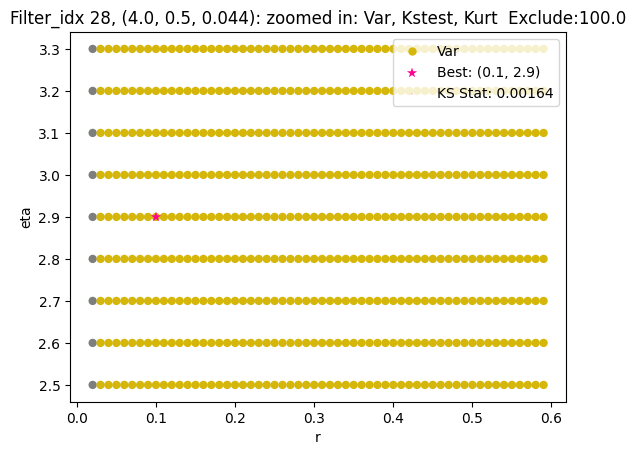

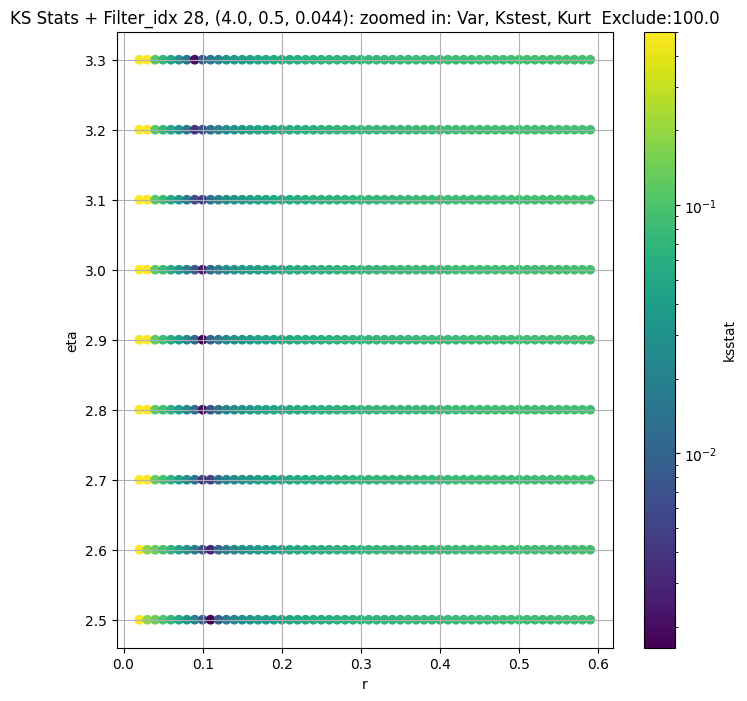

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.004043824283759018, var: 11.082723617553711


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.003478109152847797, var: 11.337562561035156


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.003075412564816915, var: 11.632881164550781


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.0022559338012388963, var: 11.985489845275879


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.0020099564045800156, var: 12.42395305633545


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.0015394075838915389, var: 13.003623962402344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.0026595297917141603, var: 13.86630630493164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.005446189364883877, var: 15.453224182128906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.016087494668762345, var: 24.9248104095459
Number of samples: 100000, Without approximation : 262144000.0


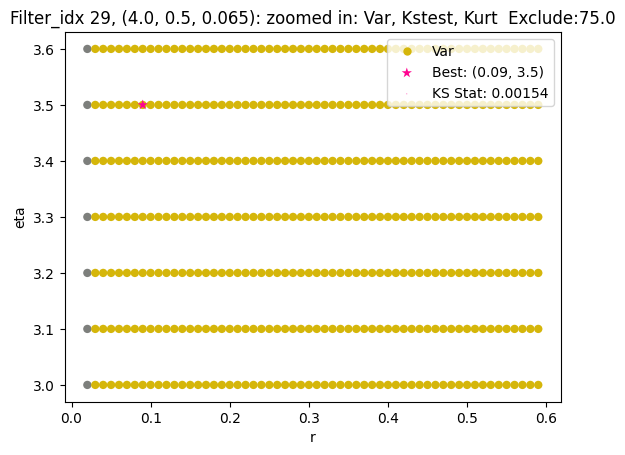

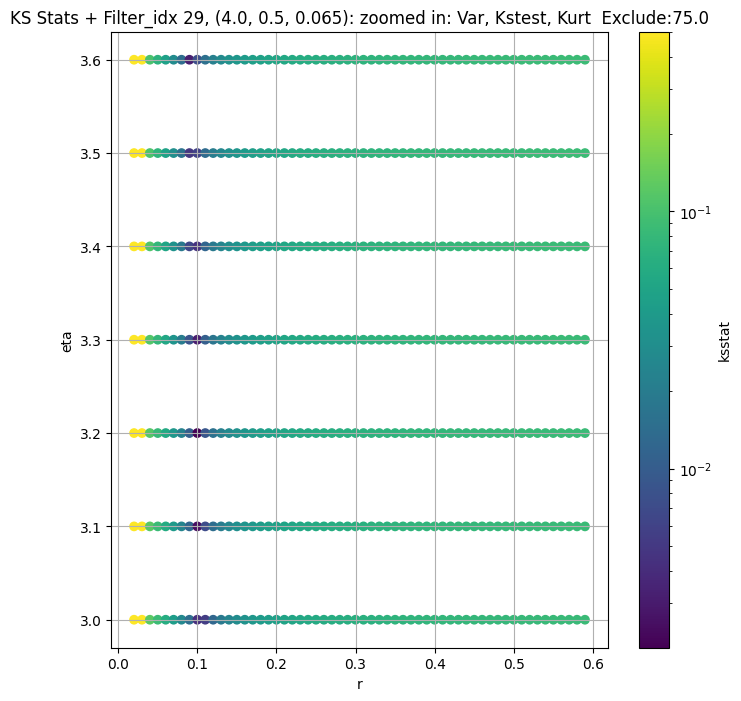

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 100 = 200, ksstat: 0.005873683333913901, var: 9.868476867675781


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 75 = 175, ksstat: 0.005151315234706688, var: 10.139158248901367


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 50 = 150, ksstat: 0.004294344026041973, var: 10.46082878112793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 25 = 125, ksstat: 0.003738585844697051, var: 10.856258392333984


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 0 = 100, ksstat: 0.002517335671032142, var: 11.368529319763184


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -25 = 75, ksstat: 0.0016339721075325775, var: 12.098729133605957


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -50 = 50, ksstat: 0.002228362808612494, var: 13.341322898864746


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -75 = 25, ksstat: 0.005960874955793949, var: 16.009550094604492


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -100 = 0, ksstat: 0.017319777160878458, var: 30.87340545654297
Number of samples: 100000, Without approximation : 262144000.0


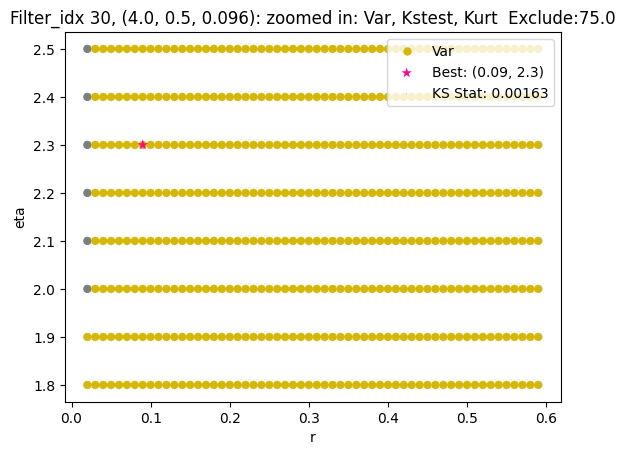

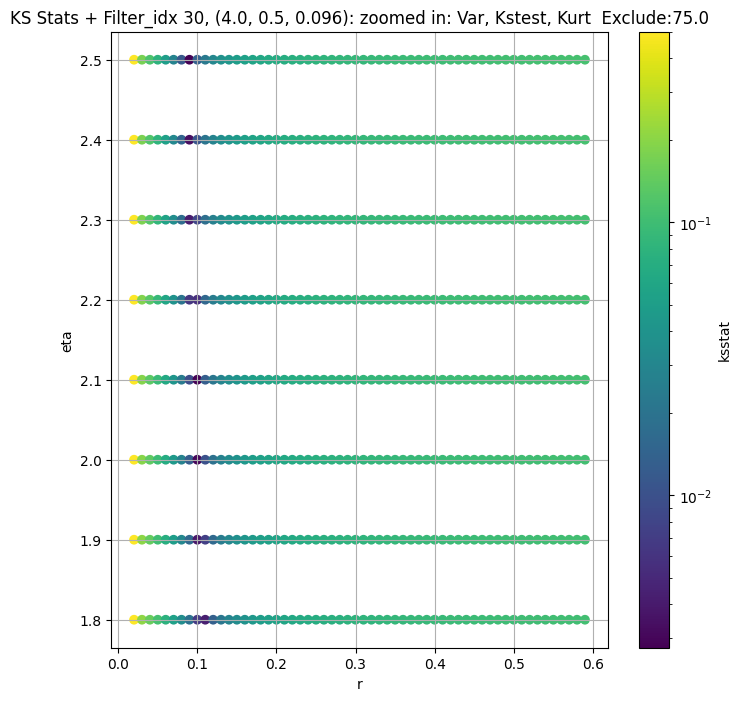

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 100 = 300, ksstat: 0.005844908376357316, var: 4.494998931884766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 75 = 275, ksstat: 0.005347341056930733, var: 4.5969157218933105


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 50 = 250, ksstat: 0.004961760554414895, var: 4.708398342132568


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 25 = 225, ksstat: 0.004485915484264913, var: 4.831672191619873


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + 0 = 200, ksstat: 0.00398944590269578, var: 4.969915390014648


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -25 = 175, ksstat: 0.003549115771656841, var: 5.127870559692383


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -50 = 150, ksstat: 0.0038073287852466997, var: 5.313326358795166


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -75 = 125, ksstat: 0.004330408474366165, var: 5.5417160987854


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 200.0 + -100 = 100, ksstat: 0.004393077392881306, var: 5.852967262268066
Number of samples: 100000, Without approximation : 262144000.0


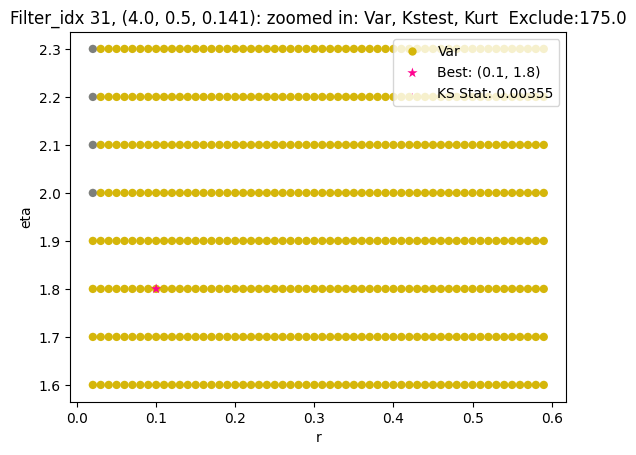

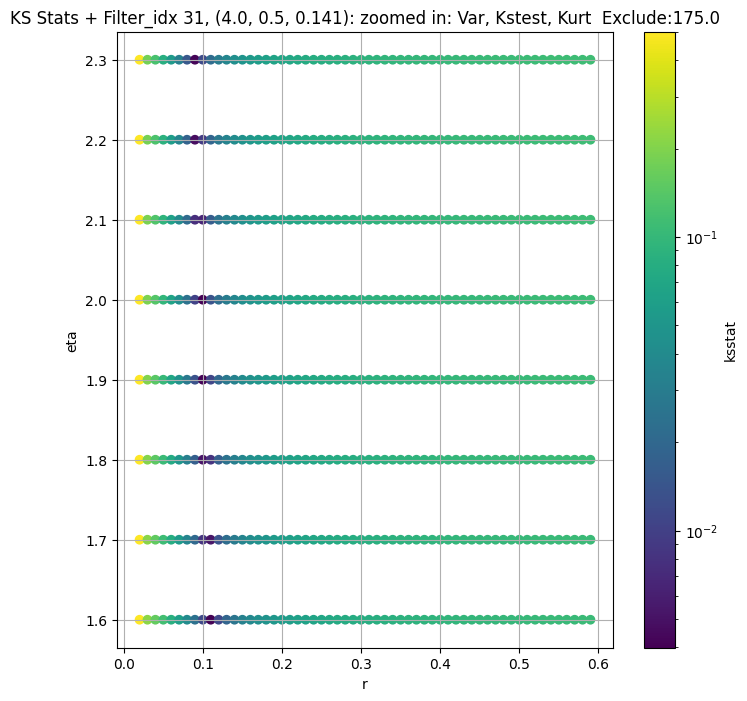

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 100 = 300, ksstat: 0.005687679364790563, var: 1.4568324089050293


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 75 = 275, ksstat: 0.00526037623035347, var: 1.4931050539016724


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 50 = 250, ksstat: 0.004873083155916391, var: 1.5329384803771973


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 25 = 225, ksstat: 0.004438206658290089, var: 1.5771069526672363


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 0 = 200, ksstat: 0.004028196339567303, var: 1.626662254333496


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -25 = 175, ksstat: 0.00444686220926771, var: 1.6830817461013794


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -50 = 150, ksstat: 0.005296813835315772, var: 1.7485764026641846


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -75 = 125, ksstat: 0.006018836456222476, var: 1.8266687393188477


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -100 = 100, ksstat: 0.006975853619860584, var: 1.923311471939087
Number of samples: 100000, Without approximation : 262144000.0


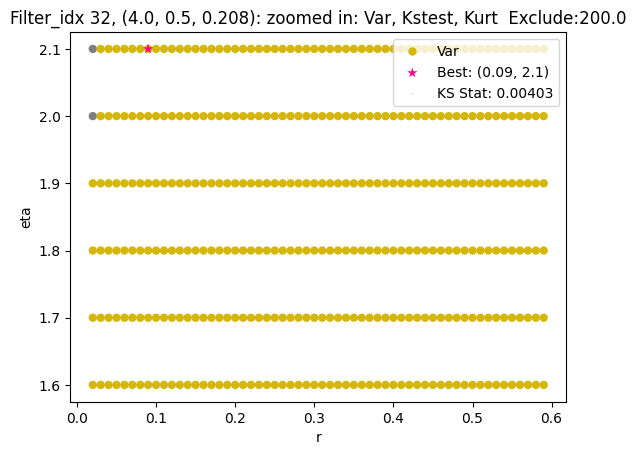

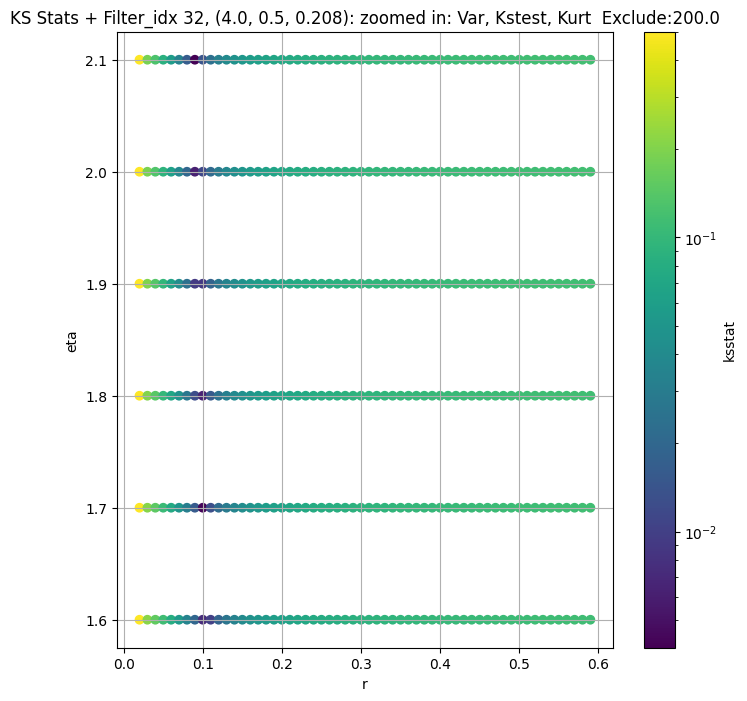

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 100 = 300, ksstat: 0.006851212598768003, var: 0.3186071813106537


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 75 = 275, ksstat: 0.008544980771778343, var: 0.32984572649002075


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 50 = 250, ksstat: 0.00866226725438779, var: 0.34280499815940857


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 25 = 225, ksstat: 0.008769800563481811, var: 0.3580622971057892


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 0 = 200, ksstat: 0.009785721345576037, var: 0.37644460797309875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -25 = 175, ksstat: 0.010815665718812095, var: 0.3992042541503906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -50 = 150, ksstat: 0.011467292411071695, var: 0.42809632420539856


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -75 = 125, ksstat: 0.013351982677550778, var: 0.465466171503067


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -100 = 100, ksstat: 0.014693921786260042, var: 0.5142903923988342
Number of samples: 100000, Without approximation : 262144000.0


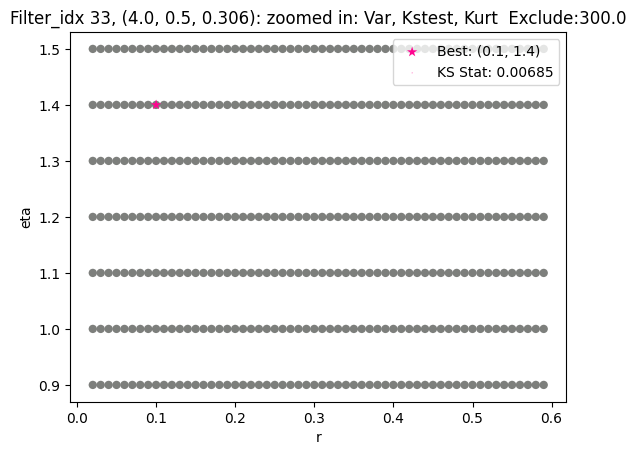

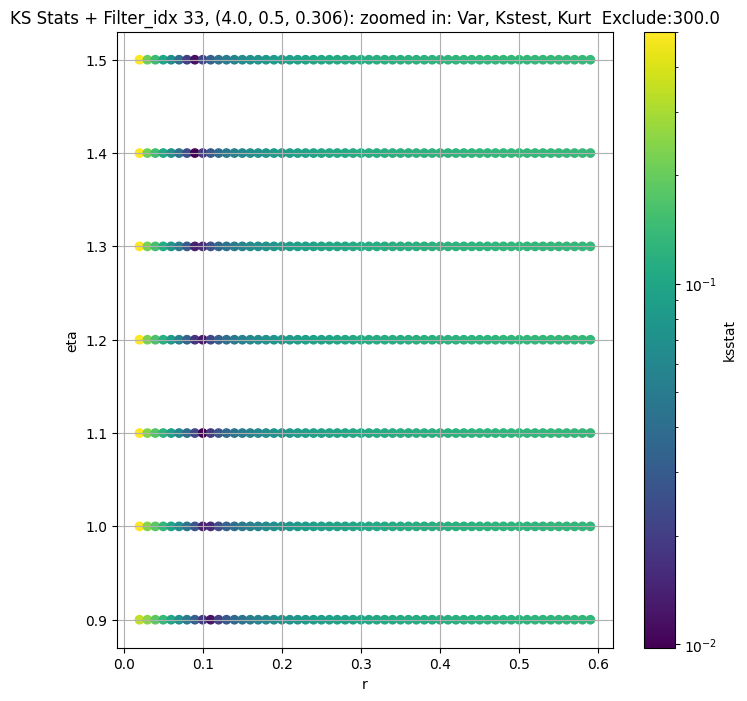

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 100 = 300, ksstat: 0.00949634508671715, var: 0.041826676577329636


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 75 = 275, ksstat: 0.008433700676798161, var: 0.04320323467254639


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 50 = 250, ksstat: 0.010213609669428636, var: 0.04474542662501335


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 25 = 225, ksstat: 0.010312368143411688, var: 0.04649767652153969


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 0 = 200, ksstat: 0.010397810348510284, var: 0.04852356016635895


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -25 = 175, ksstat: 0.012257946773502448, var: 0.05091564729809761


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -50 = 150, ksstat: 0.011385877874110606, var: 0.05382108315825462


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -75 = 125, ksstat: 0.012366875278403522, var: 0.05748346447944641


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -100 = 100, ksstat: 0.014002233619597404, var: 0.06232549250125885
Number of samples: 100000, Without approximation : 262144000.0


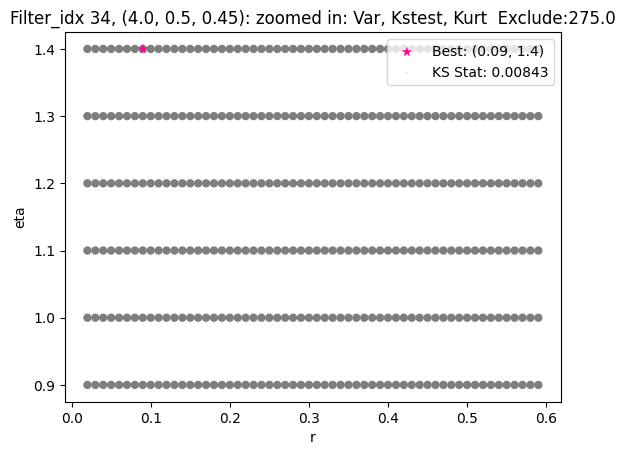

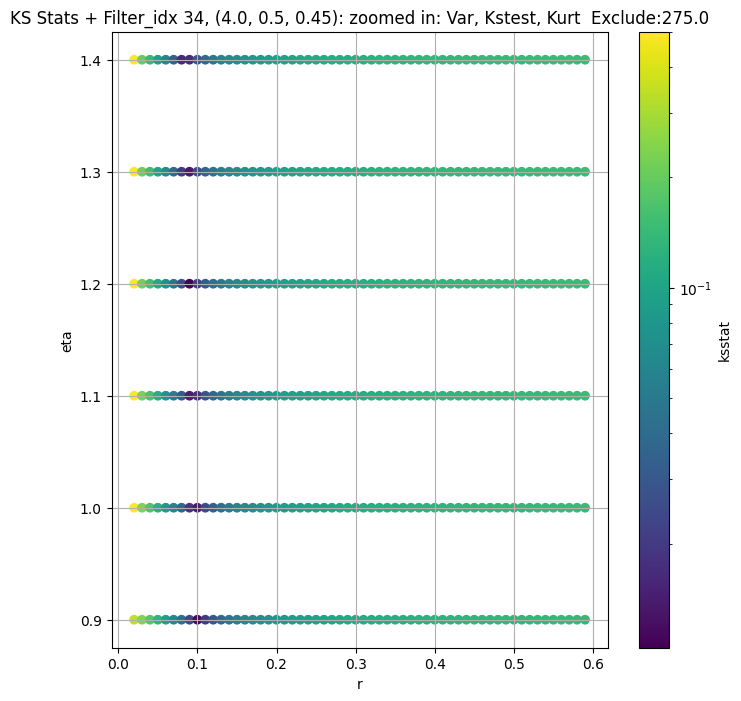

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + 100 = 200, ksstat: 0.002830870230583704, var: 23.052446365356445


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + 75 = 175, ksstat: 0.0024968534640218247, var: 23.72711944580078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + 50 = 150, ksstat: 0.002216176063926545, var: 24.513891220092773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + 25 = 125, ksstat: 0.001962859675136909, var: 25.460538864135742


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + 0 = 100, ksstat: 0.00276797661558581, var: 26.64878273010254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + -25 = 75, ksstat: 0.003908305725169203, var: 28.23472785949707


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + -50 = 50, ksstat: 0.005533741497381943, var: 30.582780838012695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + -75 = 25, ksstat: 0.008962888338826636, var: 34.779502868652344


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 35, 100.0 + -100 = 0, ksstat: 0.022038700349931495, var: 68.9345703125
Number of samples: 100000, Without approximation : 262144000.0


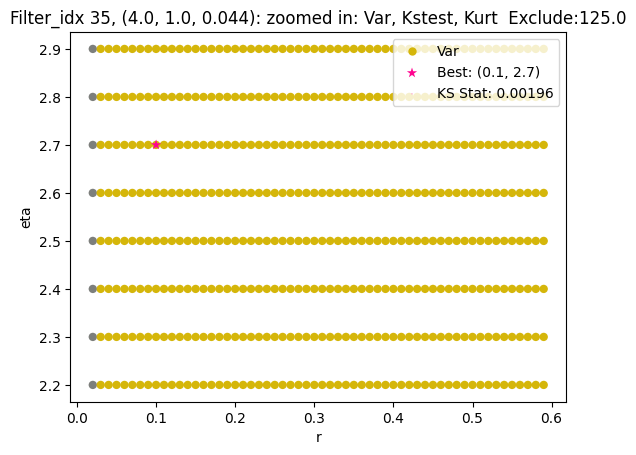

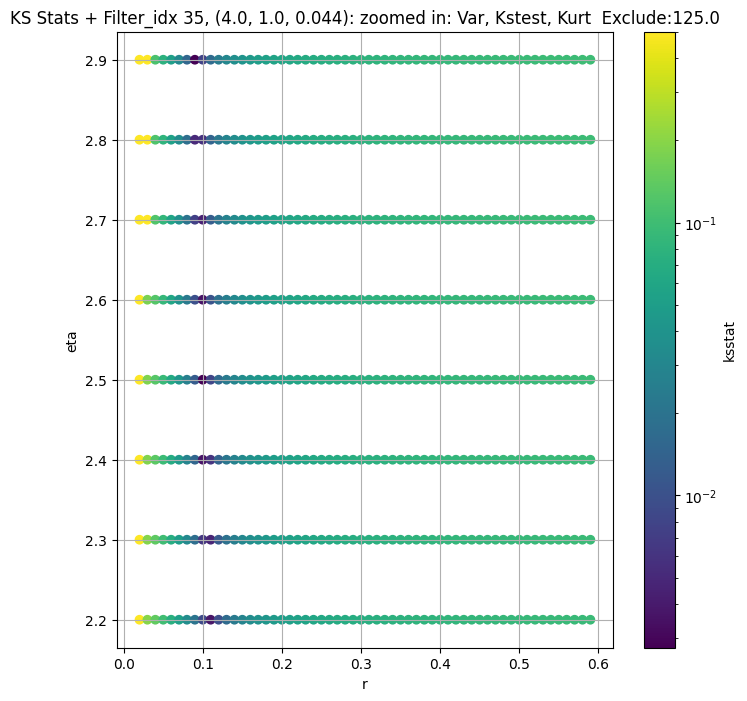

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 100 = 200, ksstat: 0.0038856355705853135, var: 11.559649467468262


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 75 = 175, ksstat: 0.0030082084583129554, var: 11.862234115600586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 50 = 150, ksstat: 0.0020261448946731764, var: 12.219093322753906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 25 = 125, ksstat: 0.0016262590619070538, var: 12.654830932617188


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 0 = 100, ksstat: 0.001369530030131405, var: 13.215459823608398


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -25 = 75, ksstat: 0.0015098603567225144, var: 13.990056037902832


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -50 = 50, ksstat: 0.003893700662808433, var: 15.17427921295166


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -75 = 25, ksstat: 0.006862545964407357, var: 17.357736587524414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -100 = 0, ksstat: 0.01720320091236864, var: 28.231224060058594
Number of samples: 100000, Without approximation : 262144000.0


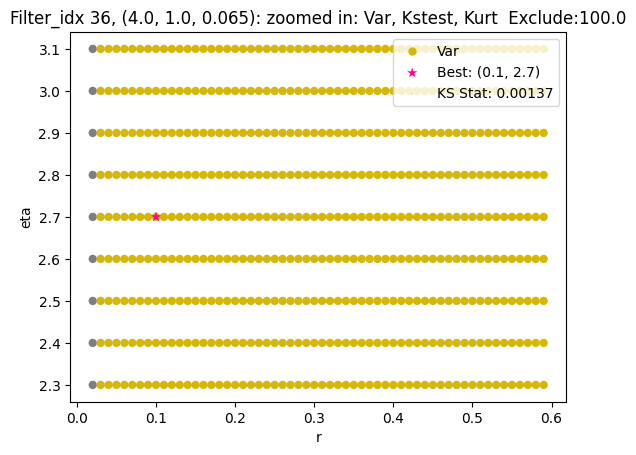

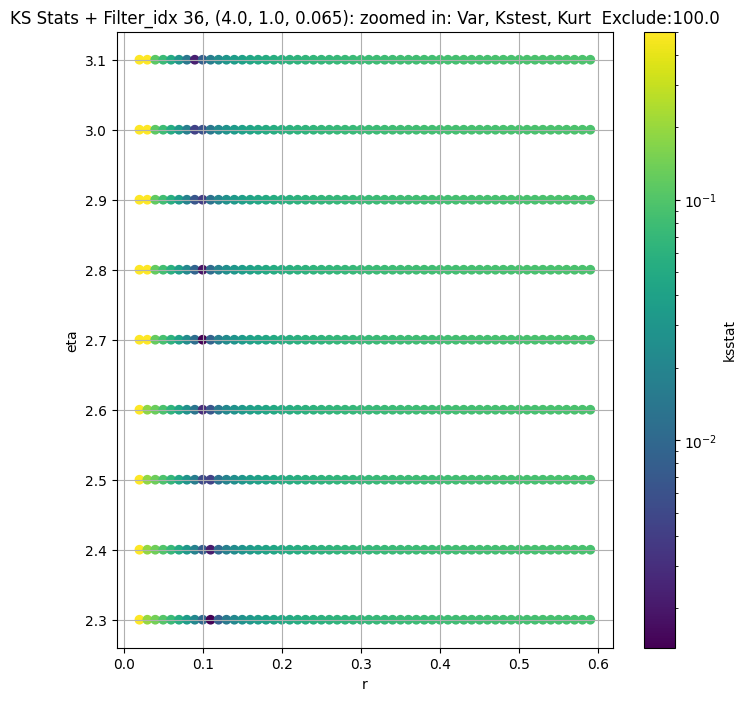

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 100 = 300, ksstat: 0.0046282113613202135, var: 8.886101722717285


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 75 = 275, ksstat: 0.0042281585679365685, var: 9.115845680236816


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 50 = 250, ksstat: 0.0038472955098669947, var: 9.37038803100586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 25 = 225, ksstat: 0.0034608263442118085, var: 9.65521240234375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 0 = 200, ksstat: 0.003149385024576184, var: 9.977930068969727


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -25 = 175, ksstat: 0.0028292012479124162, var: 10.34860610961914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -50 = 150, ksstat: 0.0034211003157399444, var: 10.781537055969238


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -75 = 125, ksstat: 0.004906209897197145, var: 11.298537254333496


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -100 = 100, ksstat: 0.005408058059762522, var: 11.931242942810059
Number of samples: 100000, Without approximation : 262144000.0


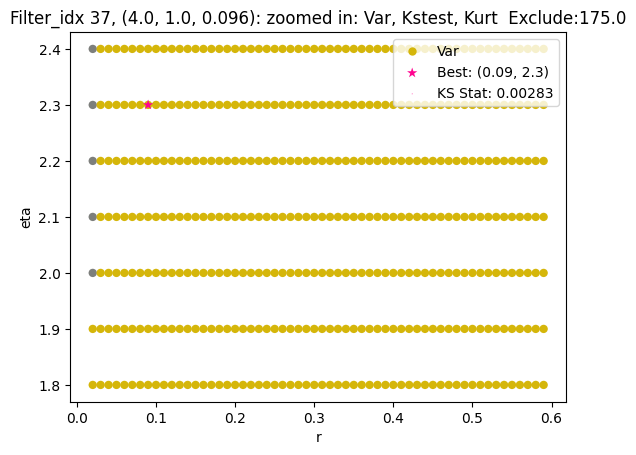

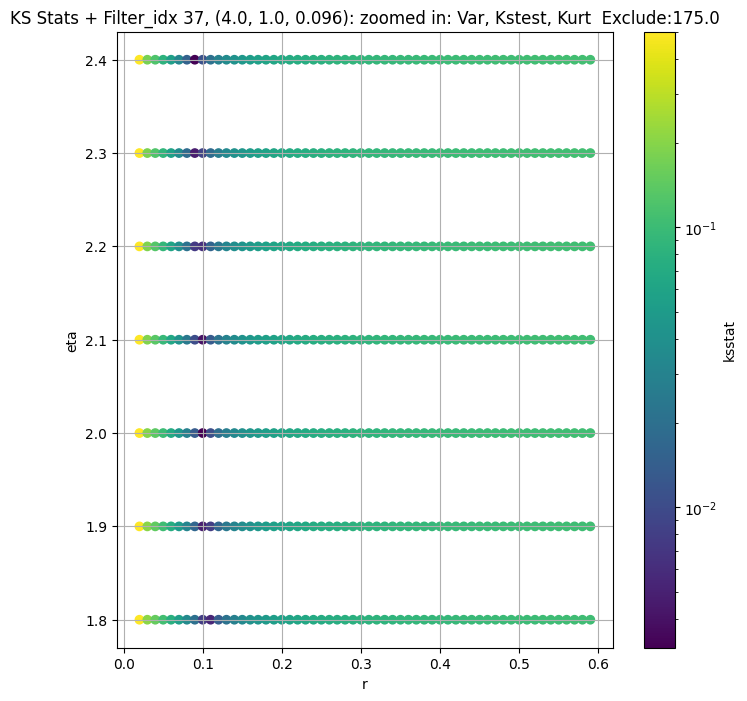

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 100 = 300, ksstat: 0.004783527370114782, var: 5.151424884796143


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 75 = 275, ksstat: 0.004494938706993632, var: 5.291179180145264


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 50 = 250, ksstat: 0.005310740143967929, var: 5.442216873168945


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 25 = 225, ksstat: 0.005651273243998889, var: 5.606599807739258


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 0 = 200, ksstat: 0.0055128936087260605, var: 5.787094593048096


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -25 = 175, ksstat: 0.00603857718673842, var: 5.9877214431762695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -50 = 150, ksstat: 0.006408230670670423, var: 6.214871406555176


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -75 = 125, ksstat: 0.007241386056557331, var: 6.479142189025879


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -100 = 100, ksstat: 0.008077540090953739, var: 6.798419952392578
Number of samples: 100000, Without approximation : 262144000.0


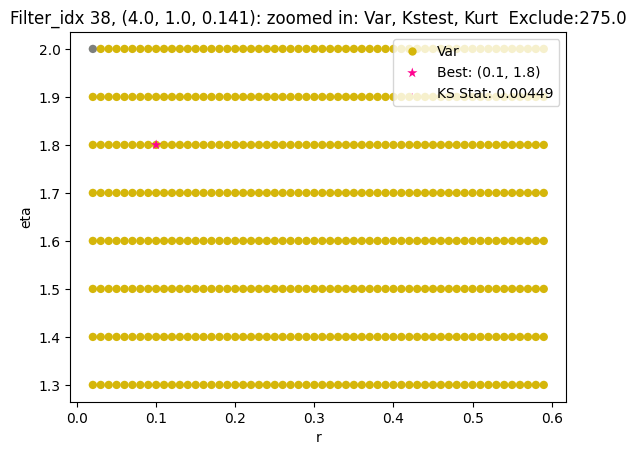

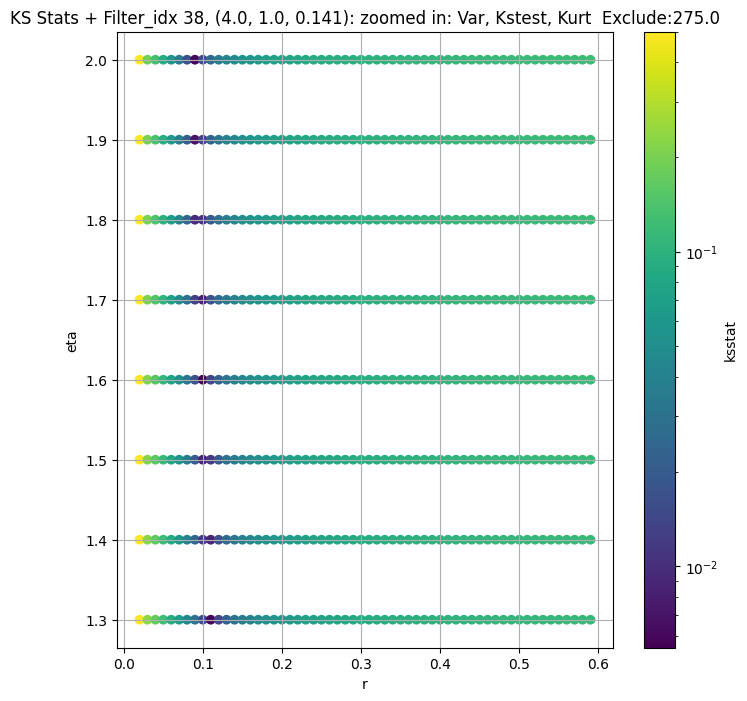

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 100 = 300, ksstat: 0.005494494380468368, var: 1.8636488914489746


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 75 = 275, ksstat: 0.006086426163081526, var: 1.9322253465652466


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 50 = 250, ksstat: 0.007312175425933265, var: 2.0095608234405518


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 25 = 225, ksstat: 0.0073340964312198775, var: 2.0975656509399414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 0 = 200, ksstat: 0.008178325889372229, var: 2.1986777782440186


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -25 = 175, ksstat: 0.009234357404900528, var: 2.3162662982940674


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -50 = 150, ksstat: 0.010540952249629143, var: 2.4550225734710693


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -75 = 125, ksstat: 0.01191163374778903, var: 2.6218771934509277


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -100 = 100, ksstat: 0.012110216618171285, var: 2.8275647163391113
Number of samples: 100000, Without approximation : 262144000.0


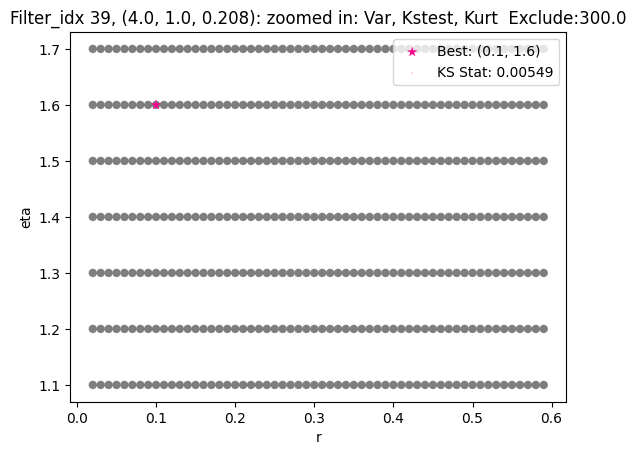

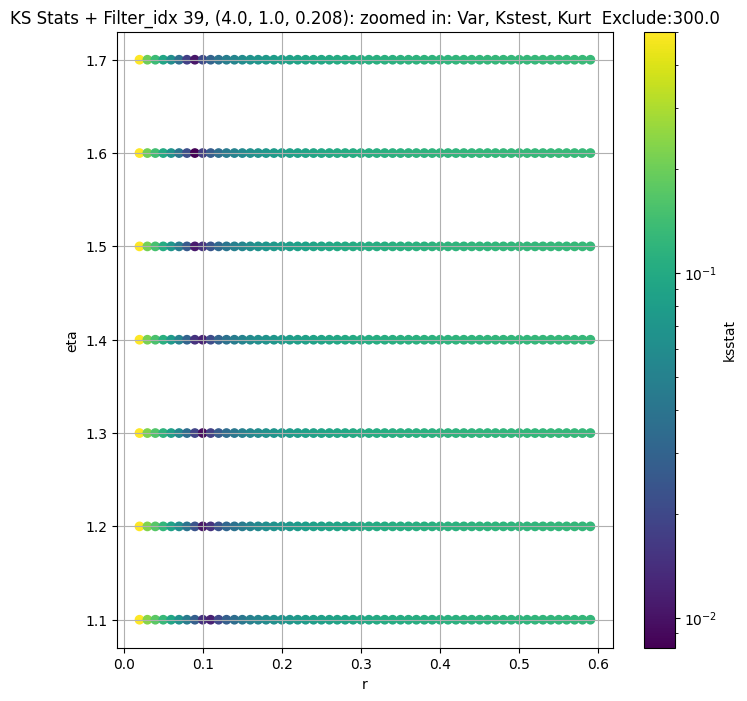

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 100 = 300, ksstat: 0.005899338252233655, var: 0.3200748860836029


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 75 = 275, ksstat: 0.005511868595600378, var: 0.32862555980682373


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 50 = 250, ksstat: 0.005968264035660531, var: 0.338026225566864


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 25 = 225, ksstat: 0.006094775401016106, var: 0.3484667241573334


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + 0 = 200, ksstat: 0.0068684104942411395, var: 0.3601967990398407


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -25 = 175, ksstat: 0.007441584977904148, var: 0.373568594455719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -50 = 150, ksstat: 0.008136616529622748, var: 0.3890804350376129


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -75 = 125, ksstat: 0.008847139909460733, var: 0.4074755907058716


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 200.0 + -100 = 100, ksstat: 0.009402132574670374, var: 0.42995527386665344
Number of samples: 100000, Without approximation : 262144000.0


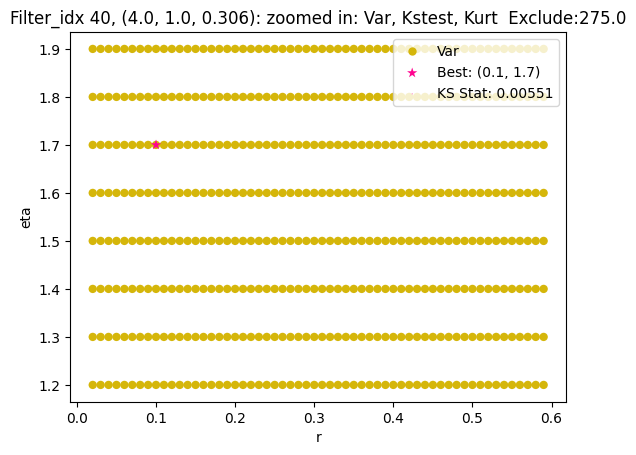

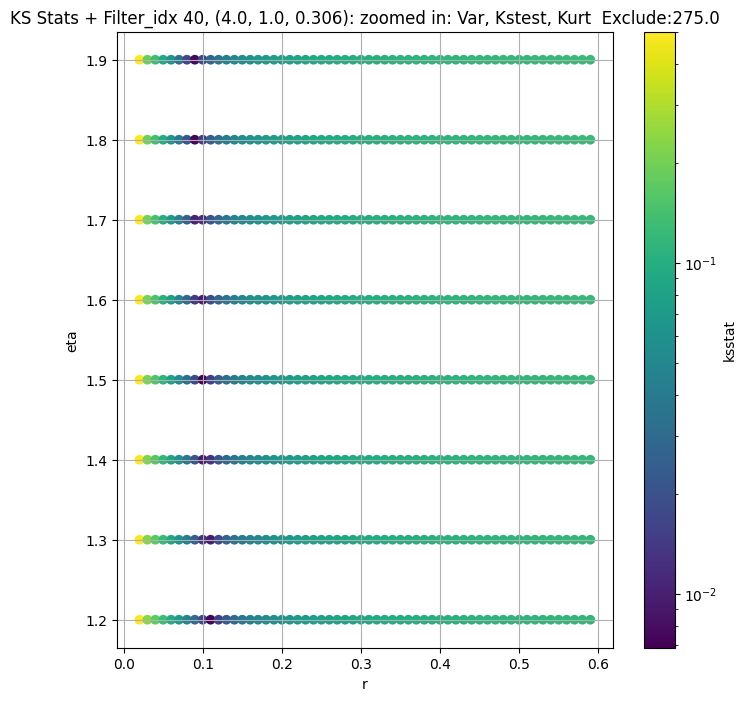

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 100 = 300, ksstat: 0.0075494692607559165, var: 0.044632088392972946


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 75 = 275, ksstat: 0.008073513363208606, var: 0.04582750052213669


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 50 = 250, ksstat: 0.008526385850120777, var: 0.04713497310876846


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 25 = 225, ksstat: 0.008826590569327608, var: 0.048579104244709015


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + 0 = 200, ksstat: 0.009351094332702092, var: 0.050193026661872864


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -25 = 175, ksstat: 0.010315512110144365, var: 0.052024733275175095


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -50 = 150, ksstat: 0.009766792177548445, var: 0.054145727306604385


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -75 = 125, ksstat: 0.011740176489759557, var: 0.056668415665626526


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 200.0 + -100 = 100, ksstat: 0.010946437092799632, var: 0.05978845804929733
Number of samples: 100000, Without approximation : 262144000.0


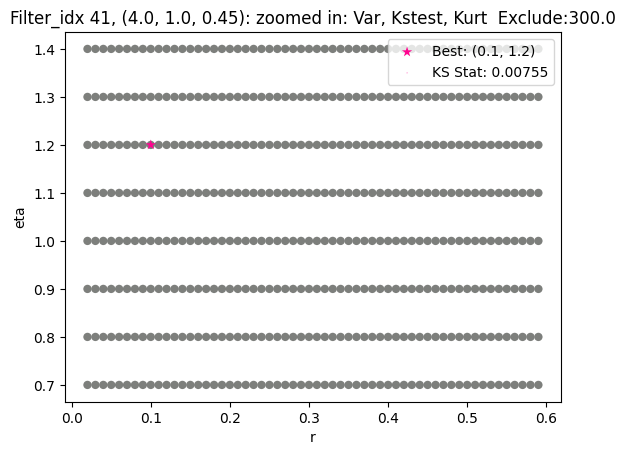

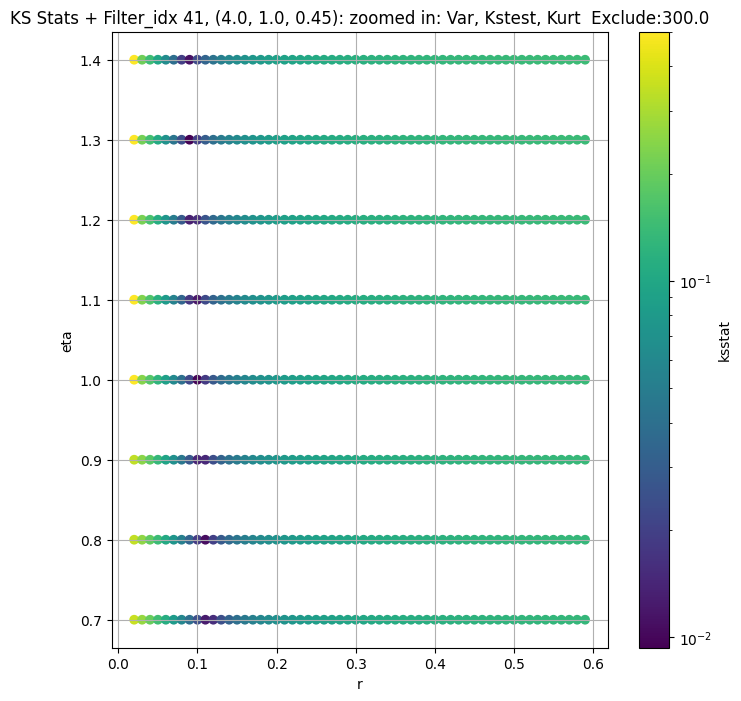

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",51.872887,22.969347,288.606600,556.33234,6.812027,731.13670,262144000.0,"(2.0, 0.5, 0.044)",0.002335,...,7.783199e-16,100.0,27.898396,0.000084,0.002083,0.10,2.8,4.859695e-16,125.0,432000
1,"(2.0, 0.5, 0.065)",23.477310,11.694446,201.420790,1299.65230,4.399985,851.55240,262144000.0,"(2.0, 0.5, 0.065)",0.001474,...,9.872281e-17,50.0,15.470115,0.000084,0.001474,0.10,3.3,9.872281e-17,50.0,864000
2,"(2.0, 0.5, 0.096)",18.258923,8.203281,104.030300,593.67505,5.334007,779.42900,262144000.0,"(2.0, 0.5, 0.096)",0.001943,...,1.758917e-16,100.0,10.703520,0.000084,0.001087,0.10,2.6,2.871421e-16,75.0,1536000
3,"(2.0, 0.5, 0.141)",10.848763,4.481118,108.215090,1874.30220,7.118456,856.95690,262144000.0,"(2.0, 0.5, 0.141)",0.002597,...,4.846568e-16,100.0,5.610655,0.000084,0.002597,0.10,2.1,4.846568e-16,100.0,288000
4,"(2.0, 0.5, 0.208)",6.613406,1.802558,46.848503,1015.11694,14.294805,876.53973,262144000.0,"(2.0, 0.5, 0.208)",0.006013,...,3.964813e-16,200.0,1.907117,0.000084,0.004495,0.10,2.1,1.647396e-16,275.0,96000
5,"(2.0, 0.5, 0.306)",0.872835,0.353022,8.381213,1746.88130,7.294063,860.37410,262144000.0,"(2.0, 0.5, 0.306)",0.005064,...,8.571404e-17,100.0,0.430212,0.000084,0.004448,0.11,1.6,8.621187e-15,150.0,96000
6,"(2.0, 0.5, 0.45)",0.756728,0.223613,6.795845,1347.04060,11.058815,863.99970,262144000.0,"(2.0, 0.5, 0.45)",0.004564,...,6.181845e-17,200.0,0.261015,0.000084,0.004292,0.09,2.0,1.496190e-19,175.0,96000
7,"(2.0, 1.0, 0.044)",95.540840,29.056345,1063.495000,2448.39900,8.085478,921.79800,262144000.0,"(2.0, 1.0, 0.044)",0.003033,...,3.021401e-16,200.0,34.168156,0.000084,0.002691,0.09,3.4,6.664062e-19,150.0,256000
8,"(2.0, 1.0, 0.065)",41.442993,14.082063,361.415200,1426.72180,6.772509,859.86170,262144000.0,"(2.0, 1.0, 0.065)",0.001678,...,3.181154e-16,100.0,18.262276,0.000084,0.001678,0.10,2.8,3.181154e-16,100.0,648000


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

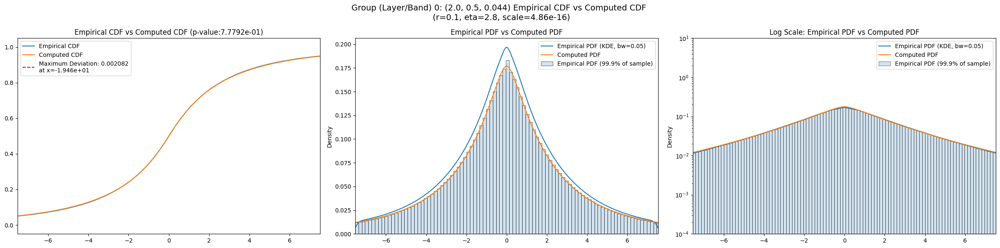

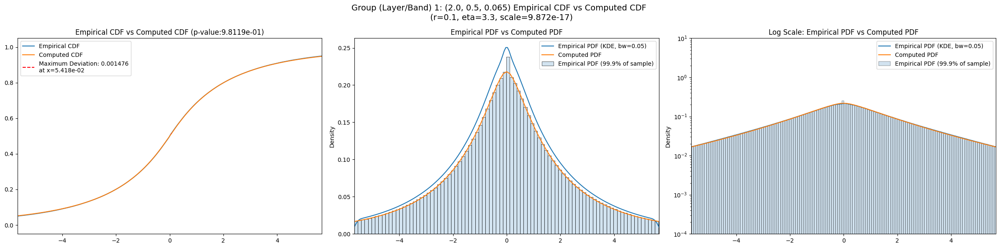

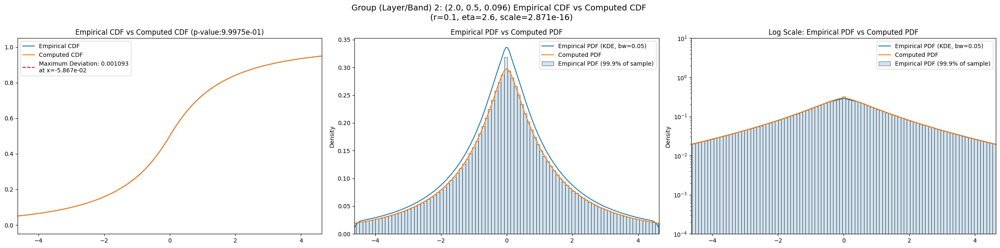

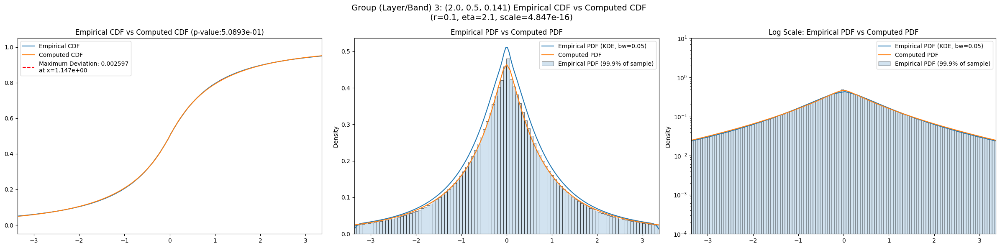

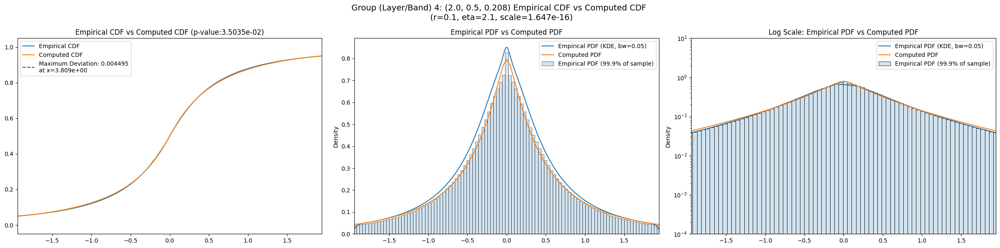

...

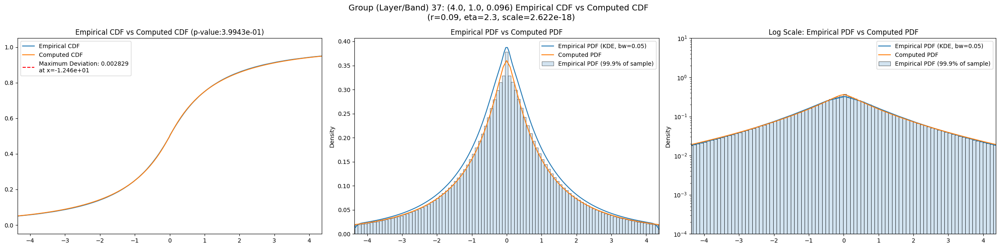

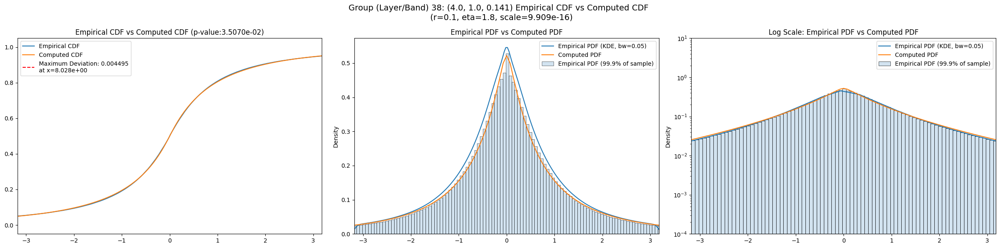

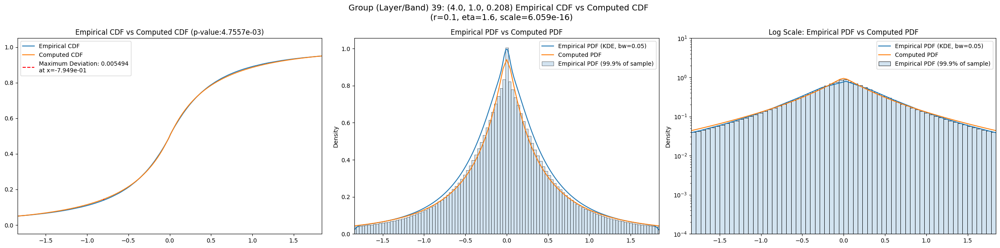

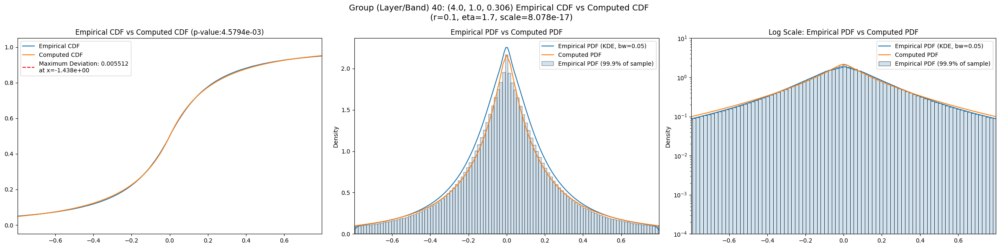

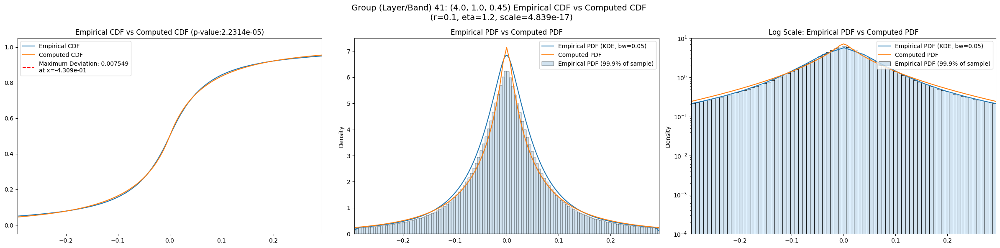

In [15]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [16]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [17]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",51.872887,22.969347,288.606600,556.33234,6.812027,731.13670,262144000.0,"(2.0, 0.5, 0.044)",0.002335,...,3.328690,0.039349,0.0,2.945260,0.013220,0.0,2.349830,0.011763,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",23.477310,11.694446,201.420790,1299.65230,4.399985,851.55240,262144000.0,"(2.0, 0.5, 0.065)",0.001474,...,2.592350,0.036695,0.0,2.283350,0.009865,0.0,1.847670,0.010455,0.0,0.000000e+00
2,"(2.0, 0.5, 0.096)",18.258923,8.203281,104.030300,593.67505,5.334007,779.42900,262144000.0,"(2.0, 0.5, 0.096)",0.001943,...,2.014610,0.041429,0.0,1.772750,0.014213,0.0,1.424860,0.014294,0.0,1.199660e-269
3,"(2.0, 0.5, 0.141)",10.848763,4.481118,108.215090,1874.30220,7.118456,856.95690,262144000.0,"(2.0, 0.5, 0.141)",0.002597,...,1.377720,0.045444,0.0,1.218550,0.019205,0.0,0.967086,0.016516,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",6.613406,1.802558,46.848503,1015.11694,14.294805,876.53973,262144000.0,"(2.0, 0.5, 0.208)",0.006013,...,0.802428,0.044208,0.0,0.713071,0.019349,0.0,0.563824,0.014414,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.872835,0.353022,8.381213,1746.88130,7.294063,860.37410,262144000.0,"(2.0, 0.5, 0.306)",0.005064,...,0.374315,0.046723,0.0,0.332172,0.021275,0.0,0.262540,0.017020,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.756728,0.223613,6.795845,1347.04060,11.058815,863.99970,262144000.0,"(2.0, 0.5, 0.45)",0.004564,...,0.276184,0.048624,0.0,0.245143,0.023060,0.0,0.193537,0.018854,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",95.540840,29.056345,1063.495000,2448.39900,8.085478,921.79800,262144000.0,"(2.0, 1.0, 0.044)",0.003033,...,3.715720,0.037901,0.0,3.285760,0.012232,0.0,2.626910,0.010069,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",41.442993,14.082063,361.415200,1426.72180,6.772509,859.86170,262144000.0,"(2.0, 1.0, 0.065)",0.001678,...,2.689060,0.038764,0.0,2.370280,0.011961,0.0,1.907020,0.011894,0.0,0.000000e+00


## Results

In [18]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [19]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.002335,0.000084,0.002083,0.039349,0.013220,0.011763
1,0.001474,0.000084,0.001474,0.036695,0.009865,0.010455
2,0.001943,0.000084,0.001087,0.041429,0.014213,0.014294
3,0.002597,0.000084,0.002597,0.045444,0.019205,0.016516
4,0.006013,0.000084,0.004495,0.044208,0.019349,0.014414
5,0.005064,0.000084,0.004448,0.046723,0.021275,0.017020
6,0.004564,0.000084,0.004292,0.048624,0.023060,0.018854
7,0.003033,0.000084,0.002691,0.037901,0.012232,0.010069
8,0.001678,0.000084,0.001678,0.038764,0.011961,0.011894


In [20]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,27.898396,0.002083,0.10,2.8,4.859695e-16,125.0
1,15.470115,0.001474,0.10,3.3,9.872281e-17,50.0
2,10.703520,0.001087,0.10,2.6,2.871421e-16,75.0
3,5.610655,0.002597,0.10,2.1,4.846568e-16,100.0
4,1.907117,0.004495,0.10,2.1,1.647396e-16,275.0
5,0.430212,0.004448,0.11,1.6,8.621187e-15,150.0
6,0.261015,0.004292,0.09,2.0,1.496190e-19,175.0
7,34.168156,0.002691,0.09,3.4,6.664062e-19,150.0
8,18.262276,0.001678,0.10,2.8,3.181154e-16,100.0
